# Experiment #1

Let's start with a simple scenario... the wind velocity rotates in a circle and the agent uses uniform probability functions bounded to a fairly tight range.

* Winds: *Oscillatory*
    * Description of the wind behavior: the wind velocity vector traces out a circle in the XY plane blowing at a constant speed of 10 m/s and changing direction at a rate of ~57 degrees (1 radian) per second.
    * base_velocity = (0, 0, 0) m/s
    * amplitude = (10, 10, 0) m/s
    * frequency = (1, 1, 0) rad/s
    * phase_offset = (0, pi/2, 0) rad
* Aiming geometry: *Spherical*
* Agent probability distributions: *Uniform* (for timing, speed, & aiming)
    * timing: [0, 2] s
    * speed: [40, 44] m/s
    * aiming:
        * Theta (X1): [-10, 10] deg --> [-0.1745329, 0.1745329] rad
        * Phi (X2): [42, 48] deg --> [0.7330383, 0.837758] rad
* Simulation sampling:
    * num_runs = 10,000
    * num_workers = 1

## Imports

In [8]:
from simulator.simulation.scientists import ExperimentRunner, ExperimentCollater
from simulator.models import SimExperiment

import numpy as np
import matplotlib.pyplot as plt

import requests

## Step 1: Generate Winds Spacetime

In [2]:
windgenparams = {
    'is_oscillatory': True,
    'amplitude': [10, 10, 0],
    'frequency': [1, 1, 0],
    'phase_offset': [0, np.pi, 0],
}
res = requests.post('http://localhost:8000/winds/wind-gen-params/', data=windgenparams)
res_data = res.json()
print(res_data)
windgenparams_id = res_data['id']
print(windgenparams_id)

{'message': 'Already exists', 'id': 'a7f87aeb-07ff-4ff9-9697-063621bc11f2'}
a7f87aeb-07ff-4ff9-9697-063621bc11f2


In [3]:
windspacetime = {
    'generator_name': 'oscillatory',
    'generator_params': windgenparams_id,
    'duration': 10,
    'timestep': 0.01,
}
res = requests.post('http://127.0.0.1:8000/winds/wind-spacetimes/', data=windspacetime)
res_data = res.json()
print(res_data)
windspacetime_id = res_data['id']
print(windspacetime_id)

{'message': 'Already exists', 'id': 'bff004b0-53c1-49a6-be2b-5a1006e6339e'}
bff004b0-53c1-49a6-be2b-5a1006e6339e


## Step 2: Run Simulation Experiment

In [4]:
experiment_params = {
        'windgenparams_id': windgenparams_id,
        'windspacetime_id': windspacetime_id,
        'num_trials': 10000,
        'timestep': 0.01,
        'prob_speed_fn_name': 'Uniform',
        'prob_speed_min': 40,
        'prob_speed_max': 44, # m/s
        'prob_speed_center': None,
        'prob_speed_spread': None,
        'prob_timing_fn_name': 'Uniform',
        'prob_timing_min': 0, # s
        'prob_timing_max': 2,
        'prob_timing_center': None,
        'prob_timing_spread': None,
        'prob_aiming_fn_name': 'Uniform',
        'prob_aiming_geometry': 'Spherical',
        'prob_aiming_X1_min': -0.1745329,  # -10 deg
        'prob_aiming_X1_max': 0.1745329,   #  10 deg
        'prob_aiming_X1_center': None,
        'prob_aiming_X1_spread': None,
        'prob_aiming_X2_min': 0.7330383,   # 42 deg
        'prob_aiming_X2_max': 0.837758, # 48 deg
        'prob_aiming_X2_center': None,
        'prob_aiming_X2_spread': None,
        'prob_aiming_X3_min': 0,      # throwaway coordinate
        'prob_aiming_X3_max': 1,
        'prob_aiming_X3_center': None,
        'prob_aiming_X3_spread': None,    
}

runner = ExperimentRunner(experiment_params)

simtrial_ids = runner.run_experiment()

collater = ExperimentCollater(experiment_params, chunked_simtrial_ids=[simtrial_ids])
simexperiment_obj = collater.save_experiment()

[Scientist] >>>>>>>>>>>>>> Running Trial #0 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 42
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [31.07999388  1.87424855 29.56873039]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.79s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [250.60839069 -41.34895128   0.29104297]
[SimTrialRunner]   >> p2: [ 2.51019355e+02 -4

 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.71540533563947,
 'time_initial': 0.8125917446975519,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.48829893 -4.29296866 29.19221966]m/s @ t_i=81 --> p_f=[164.57686955  -6.20265027   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #7 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 154
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [27.38403244 -2.17997633 30.10704901]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initi

 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.16446714746871,
 'time_initial': 1.5818611302128265,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.44351215 -4.60190554 30.25204551]m/s @ t_i=158 --> p_f=[255.88500327 -88.13042679   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #14 >>>>>>>>>>>>>>
[SimTrialRun

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



0.6808234664208443],
 'position_final': [211.75214615695978, -39.73698651071098, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.81159455428265,
 'time_initial': 0.34282680192436166,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.86570085 -1.2619973

[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.51553819e+02 1.01816607e+01 1.18993712e-01]
[SimTrialRunner]   >> p2: [151.70074285  10.29310058  -0.20433414]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [151.60789131  10.2226737    0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6861315996112463,
                       -0.04076605098274224,
                       0.7263343287372453],
 'position_final': [151.60789130984102, 10.222673703217811, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob

  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.75s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [250.54162363 -66.64555882   0.30276093]
[SimTrialRunner]   >> p2: [ 2.50932871e+02 -6.67425724e+01 -1.98076561e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [250.90884593 -66.73661514   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7233375880568677,
                       -0.02454607146852762,
                       0.6900581309422672],
 'po

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [262.13853731 -82.09686554   0.33152734]
[SimTrialRunner]   >> p2: [ 2.62512213e+02 -8.22034169e+01 -1.39050763e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [262.49717088 -82.19912781   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.673054907077611,
                       -0.048743753640035734,
                       0.7379845110433064],
 'position_final': [262.49717087513443, -82.19912781086342, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 

  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.34s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [130.96303169  76.82398187   0.22925353]
[SimTrialRunner]   >> p2: [ 1.31125766e+02  7.69905453e+01 -9.62270106e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [131.07765438  76.94130152   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7194826961398095,
                       0.05702488234378289,
                       0

 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.72118337 -3.64806794 28.64800409]m/s @ t_i=43 --> p_f=[244.09103585 -76.76726861   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #88 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 151
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.20187619  0.04575298 29.66074692]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.9s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.03045405 -1.84740715 31.75152418]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 8.36s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.68554670e+02 -7.74736119e+01  1.32890913e-01]
[SimTrialRunner]   >> p2: [ 2.68894369e+02 -7.75314810e+01 -2.14711845e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [268.68453934 -77.49573566   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_

 'prob_timing_spread': None,
 'speed_initial': 43.81715311068344,
 'time_initial': 0.6699192585955831,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.36629112 -0.33643304 32.51846653]m/s @ t_i=67 --> p_f=[237.46553981 -36.18159333   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #118 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 47
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.28774023  2.76471995 27.6625991 ]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. 

 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.96745547409652,
 'time_initial': 0.26670891735696856,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.92211107  3.84130348 31.98513401]m/s @ t_i=27 --> p_f=[212.21627666  18.36910828   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #125 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 63
 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



: 0.01}
[Scientist] Saved.
[Scientist] v_i=[27.74809559 -2.28043618 29.20344439]m/s @ t_i=162 --> p_f=[220.46079042 -60.31929451   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #148 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 58
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [32.1224734   3.47164738 29.47744139]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.94s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpo

 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.33713324650974,
 'time_initial': 1.7723101831476182,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[27.53882022  4.50666832 30.49691634]m/s @ t_i=177 --> p_f=[174.97290149  34.5816037    0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #155 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 35
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.64274263  4.81273585 31.92508235]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m      

                       0.7376795967536496],
 'position_final': [270.91372961113075, -49.77533703262203, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.9462099961491,
 'time_initial': 1.4515408233435492,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[2

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[Scientist] fields:
{'direction_initial': [0.7099831762479464,
                       -0.07543689241284911,
                       0.7001665264120883],
 'position_final': [157.56439455575128, -3.492697672858742, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.

[SimTrialRunner]  >> Trajectory duration = 7.63s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [160.11474871  39.40687485   0.2383997 ]
[SimTrialRunner]   >> p2: [ 1.60291345e+02  3.95415448e+01 -9.17300052e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [160.24227582  39.50412534   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6883166134586401,
                       0.06462748491931943,
                       0.7225257973455564],
 'position_final': [160.24227582392396, 39.50412533771132, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'pro

  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.299041   -3.88399757 29.1175341 ]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 8.22s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.29192703e+02 3.01596196e+01 4.47078351e-02]
[SimTrialRunner]   >> p2: [129.42611205  30.18036064  -0.27920382]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [129.22491893  30.16248238   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



: 1.5802611204487345,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[31.62836962 -0.85730629 28.83563758]m/s @ t_i=158 --> p_f=[250.29001445 -58.99359484   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #222 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 98
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.64489128 -4.1260889  29.16070188]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.2700000000000005s.
[SimTrialRu

 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.761049159000486,
 'time_initial': 0.47151844702390955,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.58085593  1.96546154 30.38514213]m/s @ t_i=47 --> p_f=[249.77606198 -50.68941999   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #229 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 163
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.97838835 -

[Scientist] fields:
{'direction_initial': [0.7225696522275322,
                       0.10899694740545474,
                       0.6826512749098735],
 'position_final': [118.88075959072827, 86.43685443100834, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.88

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



: 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.53128820578698,
 'time_initial': 0.38356990159275717,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.13524189  4.42012552 29.26513404]m/s @ t_i=38 --> p_f=[226.93306447 -15.53434346   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #261 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 189
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.40677472 -3.87829532 30.40875191]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] =============

 'position_final': [179.08999064215203, 6.361294624052094, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.80294195911094,
 'time_initial': 0.8032176263005721,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.12308372 -1.65081632 30.36390082]m/s @ t_i

[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.44986388e+02 3.06807964e+01 1.32512405e-01]
[SimTrialRunner]   >> p2: [145.25701367  30.69078944  -0.19079385]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [145.0973085   30.68489223   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.733053058694419,
                       -0.08141404136970505,
                       0.6752813983863385],
 'position_final': [145.09730850313375, 30.68489222904499, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_a

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.21922897671363,
 'time_initial': 0.4587931651177177,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.26757089  4.87574457 29.02696269]m/s @ t_i=46 --> p_f=[247.87939608 -28.09922449   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #305 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTr

[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [234.0240012  -75.64096657   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7294613553422205,
                       -0.0673670139415187,
                       0.6806965671243641],
 'position_final': [234.02400120435266, -75.64096657464758, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,

[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 8.3s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.50892581e+02 -2.07102633e+01  2.46258423e-01]
[SimTrialRunner]   >> p2: [ 2.51247068e+02 -2.07186116e+01 -9.50818579e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [251.14832389 -20.71628615   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6967520783992607,
                       0.09457424292077984,
                       0.7110501064076089],
 'position_final': [251.14832388674546, -20.716286148818483, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.9018796233083,
 'time_initial': 0.15413905414754536,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[31.57675455 -0.59830049 29.03656116]m/s @ t_i=15 --> p_f=[160.43610811  33.35536007   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #345 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 196
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.28118797 -4.14802361 27.07203889]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunn

 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.64382674665204,
 'time_initial': 1.477017970690807,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.4780919  -3.99232627 30.12088842]m/s @ t_i=148 --> p_f=[247.47094323 -89.1424526    0.        ]m.
.
[Scienti

[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 1.97503050e+02 -4.54298779e+01  1.68067161e-01]
[SimTrialRunner]   >> p2: [ 1.97852471e+02 -4.55438910e+01 -1.64506049e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [197.67963131 -45.48749486   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6727781731544793,
                       -0.09972944780613326,
                       0.7330917861817886],
 'position_final': [197.67963131321744, -45.487494861669404, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread':

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 60
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.03978212  3.35600201 30.62428432]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.18s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.39223772e+02 -3.32674285e+01  1.37265118e-01]
[SimTrialRunner]   >> p2: [ 2.39638655e+02 -3.33683528e+01 -2.00028039e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final

 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.01641909288758,
 'time_initial': 0.20803194518570733,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.22992327 -2.32741522 29.66481427]m/s @ t_i=21 --> p_f=[161.85988353   3.33449337   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #397 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 105
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.9339832   4.60179041 31.94254795]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef  

                       0.7271666804121042],
 'position_final': [238.03482286465814, -69.83110219076816, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.14868405094614,
 'time_initial': 0.3933470051636956,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[Scientist] Saved.
[Scientist] v_i=[28.72448183 -1.65127802 27.8272918 ]m/s @ t_i=60 --> p_f=[221.5195881  -58.48999289   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #431 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 143
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.30730317  5.14838512 28.2118098 ]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.54s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating f

 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.061923249735585,
 'time_initial': 0.10643608703148066,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.87960116  0.93877696 30.56620229]m/s @ t_i=11 --> p_f=[136.44430833  58.94850646   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #438 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 28
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.8659928  -2.30589311 31.54939462]
  >> timestep     = 0.01
  >> g    

 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.18357164402428,
 'time_initial': 1.5219861741354337,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[27.52437817 -4.09911977 28.98836411]m/s @ t_i=152 --> p_f=[232.46050297 -86.13821239   0.        ]m.
.
[Scient

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.77245275292047,
 'time_initial': 1.4284763056107874,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.80047965  2.05280423 28.14345851]m/s @ t_i=143 --> p_f=[241.59331506 -41.75121566   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #472 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ===============================

[SimTrialRunner]   >> p_final: [122.24157402  32.1152256    0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.730398795108282,
                       -0.10813276534682506,
                       0.6744070767443193],
 'position_final': [122.24157401645927, 32.11522560464261, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 '

[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.66s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [190.84334058  11.59727142   0.27383512]
[SimTrialRunner]   >> p2: [ 1.91100861e+02  1.16811350e+01 -3.39235044e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [191.07247501  11.67189089   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7298139522347128,
                       0.11077979225253522,
                       0.6746105785948168],
 'position_final': [191.0724750071321, 11.671890892297704, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



'speed_initial': 41.30020589599988,
 'time_initial': 0.2670094598941155,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[27.57882458 -4.1018619  30.46785471]m/s @ t_i=27 --> p_f=[185.27635412 -31.88668081   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #518 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 140
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.18362449 -5.02642424 30.86537504]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Tra

 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.13641001900617,
 'time_initial': 1.897742634644078,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.60614293 -1.22432646 30.91385872]m/s @ t_i=190 --> p_f=[136.64648203  44.63383572   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #525 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 6
  >> p_initial    = [ 0  0 10]
  >> v

{'direction_initial': [0.7307955925079864,
                       -0.10289567903190242,
                       0.6747964739145166],
 'position_final': [146.41709114052122, 14.503816852483032, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.930692353626654,
 't

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.3996082518656,
 'time_initial': 0.7173094795694992,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[27.70182352  2.3731631  30.67416884]m/s @ t_i=72 --> p_f=[1.97521306e+02 1.85069694e-01 0.00000000e+00]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #556 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 3
  >> p_initial    = [ 0  0 10]

[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.76s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [227.0712522  -41.87572078   0.23066263]
[SimTrialRunner]   >> p2: [ 2.27424868e+02 -4.19395153e+01 -9.85458492e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [227.31901574 -41.92041895   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.710934373185721,
                       -0.02666763435849057,
                       0.7027525555277248],
 'position_final': [227.31901573873893, -41.920418949263855, 0.0],
 'position_initial': [0, 0, 10],
 

[Scientist] v_i=[31.07623817 -4.19817497 30.09973758]m/s @ t_i=25 --> p_f=[197.69101099 -24.00405859   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #575 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 55
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.75015591  3.8685214  29.12233094]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.84s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position be

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



: 43.161925840916325,
 'time_initial': 0.6204757081045618,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.27076133 -2.33764743 31.63399719]m/s @ t_i=62 --> p_f=[249.35277586 -67.26110736   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #600 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 54
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.99771233  1.84349922 29.33749544]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duratio

 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.93005767060989,
 'time_initial': 1.902269487149064,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[31.4318906   5.20630138 28.77360824]m/s @ t_i=190 --> p_f=[146.73838276  80.59249746   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #607 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 14
  

 'position_final': [260.6323206140964, -44.86793021011404, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.634548498414766,
 'time_initial': 0.48706718113507463,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.59480593  3.50961329 31.42808321]m/s @ t

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.17084805005466,
 'time_initial': 0.42338760324366187,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.45694411 -0.55651598 28.75791131]m/s @ t_i=42 --> p_f=[235.15410287 -55.92191111   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #643 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run param

[SimTrialRunner]   >> p_final: [144.47610005  59.87577638   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6931994460925407,
                       0.03905323237368108,
                       0.719686996532633],
 'position_final': [144.4761000543042, 59.875776378194196, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'p

[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.45s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [137.10654225  65.31496659   0.18935839]
[SimTrialRunner]   >> p2: [137.22712135  65.50821929  -0.1427149 ]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [137.17530016  65.42516522   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.718106583793388,
                       0.008235970222890096,
                       0.695884403552111],
 'position_final': [137.1753001572631, 65.42516521503843, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'p

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.13198737447313,
 'time_initial': 0.25730181005114994,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[27.66639913 -1.68099587 30.39054125]m/s @ t_i=26 --> p_f=[181.27380326 -11.88575371   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #685 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 91
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.05190469  4.42473911 29.55596475]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunn

 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.99379900390198,
 'time_initial': 0.9300416573490802,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.47215184  3.0917139  32.51596411]m/s @ t_i=93 --> p_f=[141.08807894  84.68363951   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #692 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ==

[SimTrialRunner]   >> p_final: [248.60002301 -49.62750464   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6957138492643816,
                       0.04053528270213899,
                       0.7171744075174428],
 'position_final': [248.60002300618808, -49.62750463821076, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.067392965371695,
 'time_initial': 1.4428580629205527,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.5305813  -1.09566863 29.51840453]m/s @ t_i=144 --> p_f=[237.98967929 -63.80193387   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #718 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 8
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.18372193  0.40743268 30.46681759]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Init

[SimTrialRunner]   >> p2: [ 1.28010730e+02  8.96253120e+01 -1.64569955e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [128.00551292  89.61476847   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6730004801052847,
                       0.09709384533870015,
                       0.7332415284034319],
 'position_final': [128.00551291642543, 89.61476847060324, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform'

[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.17s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [236.53125197 -10.97929316   0.34409342]
[SimTrialRunner]   >> p2: [ 2.36937086e+02 -1.10544057e+01 -5.07630248e-03]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [236.9311858  -11.05331375   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6809253969143783,
                       0.07254266293438481,
                       0.7287511000961745],
 'position_final': [236.93118580283286, -11.05331374708491, 0.0],
 'position_initial': [0, 0, 10],
 '

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



,
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.98314632079209,
 'time_initial': 0.8884126253375957,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.68313701  4.96895369 31.62495878]m/s @ t_i=89 --> p_f=[141.59337111  85.86516067   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Tria

[SimTrialRunner]   >> p2: [ 2.50230346e+02 -5.08722240e+01 -1.56715462e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [249.99960033 -50.78797182   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7009418758651866,
                       0.035052306199683234,
                       0.712356527652184],
 'position_final': [249.99960032801084, -50.787971824256275, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Unifor

  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.49s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [118.7414329   41.07993747   0.1325448 ]
[SimTrialRunner]   >> p2: [118.8287477   41.24195398  -0.19775004]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [118.77647167  41.14495346   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6804462567593498,
                       -0.07131281954510214,
                       0.7293198018912669],
 'position_final': [118.77647166594583, 41.144953457717065, 0.0],
 'position_initial': 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



'speed_initial': 43.28794623103163,
 'time_initial': 0.6741090912385184,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.1086767  -1.82795348 31.04790593]m/s @ t_i=67 --> p_f=[234.98347783 -47.01340182   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #796 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 55
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.19172277  4.91064391 27.46346534]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Traj

{'direction_initial': [0.7122789058552081,
                       -0.10000793197272999,
                       0.6947353264490337],
 'position_final': [233.94955854364824, -81.01375830454187, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.80108331476262,
 'ti

[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.7700000000000005s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.22037365e+02 -1.95951551e+01  1.62695188e-01]
[SimTrialRunner]   >> p2: [ 2.22387905e+02 -1.96303646e+01 -1.68019217e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [222.20981296 -19.6124764    0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.710618813614353,
                       0.030472454449743072,
                       0.7029170159109379],
 'position_final': [222.20981296430017, -19.612476396111504, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.50894773844742,
 'time_initial': 1.137215711605037,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[26.99905494  3.39535977 30.00828904]m/s @ t_i=114 --> p_f=[130.95762293  64.91185069   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #835 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 71
  >

[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.725546388021935,
                       -0.10491156612105848,
                       0.6801294010130355],
 'position_final': [142.37830439674792, 6.8484477016015495, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': 

[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7157623462956285,
                       0.08412881130654758,
                       0.6932579655031192],
 'position_final': [260.31748931731244, -39.96550298716253, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [152.11737256  74.87938253   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.723270076200294,
                       0.11623047814051508,
                       0.680713502748732],
 'position_final': [152.1173725578783, 74.87938253323779, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'p

 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.21679719947815,
 'time_initial': 0.7356399789055359,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[27.87718382 -4.82076183 31.33497796]m/s @ t_i=74 --> p_f=[193.24991563 -38.71320325   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #881 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 146
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.86917096 -2.65063554 31.7899394 ]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajecto

 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.36130683352437,
 'time_initial': 1.8871556917285957,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.97614481 -2.5891818  30.23206114]m/s @ t_i=189 --> p_f=[153.17033893  30.99746003   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #888 >>>>>>>>>>>>>>
[SimTrialRu

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[31.43793582  2.2381561  30.44675448]m/s @ t_i=102 --> p_f=[139.90507493  79.98371689   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #912 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 143
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.85782332 -3.89401237 30.49560302]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.98s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunn

 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.3576487183026,
 'time_initial': 0.7432612388590147,
 'timestep': 0.01}
[Scientist] Saved.'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.492459834125754,
 'time_initial': 0.3952494686927299,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.75941025  3.41129592 30.13884046]m/s @ t_i=40 --> p_f=[242.70106387 -28.0986352

[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.57168702e+02 -9.16979812e+01  3.70414165e-02]
[SimTrialRunner]   >> p2: [257.66313672 -91.93901523  -0.29900279]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [257.22320235 -91.72454985   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6937076336535574,
                       -0.10024901176041179,
                       0.7132459986931877],
 'position_final': [257.2232023523332, -91.72454984565334, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'pr

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.158124640106806,
 'time_initial': 1.318457843514598,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.05017118  1.51097615 27.68536582]m/s @ t_i=132 --> p_f=[199.68237399 -16.48611767   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #948 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ===============================

[SimTrialRunner]   >> p_final: [117.68953582  91.68523706   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6659853674324088,
                       0.10124496427050929,
                       0.7390622081907467],
 'position_final': [117.68953581948995, 91.68523706302072, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 '

[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 8.13s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.16992035e+02 -4.73697907e+01  7.97266793e-02]
[SimTrialRunner]   >> p2: [217.40328491 -47.51683158  -0.25111696]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [217.09113796 -47.40522464   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7030673908515254,
                       -0.0784357492500944,
                       0.706784321530129],
 'position_final': [217.09113795965374, -47.40522463565946, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[SimTrialRunner]  >> Trajectory duration = 8.14s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.46291891e+02 1.75915559e+01 3.58714396e-02]
[SimTrialRunner]   >> p2: [146.59479048  17.55045135  -0.2875892 ]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [146.32548253  17.58699741   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.708731698015382,
                       -0.07708737167328766,
                       0.7012538180692763],
 'position_final': [146.32548252980519, 17.586997410680866, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_

 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.50630374148534,
 'time_initial': 1.0319809702928657,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.68155851  0.53989985 31.36658361]m/s @ t_i=103 --> p_f=[124.68531946  71.35298402   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #997 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 85
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.26776543 -4.

{'direction_initial': [0.6854485287025044,
                       0.0792847426918864,
                       0.7237915750240903],
 'position_final': [237.25372865847515, -34.98577851918151, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.24069698349899,
 'time

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.640000000000001s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.23639317e+02 7.54801565e+01 6.88470984e-03]
[SimTrialRunner]   >> p2: [123.75557466  75.66559531  -0.33247687]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [123.64167582  75.48391856   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6829991809159914,
                       0.031573411295205946,
                       0.7297364171858689],
 'position_final':

[Scientist] v_i=[30.54829556  3.82295145 28.59601964]m/s @ t_i=65 --> p_f=[224.56166783 -12.47802221   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #1033 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 8
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.50374442  4.12568391 28.33952131]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.22s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position be

  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.8500000000000005s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [225.82234536 -45.08946952   0.26465502]
[SimTrialRunner]   >> p2: [ 2.26224135e+02 -4.52114867e+01 -6.77686763e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [226.14222507 -45.18661201   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6873246586818068,
                       -0.012984657101131431,
                       0.7262342681586319],
 'position_final': [226.14222506884323, -45.1866120050822, 0.0]

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



: 41.09847736799177,
 'time_initial': 1.2981716937276055,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[27.58125922 -1.07244988 30.45010399]m/s @ t_i=130 --> p_f=[197.34370079 -24.23655298   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #1060 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 76
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.40163014  0.77253868 31.36436956]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory durati

 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.26715103716432,
 'time_initial': 0.1782143436295318,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.64554449 -2.09924242 27.16943734]m/s @ t_i=18 --> p_f=[148.9188752   13.46575004   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #1069 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 60
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.55831881  4.41788791 31.62796787]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTria

 'position_final': [229.26439188508976, -62.46501046154817, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.775810751860845,
 'time_initial': 0.4103621105056565,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.36530776 -1.86346925 29.23360294]m/s @ t

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



0.6684276299555296,
                       0.11771388023463254,
                       0.7344031222102343],
 'position_final': [197.92639416798966, 27.400101903511374, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.71749455996922,
 'time_initial': 1.737178301

 'time_initial': 0.04826280777950198,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[27.75274808  0.86946967 30.15265435]m/s @ t_i=5 --> p_f=[117.45232813  67.79983701   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #1104 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 151
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.82996112  5.0461465  27.77267167]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.54s.
[SimTrial

 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.05389048998774,
 'time_initial': 0.33461009922792373,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.35463962 -1.03733538 27.23129104]m/s @ t_i=33 --> p_f=[202.01358961 -34.7465737    0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #1111 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 167
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.03129332  

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.333536309301856,
 'time_initial': 1.2448166487830845,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[27.00737218  1.46763603 29.92059564]m/s @ t_i=124 --> p_f=[166.60664354  16.40849242   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #1142 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 198
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [31.510

[Scientist] fields:
{'direction_initial': [0.7094118624075638,
                       0.08476104680834597,
                       0.699678765162546],
 'position_final': [147.24171724042134, 56.34560919459597, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.224

[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.07s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [248.21542818 -50.8401964    0.25230618]
[SimTrialRunner]   >> p2: [ 2.48691477e+02 -5.10121231e+01 -8.15383818e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [248.57520657 -50.97013166   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.688590007313603,
                       0.03863394319943955,
                       0.7241209983564313],
 'position_final': [248.57520657020206, -50.97013166095985, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread'

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.811766343981546,
 'time_initial': 0.11485525264673435,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[31.84919113 -3.74642937 29.85069784]m/s @ t_i=11 --> p_f=[153.68976078  26.55125217   0.        ]m.
.
[Scient

{'direction_initial': [0.6674498404143698,
                       0.08184174892164531,
                       0.7401436608282738],
 'position_final': [122.99484538939932, 88.71889345132848, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.24185226120296,
 'time

[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.8100000000000005s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.44753856e+02 -8.28140555e+01  4.63157865e-02]
[SimTrialRunner]   >> p2: [245.17038967 -82.97313363  -0.27852383]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [244.81324523 -82.83673696   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7040346300907526,
                       -0.0825755328198448,
                       0.7053485103213134],
 'position_final': [244.81324523317232, -82.83673695629514, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_ai

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.28s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.38648219e+02 4.60760506e+01 7.07332228e-02]
[SimTrialRunner]   >> p2: [138.86831492  46.15828598  -0.24570362]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [138.69741728  46.09443272   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7091905591507263,
                       0.04272198929525221,
                       0.7037212391580466],
 'position_final': [138.6974172813809, 46.094432719850296, 

[Scientist] v_i=[29.77351283 -1.15021735 31.94666358]m/s @ t_i=163 --> p_f=[251.45855857 -56.19245963   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #1222 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 166
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.49880025 -3.33491083 27.08245132]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.55s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position

 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': [Scientist] Saved.
[Scientist] v_i=[29.54975559 -3.25210496 28.50918567]m/s @ t_i=16 --> p_f=[149.03213579  12.79244793   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #1233 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 143
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.90194968 -1.53753802 31.37473128]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrial

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.05267135047712,
 'time_initial': 1.364103409118128,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[27.9199448   2.63015175 29.98134101]m/s @ t_i=136 --> p_f=[218.03228137 -21.31946468   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #1252 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 107
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.5707624   1.

[SimTrialRunner]   >> p2: [ 1.17688400e+02  5.10681604e+01 -1.04048042e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [117.68360013  51.06452258   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6832702126582845,
                       -0.02863643812712388,
                       0.7296038451826402],
 'position_final': [117.68360013265033, 51.064522582601484, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Unifor

 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.463351592833654,
 'time_initial': 1.1637653267717802,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.40953065  0.40146939 29.63503832]m/s @ t_i=116 --> p_f=[158.0378325   38.28258135   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #1267 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 73
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.01127709  1.63066996 29.61298496]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] R

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.24s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.46483794e+02 4.42099736e+01 4.17903811e-02]
[SimTrialRunner]   >> p2: [146.73079768  44.26517865  -0.28398725]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [146.51547932  44.2170552    0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.729227390635847,
                       -0.024462149954302317,
                       0.683834055868854],
 'position_final': [146.51547931550448, 44.217055198504156, 0.0],
 'position_initial': [0, 0, 10],
 'pro

[Scientist] v_i=[31.94430057 -3.066039   29.14603282]m/s @ t_i=13 --> p_f=[157.33712115  23.92892133   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #1296 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 39
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.13843972  0.66492007 30.21582512]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.890000000000001s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for fin

  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 8.25s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.33282385e+02 -1.55988992e+01  5.45685865e-02]
[SimTrialRunner]   >> p2: [233.63235805 -15.63384577  -0.29925022]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [233.33636021 -15.60428889   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6722974573391802,
                       0.04597620639387297,
                       0.7388520266608878],
 'position_final': [233.336360

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



: 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.081551111776385,
 'time_initial': 0.770616973395607,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.29727954  3.68834301 27.49845123]m/s @ t_i=77 --> p_f=[173.07015299  29.42873786   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #1332 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 44
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.96062702  4.59540115 28.5533929 ]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m 

                       0.7383113278299289],
 'position_final': [215.41304182118958, -68.4161181164165, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.94172997760691,
 'time_initial': 1.3609038377823461,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[2

[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 1.85695105e+02 -1.19951417e+01  1.11614265e-01]
[SimTrialRunner]   >> p2: [186.0812825  -12.1060418   -0.21405271]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [185.82745783 -12.03314996   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6963830316659382,
                       -0.02326730218207002,
                       0.7172930404353057],
 'position_final': [185.82745782603962, -12.03314996092582, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



: 42.14038093280486,
 'time_initial': 1.3297150690174293,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.351899   -0.22282573 31.175822  ]m/s @ t_i=133 --> p_f=[219.83715144 -32.17366438   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #1365 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 73
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.63589551 -0.46924413 31.24712633]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory durati

 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.702962683024545,
 'time_initial': 1.9531628503234457,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[31.25209746 -2.07372308 30.4787635 ]m/s @ t_i=195 --> p_f=[142.82836577  47.87412465   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Tria

[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [142.40721121  -0.14553241   0.22001009]
[SimTrialRunner]   >> p2: [ 1.42729062e+02 -2.27481226e-01 -8.78393094e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [142.63722741  -0.2040986    0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.720499779873156,
                       -0.12266284658037804,
                       0.6825202511805288],
 'position_final': [142.6372274082996, -0.20409859958405738, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'p

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




[SimTrialRunner]   >> p1: [1.28296718e+02 7.46314889e+01 5.92359748e-02]
[SimTrialRunner]   >> p2: [128.42089816  74.82046967  -0.27443921]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [128.31876328  74.66503788   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6622529122041334,
                       0.10675843720928961,
                       0.7416358381050463],
 'position_final': [128.3187632794051, 74.66503788019847, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherica

  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.6000000000000005s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [234.92013637 -69.80522805   0.29838035]
[SimTrialRunner]   >> p2: [ 2.35218741e+02 -6.98335960e+01 -1.76839159e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [235.20203439 -69.83200878   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7121868299829436,
                       -0.04394150837191191,
                       0.7006133477467061],
 'position_fina

[Scientist] v_i=[29.98710069  1.41560985 27.74772412]m/s @ t_i=137 --> p_f=[221.18881887 -32.5700379    0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #1425 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 50
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.28986532 -1.13088805 30.1797023 ]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.99s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 56
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.28038403 -4.06329243 28.25565609]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.68s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.40649359e+02 -8.07251001e+01  1.43657151e-01]
[SimTrialRunner]   >> p2: [ 2.40991558e+02 -8.08051280e+01 -1.72196288e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [240.80499851 -80.7

 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.41259398848392,
 'time_initial': 1.5103022414588556,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[27.76224328 -3.91265601 30.47871243]m/s @ t_i=151 --> p_f=[247.12796486 -91.25331901   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #1455 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 12
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.67857443 -4.11280906 28.26735655]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner]

 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.95584373794555,
 'time_initial': 1.1930565227603003,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[27.82248725  3.84205111 31.16794299]m/s @ t_i=119 --> p_f=[158.30278759  52.89902409   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #1462 >>>>>>>>>>>>>>
[SimTrialR

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



,
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.47846086104329,
 'time_initial': 0.8832483239328033,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.75842196 -1.03146199 30.71208432]m/s @ t_i=88 --> p_f=[156.01002001  39.6280093    0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #1485 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 34
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.95052696  4.31164669 29.40440057]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTr

                       0.7198303909883954],
 'position_final': [123.71590207421222, 56.54612402193186, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.73175272492904,
 'time_initial': 0.9813507316696894,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[2

  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.91s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [118.86166947  53.78010073   0.29034018]
[SimTrialRunner]   >> p2: [ 1.19138707e+02  5.37927308e+01 -1.87796949e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [119.12187623  53.79196345   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7254831929264453,
                       -0.0020014896002257198,
                       0.6882369728666358],
 'position_final': [119.12187623483592, 53.79196345474025, 0.0],
 'position_

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.3500000000000005s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.39883611e+02 3.74378554e+01 2.76088670e-02]
[SimTrialRunner]   >> p2: [140.04926131  37.54797758  -0.30378229]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [139.89741201  37.4470299    0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7008202232881617,
                       -0.045072106296970164,
                       0.7119125788074585],
 'position_final': [139.89741200903808, 37.44702989878399, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center'

 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.61193063268485,
 'time_initial': 1.8111034303188165,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.56878225 -1.81185629 29.22254376]m/s @ t_i=181 --> p_f=[165.28405259   9.355219     0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #1527 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ================================

[SimTrialRunner]   >> p_final: [168.20947372  46.03938112   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6847990627120409,
                       0.04944736109461275,
                       0.7270524067696146],
 'position_final': [168.2094737237039, 46.0393811205131, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'pr

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6816135994352434,
                       -0.08606540433220713,
                       0.7266330898342472],
 'position_final': [122.96475322116315, 31.82118371913033, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_m

 'speed_initial': 41.6590539881836,
 'time_initial': 1.7197768975269507,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.43691416  0.36204455 30.44154424]m/s @ t_i=172 --> p_f=[201.02736895 -13.01315618   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #1572 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 149
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.92822649 -4.14785209 31.61024085]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> T

 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.965287666888216,
 'time_initial': 0.49485463398788143,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.00087941  1.41456914 28.89814494]m/s @ t_i=49 --> p_f=[241.10807932 -51.65416105   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #1579 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 93
  >> p_initial    = [ 0  0 10]
  

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



41.210940864476555,
 'time_initial': 0.2877119225462359,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.50601244 -0.57754033 29.75592964]m/s @ t_i=29 --> p_f=[195.21285671 -16.60373047   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #1601 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 156
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.24868845 -1.37359402 28.4512145 ]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duratio

 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.65857187972907,
 'time_initial': 1.4630983525390489,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.89002765 -0.95556531 29.00189223]m/s @ t_i=146 --> p_f=[245.33883868 -64.52824676   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #1608 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 172
  >> p_initial    = [ 0  0 10]
  

[SimTrialRunner]   >> p_final: [242.89776129 -78.50692662   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6934808651818379,
                       -0.06534538135875367,
                       0.7175055893592248],
 'position_final': [242.89776128810263, -78.50692662034662, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.66445315168543,
 'time_initial': 0.7325300101969354,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.03324555 -4.55762623 30.92821138]m/s @ t_i=73 --> p_f=[203.4654178  -41.35709739   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #1642 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 141
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.2774519  -0.12973061 29.51555759]
  >> timestep     = 0.01
  >> g 

{'direction_initial': [0.735680381327561,
                       -0.08464411745146612,
                       0.6720191588865579],
 'position_final': [237.29464174514376, -76.67165657031772, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.1765660005266,
 'time

[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.42s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.55478288e+02 5.82221995e+01 8.96606228e-02]
[SimTrialRunner]   >> p2: [155.647583    58.39592255  -0.23231882]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [155.52543076  58.27057563   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7139680528369132,
                       0.10683222949032348,
                       0.6919801256325167],
 'position_final': [155.5254307616814, 58.270575633984784, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': N

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[SimTrialRunner]   >> p1: [229.52647556 -51.31985951   0.24747008]
[SimTrialRunner]   >> p2: [ 2.29916264e+02 -5.14487301e+01 -1.02310885e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [229.80225062 -51.41103544   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6674027474854257,
                       -0.06282319197561231,
                       0.7420423297891438],
 'position_final': [229.80225061785313, -51.41103544030399, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Sph

  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.76s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.36369276e+02 -2.73862158e+01  3.99182438e-02]
[SimTrialRunner]   >> p2: [236.74958493 -27.42560612  -0.27749685]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [236.41710386 -27.39116953   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7348735032634707,
                       0.07450414555991554,
                       0.6740994485205137],
 'position_final': [236.417103

 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.83892713060377,
 'time_initial': 1.6839092054221552,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.00054028 -1.31544385 30.55177357]m/s @ t_i=168 --> p_f=[227.38113908 -39.49492531   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #1690 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 198
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.98081571  4.26595546 29.20910843]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef 

                       0.7230807502447727],
 'position_final': [161.09775008727433, 11.216552811866766, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.852475641052756,
 'time_initial': 0.14575057096539146,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i

[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [266.18033851 -93.41122323   0.28682753]
[SimTrialRunner]   >> p2: [ 2.66530997e+02 -9.35092949e+01 -6.33655110e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [266.46754697 -93.49154939   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6672212232332181,
                       -0.08455650472957674,
                       0.7400446180975071],
 'position_final': [266.46754697044304, -93.49154939155774, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[206.60228538388213, 2.537452999115132, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.1273549162522,
 'time_initial': 0.325974238643975,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[27.44229484  4.76697221 30.25980424]m/s @ t_i=33 --> p_f=[206.6022

[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [171.27149917   1.25010303   0.21652107]
[SimTrialRunner]   >> p2: [ 1.71449872e+02  1.32543858e+00 -1.31896900e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [171.38234719   1.2969196    0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6750157915173892,
                       -0.09220640085714904,
                       0.7320188937746918],
 'position_final': [171.3823471924925, 1.296919600419203, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'pro

                       0.6859505849945814],
 'position_final': [220.4882215715091, -10.466969282367838, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.0903605230119,
 'time_initial': 0.3690159398909265,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[2

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




{'direction_initial': [0.7128852037897655,
                       0.10719276556035826,
                       0.6930399679882443],
 'position_final': [140.34113271473169, 83.56159977699276, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': [Scientist] Saved.
[Scientist] v_i=[29.68594555 -0.30465562 31.26939727]m/s @ t_i=195 --> p_f=[134.31525337  62.23849425   0.        ]m.
.
[Scientist] >>>>>>>

[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [156.48173629  30.51566748   0.18148531]
[SimTrialRunner]   >> p2: [ 1.56668036e+02  3.06174989e+01 -1.52468371e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [156.5829801   30.57100722   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.702108926788069,
                       -0.02475395627108249,
                       0.7116391617761316],
 'position_final': [156.5829800968703, 30.571007215818554, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'pro

  >> v_initial    = [29.45236088  4.23011323 28.68413828]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.47s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [188.71564415  19.44204584   0.23738158]
[SimTrialRunner]   >> p2: [ 1.88927595e+02  1.95669193e+01 -8.20350379e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [188.87316047  19.53484833   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7126257867842131,
          

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [168.71016401  29.32102452   0.28405731]
[SimTrialRunner]   >> p2: [ 1.69069191e+02  2.92855783e+01 -3.24949110e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [169.03233561  29.28921692   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.724572852920959,
                       0.05835426033134012,
                       0.6867233512202454],
 'position_final': [169.032335608914, 29.289216924783805, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'pro

  >> v_initial    = [29.53165894  4.94964366 30.5886545 ]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 8.540000000000001s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [129.28999135  96.56254073   0.24020196]
[SimTrialRunner]   >> p2: [ 1.29387868e+02  9.68094774e+01 -9.64664954e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [129.35982296  96.73872196   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.689908495168136

[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 118
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.5497868 -3.8174865 29.5223599]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.54s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [152.44312434   4.3596596    0.32332075]
[SimTrialRunner]   >> p2: [ 1.52586833e+02  4.46327413e+00 -3.40965597e-03]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [152.58533311   4.46219284   0

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.849740945397635,
 'time_initial': 1.173232899008141,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.28455479 -1.15524297 28.86021435]m/s @ t_i=117 --> p_f=[158.11447362  23.11425117   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #1842 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 47
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.73322607  1.14175357 28.70164866]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajecto

 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.528092486155096,
 'time_initial': 1.2927017080607812,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.99276836  4.87343584 28.30664118]m/s @ t_i=129 --> p_f=[197.9803454   15.20572762   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #1849 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[S

[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [156.24212719  50.29230661   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7117897387257068,
                       0.037423044389019715,
                       0.7013949554947252],
 'position_final': [156.2421271949152, 50.29230660978247, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.9s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.14809790e+02 -3.76178244e+01  6.50189693e-02]
[SimTrialRunner]   >> p2: [215.21271531 -37.75186977  -0.27378687]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [214.88711378 -37.64354853   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7017456349813648,
                       -0.08342850062869146,
                       0.7075257939237619],
 'position_final': [214.88711377860378, -37.64354853296277, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'pr

[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 189
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.66127321  4.03897733 30.83963191]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 8.51s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [139.51301548  76.30863808   0.20350063]
[SimTrialRunner]   >> p2: [ 1.39622774e+02  7.65258819e+01 -1.35563056e-01]
[SimTrialRunner] Interpolat

 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.21800547667152,
 'time_initial': 0.24079085075427797,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.51503892 -0.56092308 29.1698089 ]m/s @ t_i=24 --> p_f=[185.98686183   2.17031061   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #1894 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 127
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.64240054  4.50803811 31.54427024]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] R

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.57664959219413,
 'time_initial': 1.59660932040652,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[27.04180894 -4.38465659 29.93292248]m/s @ t_i=160 --> p_f=[227.02512134 -81.3483056    0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #1917 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 23
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.5867308  -1.86512898 27.9491296 ]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialR

 'position_final': [209.4933994300693, -3.0756289633195095, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.80501867443217,
 'time_initial': 1.3410300473881533,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.43292402  4.82314515 27.84761755]m/s @ t_

[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [121.3220036   63.07055932   0.18959481]
[SimTrialRunner]   >> p2: [121.51689532  63.16789037  -0.13594858]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [121.43550755  63.12724442   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6887784576414964,
                       0.03239705112291187,
                       0.7242476561008264],
 'position_final': [121.43550754670146, 63.12724442468355, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



: None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.68630907226628,
 'time_initial': 1.6855524794898076,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[27.4105372  -3.38521302 29.87605277]m/s @ t_i=169 --> p_f=[201.98964021 -47.781476     0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #1948 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 54
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.91236882 -2.48132268 28.83919984]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ==================

[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 50
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.83336835  2.74691782 31.76023044]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.3s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.64812451e+02 -5.06981106e+01  1.91919352e-01]
[SimTrialRunner]   >> p2: [ 2.65182046e+02 -5.07519033e+01 -1.55596344e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [265.01656402 -50.72

 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.048651435932875,
 'time_initial': 1.593226815904449,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.62590391  4.09653334 31.88984839]m/s @ t_i=159 --> p_f=[254.25124219 -31.38414706   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #1969 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 35
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.23722903 -0.36198062 31.91707247]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner]

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.68174373901719,
 'time_initial': 1.9352623265736766,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.24523688 -3.82889403 28.01892154]m/s @ t_i=194 --> p_f=[121.42818796  32.5645508    0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #1990 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 74
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.20869002 -3.22189074 29.71503914]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ========================

 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.60783120345842,
 'time_initial': 1.8179328831378097,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.77488564  2.43897751 30.37984289]m/s @ t_i=182 --> p_f=[169.13006483  40.79163306   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #1997 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] 

[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7191846989585837,
                       0.09712388716945314,
                       0.6879973250856042],
 'position_final': [134.81110978640473, 88.6607887294968, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': No

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.35041188253981,
 'time_initial': 0.8613729482200196,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[27.99521234 -0.80148296 29.04791645]m/s @ t_i=86 --> p_f=[137.59578916  32.57950234   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #2032 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ==

[SimTrialRunner]   >> p_final: [162.12967033 -11.81379365   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6668961776564056,
                       -0.08119785470185237,
                       0.7407134375850709],
 'position_final': [162.1296703315779, -11.813793646320907, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,


[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.44s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [118.53839492  69.75815565   0.2147188 ]
[SimTrialRunner]   >> p2: [ 1.18635835e+02  6.99558509e+01 -1.14048131e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [118.60203358  69.8872711    0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.687973293857688,
                       0.03222638973613996,
                       0.7250201423017002],
 'position_final': [118.60203357971311, 69.88727109536453, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




{'direction_initial': [0.7253377945959351,
                       0.08122642768220104,
                       0.683584194651027],
 'position_final': [221.71941179123866, -20.946538111647175, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.03911222952963,
 'ti

[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 8.27s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.44265305e+02 7.85359342e+01 2.33522848e-02]
[SimTrialRunner]   >> p2: [144.49041139  78.66392012  -0.30245457]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [144.28143961  78.54510758   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7328819051820651,
                       0.08066096972679969,
                       0.6755574890558455],
 'position_final': [144.2814396130625, 78.54510758248252, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': No

 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.553281020647454,
 'time_initial': 1.3640053606438647,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.94112957 -0.62203031 29.81105937]m/s @ t_i=136 --> p_f=[223.3831086  -41.97262292   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #2083 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 76
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.75853613 -2.05668112 28.36082439]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ===========================

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.051826681476406,
 'time_initial': 0.0021852420268799744,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.61585059 -3.6347855  30.59865286]m/s @ t_i=0 --> p_f=[121.62241971  42.23044927   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #2106 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 18
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.6019242

{'direction_initial': [0.7078110188098441,
                       0.028916644367453247,
                       0.7058097401778306],
 'position_final': [234.16956722153736, -48.517582434485774, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.685839703546534,
 '

[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.34s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.43675125e+02 6.61851765e+01 6.75157343e-02]
[SimTrialRunner]   >> p2: [143.85697791  66.33485689  -0.25915239]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [143.71271071  66.21611241   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7403512823210929,
                       0.01666832929642926,
                       0.6720135010280517],
 'position_final': [143.71271070546962, 66.21611241051158, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': N

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.23392818745348,
 'time_initial': 1.7316251452185691,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.86258379 -3.66800543 29.63910451]m/s @ t_i=173 --> p_f=[200.77540158 -33.84907697   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #2143 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 92
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [27.81324236 -3.20179229 28.87569237]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] 

 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.466487055811214,
 'time_initial': 1.272464811123541,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.7667846  -1.11037151 30.68399481]m/s @ t_i=127 --> p_f=[207.63011142 -12.61861681   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #2154 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 67
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.47761534 -4.3375727  28.31292847]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball traject

 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.753587812973166,
 'time_initial': 1.2828704338275656,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.11676023  2.49543638 28.40496419]m/s @ t_i=128 --> p_f=[189.37176897   4.51900511   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #2161 >>>>>>>>>>>>>>
[SimTrial

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




[SimTrialRunner] Run parameters are:
  >> t_initial    = 163
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [27.81591824  2.18126202 28.90013668]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.87s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [215.4028658  -28.82040458   0.29733916]
[SimTrialRunner]   >> p2: [ 2.15808258e+02 -2.89258252e+01 -2.38414712e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [215.77816565 -28.91799975   0.        ]
[SimTrialRunner] Run complete.
[Scienti

 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.906129622115884,
 'time_initial': 1.0732712902833907,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.52276624  1.72475213 30.10518112]m/s @ t_i=107 --> p_f=[137.88006079  70.53859022   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #2186 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 50
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.42442943 -2.04235797 29.85580084]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Comple

[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [162.88585189  19.53166217   0.30090658]
[SimTrialRunner]   >> p2: [ 1.63155465e+02  1.95380213e+01 -3.84777830e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [163.12489734  19.53730036   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6943779561089001,
                       -0.0535860261399202,
                       0.717612563903781],
 'position_final': [163.12489733606247, 19.537300358914592, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'pro

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7043314869485717,
                       0.12129544991271177,
                       0.6994316051790103],
 'position_final': [137.86275931473958, 64.89061211473488, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_m

[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.15s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.20678273e+02 4.25838591e+01 4.99165638e-02]
[SimTrialRunner]   >> p2: [120.94409119  42.58656451  -0.26516321]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [120.72038557  42.58428773   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7193994260762938,
                       -0.05890002239429533,
                       0.6920948295739904],
 'position_final': [120.72038557341651, 42.58428772587571, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_

[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 133
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.63263479  0.72561148 28.96426973]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.59s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.06678572e+02 -2.34831149e+01  5.41871100e-02]
[SimTrialRunner]   >> p2: [206.92259065 -23.43355146  -0.26831419]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [206.71957205 -23.4747872  

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.393108931903875,
 'time_initial': 1.778572995991595,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.40790383 -0.35661085 27.68846818]m/s @ t_i=178 --> p_f=[165.0610482    9.10189845   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #2258 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner

[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 54
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.73273463  2.4853704  31.15534696]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.22s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.71032599e+02 -4.98000191e+01  2.57065769e-01]
[SimTrialRunner]   >> p2: [ 2.71467686e+02 -4.99029255e+01 -8.47267617e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [271.35983245 -49.8

 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.28978808367232,
 'time_initial': 1.156305749428238,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.23118687 -2.50762157 31.83167134]m/s @ t_i=116 --> p_f=[160.55763014  21.14855617   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #2275 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 195
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.02466034 -2.36193043 27.55127151]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunne

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



: [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.596905338021955,
 'time_initial': 1.9286137048487944,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.44316841 -0.18624343 28.34574649]m/s @ t_i=193 --> p_f=[132.16432029  53.06756208   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>

[SimTrialRunner]   >> p2: [ 1.48037745e+02  3.94150887e+01 -1.25919458e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [147.91603025  39.41018093   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7408028884544535,
                       0.01676349873301174,
                       0.6715132653699157],
 'position_final': [147.91603025122842, 39.41018092811769, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform'

[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.69s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.31270001e+02 -7.91595963e+01  3.23502577e-02]
[SimTrialRunner]   >> p2: [231.60031258 -79.24217125  -0.2855412 ]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [231.30361498 -79.16799951   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6995320985027875,
                       -0.0811748136348709,
                       0.709975698735971],
 'position_final': [231.30361498412447, -79.16799951339263, 0.0],
 'position_initial': [0, 0, 10],
 'p

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.74s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [137.13405014  64.86099466   0.18049459]
[SimTrialRunner]   >> p2: [137.32161785  64.97401481  -0.16422427]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [137.23226049  64.92017195   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.697638612334808,
                       -0.013023198033834716,
                       0.7163314616101508],
 'position_final': [137.23226048650412, 64.9201719450748, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329

[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================: 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.932507979670824,
 'time_initial': 1.762132278548874,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[27.7079128  -4.71646984 29.75729642]m/s @ t_i=176 --> p_f=[176.07131604 -29.02954557   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #2338 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 162
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.15655225  1.48581385 30.30627697]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialR

 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.46410470215749,
 'time_initial': 0.4354869909690968,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.70894544 -2.03977249 28.85290051]m/s @ t_i=44 --> p_f=[240.67669035 -68.57139786   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #2345 >>>>>>>>>>>>>>
[SimTrialRu

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



: 43.97438341323953,
 'time_initial': 0.9605180329526359,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.15893796 -5.07506362 32.52301435]m/s @ t_i=96 --> p_f=[134.46441615  32.54704443   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #2370 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 53
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.49225828 -2.05722469 28.3799706 ]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duratio

 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.17388323042416,
 'time_initial': 0.42345750789953174,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.08290153 -0.1841091  27.7144698 ]m/s @ t_i=42 --> p_f=[227.07685468 -53.683062     0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #2377 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 151
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.56722561 -

[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7228487634109281,
                       -0.03475448517872101,
                       0.6901317200326719],
 'position_final': [140.01521874359662, 49.27570435409157, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_s

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



,
 'prob_timing_spread': None,
 'speed_initial': 40.750238029228576,
 'time_initial': 0.7795658014510896,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[27.6572596  -2.40608856 29.83066592]m/s @ t_i=78 --> p_f=[168.29756618  -6.44380606   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #2404 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 86
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.77422868 -4.57097218 30.48930037]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground

[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [178.4717064   10.47078964   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.69735793396194,
                       -0.009396832143146062,
                       0.7166614343509828],
 'position_final': [178.47170639703097, 10.470789640096255, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,

[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.5600000000000005s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.64605388e+02 8.69114711e+00 3.69620282e-02]
[SimTrialRunner]   >> p2: [164.77153303   8.79877209  -0.28975437]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [164.62418413   8.70332293   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6989000515831719,
                       -0.0342377792317387,
                       0.7143993927561237],
 'position_final': [164.62418413018415, 8.7033229269552, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.36472841e+02 -8.43872631e+01  9.15299443e-02]
[SimTrialRunner]   >> p2: [ 2.36773510e+02 -8.44394266e+01 -2.25336866e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [236.55969212 -84.40233102   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7128357611317367,
                       -0.10501658314831595,
                       0.6934238926627712],
 'position_final': [236.5596921212485, -84.40233102028041, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_mi

  >> v_initial    = [29.86396111 -1.53676111 30.9957371 ]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.66s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [130.58485483  57.22448121   0.21834397]
[SimTrialRunner]   >> p2: [ 1.30719949e+02  5.73726587e+01 -1.22101664e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [130.67149738  57.31951446   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6933953018234258,
          

 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.14436486563751,
 'time_initial': 0.6407581733683858,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.5405513   3.2227793  29.88506337]m/s @ t_i=64 --> p_f=[232.32063595 -21.96959363   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #2462 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 87
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [27.63816878  0.84074199 30.68162969]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Ini

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.94942228440778,
 'time_initial': 1.82212890436681,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[31.61720444  0.03555802 30.52708368]m/s @ t_i=182 --> p_f=[181.75730737  25.41478979   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #2480 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ===================================

  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.48s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.49928447e+02 7.39795656e+01 5.57933052e-02]
[SimTrialRunner]   >> p2: [150.06702237  74.19194273  -0.27322273]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [149.95194568  74.01557973   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7348540875333557,
                       0.06343529278298382,
                       0.6752521259981759],
 'position_final': [149.95194567911167, 74.01557972601947, 0

[Scientist] v_i=[28.29654563 -1.93441356 29.96936057]m/s @ t_i=69 --> p_f=[208.39364636 -38.70865768   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #2498 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 5
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.54633413  1.12138032 29.59237101]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.43s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position be

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.16s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [235.80814991 -72.89636649   0.26329689]
[SimTrialRunner]   >> p2: [ 2.36219786e+02 -7.30677197e+01 -8.41135314e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [236.12012238 -73.02623237   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6631441426800012,
                       -0.10237878675567837,
                      

 'time_initial': 1.0289209491076443,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[ 2.93865833e+01 -1.38377956e-02  2.86455770e+01]m/s @ t_i=103 --> p_f=[122.18266625  59.34004699   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #2525 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 20
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [2.88996059e+01 1.61065862e-02 2.98013295e+01]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory durati

 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.75114150243434,
 'time_initial': 1.301842887782747,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.78269867 -0.79467053 29.65559072]m/s @ t_i=130 --> p_f=[213.0385587  -21.84232362   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #2537 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[Sim

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.087382490904204,
 'time_initial': 1.7796168809577309,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.46012464 -4.17525002 30.72354728]m/s @ t_i=178 --> p_f=[177.83654546 -17.95961759   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #2559 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ================================

[SimTrialRunner]   >> p_final: [232.38911302 -40.00817587   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6813789215559282,
                       -0.006325684306290586,
                       0.7319035120679073],
 'position_final': [232.3891130166793, -40.0081758701419, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 

[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.96s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [201.17538959 -30.26066262   0.31453627]
[SimTrialRunner]   >> p2: [ 2.01589842e+02 -3.04007739e+01 -7.08221857e-03]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [201.58071583 -30.39768855   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7145435623493341,
                       -0.05363694446330305,
                       0.6975317739671532],
 'position_final': [201.5807158271432, -30.397688551803036, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'pro

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




  >> v_initial    = [27.13699052  1.18201074 29.93894028]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 8.39s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.16532441e+02 6.55587374e+01 2.60430122e-02]
[SimTrialRunner]   >> p2: [116.64237827  65.73198984  -0.30535058]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [116.54108031  65.57235265   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6712978436958226,
            

  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 8.21s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [118.56018724  34.05993419   0.12623266]
[SimTrialRunner]   >> p2: [118.78562791  34.08065501  -0.19429328]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [118.64897249  34.06809467   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7042298688662441,
                       -0.10320453040156319,
                       0.7024308625773967],
 'position_final': [118.64897248824096, 34.06809466954231, 0.0],


[Scientist] v_i=[27.39627772  4.44666344 29.33549307]m/s @ t_i=38 --> p_f=[216.39477676 -15.34995133   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #2612 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 83
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [32.21402547 -0.85616683 29.79250848]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.25s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position b

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.52510819377431,
 'time_initial': 0.9201769332640772,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.15346358 -3.6653162  29.34238622]m/s @ t_i=92 --> p_f=[131.15360078  29.80342245   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #2636 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 89
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.354619

[Scientist] fields:
{'direction_initial': [0.6776440235045512,
                       -0.0830925967197094,
                       0.7306806400739921],
 'position_final': [128.21784024456315, 41.85487227175919, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.77

[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.87s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.36311144e+02 -4.69162550e+01  1.96305969e-01]
[SimTrialRunner]   >> p2: [ 2.36742924e+02 -4.70511778e+01 -1.32489823e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [236.5689359  -46.99680999   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6779954154127285,
                       0.05449284471478899,
                       0.7330434820351462],
 'position_final': [236.56893589583203, -46.99680998835942, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timi

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




[Scientist] v_i=[28.68910169  1.54267404 31.70179307]m/s @ t_i=19 --> p_f=[167.54095099  37.25256889   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #2670 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 119
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [27.35112017 -4.46876888 30.22230128]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.69s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position

 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.38894504234934,
 'time_initial': 0.1894007988457509,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.01231166  1.15664772 30.88317665]m/s @ t_i=19 --> p_f=[164.57627853  34.97580895   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #2682 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] =

[SimTrialRunner]   >> p2: [ 2.16900984e+02 -4.73168762e+01 -1.00979094e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [216.83421881 -47.32373496   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6719043197365798,
                       -0.08439103340825643,
                       0.7358143370440742],
 'position_final': [216.8342188055057, -47.32373496144312, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



,
 'prob_timing_spread': None,
 'speed_initial': 42.01646362926228,
 'time_initial': 0.7587929297143874,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[31.07398739  0.84195596 28.26803202]m/s @ t_i=76 --> p_f=[186.30992208   8.59886323   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #2710 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 143
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.09016126 -3.08836803 28.39510094]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground

 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.21893734173981,
 'time_initial': 1.4942141363135744,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.94712402  2.68904408 29.22043546]m/s @ t_i=149 --> p_f=[243.1854764  -44.15195293   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #2717 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 142
  >> p_initial    = [ 0  0 10]
  

  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 8.14s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.56132049e+02 -5.48106860e+01  1.44528891e-01]
[SimTrialRunner]   >> p2: [ 2.56594332e+02 -5.49646666e+01 -1.91350714e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [256.33096958 -54.87694382   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7073635400963446,
                       0.007768317858874127,
              

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.65577038366714,
 'time_initial': 1.0267369767131247,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[27.30782209  1.46977839 30.08345508]m/s @ t_i=103 --> p_f=[112.84501364  73.02575871   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #2749 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 16
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [27.77256165 -3.34709753 30.33819119]
  >> timestep     = 0.01
  >> g  

                       0.6795826775951007],
 'position_final': [139.4994058650052, 58.70620437832726, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.292422923087756,
 'time_initial': 1.8845302029714839,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[3

[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.51149241e+02 -8.82617331e+01  2.16192689e-01]
[SimTrialRunner]   >> p2: [ 2.51626674e+02 -8.84877962e+01 -1.17240279e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [251.45880116 -88.40830889   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.696669226480569,
                       -0.10668580123044802,
                       0.7094153428639552],
 'position_final': [251.4588011605465, -88.40830889220318, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



0,
 'prob_timing_spread': None,
 'speed_initial': 43.37389131868455,
 'time_initial': 0.09681350537409172,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.25802445  1.5050443  31.9843289 ]m/s @ t_i=10 --> p_f=[142.93772589  67.15211834   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #2784 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 27
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.48982216  4.3227938  30.90331875]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit groun

 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': ,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.72603948654747,
 'time_initial': 0.9784980280726756,
 'timestep': 0.01}
[Sci

[SimTrialRunner]  >> Trajectory duration = 8.06s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.54885000e+02 -7.78071536e+01  2.38703893e-01]
[SimTrialRunner]   >> p2: [ 2.55371137e+02 -7.80225286e+01 -9.74991358e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [255.23015674 -77.96006972   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6870530887644039,
                       -0.04397827695766107,
                       0.7252750956534544],
 'position_final': [255.2301567355755, -77.96006971940002, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': N

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.594338496498835,
 'time_initial': 0.631345580280986,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.57619702 -4.43364059 28.90813719]m/s @ t_i=63 --> p_f=[226.80934424 -70.15092008   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #2823 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run p

[SimTrialRunner]   >> p_final: [132.74922479  25.58710367   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.729851171252593,
                       -0.12842213260956384,
                       0.67143504799588],
 'position_final': [132.74922479155086, 25.58710366996204, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'pr

 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.968038344607315,
 'time_initial': 0.9123703275524873,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.70810156  0.17714911 28.20952828]m/s @ t_i=91 --> p_f=[130.5235971   51.64590766   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #2842 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 168
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.74083355  5.24525003 30.52809377]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajec

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.40966671353613,
 'time_initial': 0.8481922088096623,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[27.80135856  4.21760588 30.39830193]m/s @ t_i=85 --> p_f=[145.4532985   63.31342396   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #2861 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 100
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.10452095 -2.35897125 28.02048733]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Complete

[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 69
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.80751897  3.56946413 28.34475021]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.83s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.11034426e+02 -6.47289682e-01  5.62252957e-02]
[SimTrialRunner]   >> p2: [211.41612638  -0.68521995  -0.2606992 ]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [211.10214335  -0.65401886  

 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.12333885041376,
 'time_initial': 0.2999182196599466,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.70801011  4.94829618 29.86896104]m/s @ t_i=30 --> p_f=[213.81420772  14.99903672   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #2880 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 114
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.03956547  2.02298656 31.2490382 ]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunne

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 76
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.5273492   3.52174878 28.05422079]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.84s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.81320764e+02 2.50167694e+01 1.76562963e-01]
[SimTrialRunner]   >> p2: [ 1.81662337e+02  2.50156880e+01 -1.37380830e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: 

 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.702759364480016,
 'time_initial': 1.8155615090496426,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.25911815  2.10756095 28.61929584]m/s @ t_i=182 --> p_f=[161.91488601  37.9455001    0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #2905 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 61
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [31.31978043  3.32081268 28.48961211]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajec

[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7020524734589958,
                       0.04576625378804843,
                       0.7106530619960163],
 'position_final': [244.0950122302164, -45.4883701050171, 0.0],
 'position_initial': 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.69869865269033,
 'time_initial': 0.1267636116675448,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.39197814 -3.14241813 28.37665136]m/s @ t_i=13 --> p_f=[144.75708405  22.22664973   0.        ]m.
.
[Scientis

[Scientist] fields:
{'direction_initial': [0.6971452192565937,
                       -0.04204638408814261,
                       0.7156959164706673],
 'position_final': [161.12459698913506, 16.72659202103778, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.0

[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.2700000000000005s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [264.26014562 -61.84990686   0.30758639]
[SimTrialRunner]   >> p2: [ 2.64646785e+02 -6.19393211e+01 -4.11672306e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [264.60114555 -61.92876651   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6769073093273028,
                       0.00821397592452291,
                       0.736022435241469],
 'position_final': [264.60114554899053, -61.92876650963901, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aim

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



'prob_timing_spread': None,
 'speed_initial': 41.1526804563548,
 'time_initial': 1.5288076200971594,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.54739264 -1.7428883  28.59120559]m/s @ t_i=153 --> p_f=[241.64614214 -70.10770078   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #2974 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 48
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.30727575 -2.41977355 28.13301825]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. 

 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.90526298583826,
 'time_initial': 0.7518455978165655,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[32.02326371  2.35117515 29.94419267]m/s @ t_i=75 --> p_f=[208.98442262  12.10527422   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #2981 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 78
 

                       -0.11427985157111187,
                       0.7243116528807175],
 'position_final': [263.4837071902183, -95.36408024488614, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.823765752461135,
 'time_initial': 0.5769532743369223,
 'timestep

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



,
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.899252585917914,
 'time_initial': 1.608132741232544,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.34998436 -1.48901581 30.81571978]m/s @ t_i=161 --> p_f=[240.51989885 -63.20134333   0.        ]m.
.
[Scie

[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [139.85173594  34.28174782   0.31414375]
[SimTrialRunner]   >> p2: [ 1.39972955e+02  3.44330381e+01 -1.49340822e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [139.96745392  34.42617229   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7155580174214283,
                       -0.08055340208539902,
                       0.6938932721365605],
 'position_final': [139.96745392257836, 34.426172286457025, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'p

  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.8s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.85303698e+02 1.40261739e+01 1.11396007e-01]
[SimTrialRunner]   >> p2: [185.61060229  14.02405535  -0.22500168]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [185.40532746  14.02547234   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6941345397670969,
                       0.024377122423325837,
                       0.71

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




[SimTrialRunner]   >> p_final: [247.18389938 -20.57960763   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7262641064738662,
                       0.08370876443717225,
                       0.6823000002961445],
 'position_final': [247.18389938323546, -20.57960763249113, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,


[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.58s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [115.39194377  59.7980629    0.24145397]
[SimTrialRunner]   >> p2: [ 1.15476460e+02  5.99814214e+01 -9.47448559e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [115.45264227  59.92974876   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6713107210157881,
                       -0.02142392444976412,
                       0.7408663383569492],
 'position_final': [115.45264226957376, 59.929748757416895, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': 

[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.3s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [146.27769086  75.5551794    0.24330692]
[SimTrialRunner]   >> p2: [ 1.46486198e+02  7.56965667e+01 -8.35496877e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [146.43290005  75.66042589   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7336659184299846,
                       0.0679808007313393,
                       0.676101272640581],
 'position_final': [146.4329000549921, 75.66042589081394, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_ai

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.97935868863419,
 'time_initial': 0.8067553904755782,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.70278611 -2.36340828 28.53103192]m/s @ t_i=81 --> p_f=[167.52250822   6.9857996    0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #3088 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 122
  >> p_initial    = [ 0

[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.70133823992954,
                       -0.10005128595711196,
                       0.7057722106961021],
 'position_final': [134.3865553127798, 22.45528890941196, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': Non

[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.13s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.40471814e+02 3.24353152e+01 5.37480639e-03]
[SimTrialRunner]   >> p2: [140.77241628  32.41359561  -0.31534606]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [140.47685187  32.43495121   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7292610863244988,
                       -0.06890714764490183,
                       0.6807569852570414],
 'position_final': [140.47685186830546, 32.43495120712081, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.733

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.82s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [236.83547544 -77.51340652   0.25196901]
[SimTrialRunner]   >> p2: [ 2.37244371e+02 -7.76698103e+01 -7.34755303e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [237.15205446 -77.63449906   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6864581744891318,
                       -0.06341536489971815,
                       0.7243988308740457],
 'position_final': [237.15205445519743, -77.63449905997521, 0.0],
 'position_

                       0.06775963355236976,
                       0.7198040421627175],
 'position_final': [266.8078120683401, -48.16153192422816, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.253584342636614,
 'time_initial': 0.5199273005781717,
 'timestep'

[SimTrialRunner]  >> Trajectory duration = 8.11s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.64642572e+02 4.28878235e+01 1.45622728e-01]
[SimTrialRunner]   >> p2: [164.98744647  42.87552965  -0.17673204]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [164.79836784  42.88226981   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7400592604167142,
                       0.03097381738664691,
                       0.6718280387926397],
 'position_final': [164.79836783647562, 42.882269814968396, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.33816061268622,
 'time_initial': 1.1309570049805862,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.35457616  1.57231292 29.06338269]m/s @ t_i=113 --> p_f=[140.84721327  52.78250499   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #3161 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 111
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.23123196  2.79460097 30.34500761]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunne

 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.401363720948986,
 'time_initial': 0.9001876718081194,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[31.09677395  4.61652983 28.45266152]m/s @ t_i=90 --> p_f=[142.66980343  76.70424307   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #3168 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] 

  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.35069972 -3.3951473  29.66225644]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.95s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.39637259e+02 -8.06703901e+01  2.31327512e-01]
[SimTrialRunner]   >> p2: [ 2.40104226e+02 -8.08878019e+01 -9.69469241e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [239.96632026 -80.82359528   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_i

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.742928430216814,
 'time_initial': 1.87002059108159,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.80910354 -3.25899058 29.44717389]m/s @ t_i=187 --> p_f=[154.52499904  20.01331354   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #3198 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 15
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.67825908  1.69170442 27.99634569]
  >> tim

[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.25650896e+02 7.76599651e+01 3.66187318e-02]
[SimTrialRunner]   >> p2: [125.84558341  77.79319859  -0.28405174]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [125.67312837  77.67517956   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7124114235163501,
                       0.08234731191227711,
                       0.6969138281482364],
 'position_final': [125.67312837099408, 77.67517955793414, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_a

  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.17s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.19080626e+02 -1.76900571e+01  2.00318057e-01]
[SimTrialRunner]   >> p2: [ 2.19473437e+02 -1.77720796e+01 -1.33139409e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [219.31659967 -17.73933053   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.685922003837017,
                       0.059823504857304116,
                       0.725211798662156

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



: 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.392798437471185,
 'time_initial': 0.6067013077729506,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[31.16791813 -5.44362639 29.69617429]m/s @ t_i=61 --> p_f=[249.01330756 -84.79890612   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #3235 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_init

[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6948479308640179,
                       0.058666259347911386,
                       0.7167598084352363],
 'position_final': [153.549616814462, 68.72248195400763, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min

 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.39102782683937,
 'time_initial': 0.5012709725175655,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.50097713 -3.82976128 31.58807643]m/s @ t_i=50 --> p_f=[268.24852311 -94.91848852   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #3255 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] =

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[SimTrialRunner] Run parameters are:
  >> t_initial    = 73
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.59911289  3.81602426 28.28520417]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.86s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.88710515e+02 1.54559731e+01 8.34248225e-03]
[SimTrialRunner]   >> p2: [189.072622    15.42801733  -0.30819648]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [188.72005832  15.45523631   0.        ]
[SimTrialRunner] Run complete.
[Scientist] S

 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.316223458072145,
 'time_initial': 1.0499061324962922,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.38863849  3.60496191 31.17294054]m/s @ t_i=105 --> p_f=[123.93536422  89.49241499   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #3284 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 173
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.3779625  -2.70378649 30.90909297]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Compl

 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.63646733839101,
 'time_initial': 1.5707786438056621,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.14596612 -1.38198789 30.11941539]m/s @ t_i=157 --> p_f=[254.36309667 -68.37930549   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #3291 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.54s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 1.90218461e+02 -4.03966863e+01  8.70735605e-02]
[SimTrialRunner]   >> p2: [190.42684666 -40.36497276  -0.23537504]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [190.27473332 -40.38812242   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7011211186021066,
                       -0.11835027822228902,
                       0.7031517536740114],
 'position_final': [190.27473332271163, -40.388122422988346, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'p

[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.92s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.36372590e+02 -6.28455791e+01  1.35504000e-01]
[SimTrialRunner]   >> p2: [ 2.36825704e+02 -6.30262801e+01 -1.92920865e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [236.55953879 -62.92013406   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6786987724214555,
                       -0.0038907201786252256,
                       0.7344064532737311],
 'position_final': [236.55953879440784, -62.92013405513818, 0.0],
 'position_initial': [0

[Scientist] v_i=[30.59467497  1.86734207 27.79736685]m/s @ t_i=54 --> p_f=[242.17450485 -46.88206195   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #3330 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 36
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.3199356  -2.74101473 30.07009026]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.83s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position b

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.92s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [127.37031328  33.04207481   0.15078958]
[SimTrialRunner]   >> p2: [127.66398829  33.01620011  -0.15995318]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [127.51282064  33.02951898   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7297789227842144,
                       -0.07220486731044509,
                       0.6798596774310067],
 'position_final': [127.51282064135037, 33.02951897610285, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aimi

[Scientist] v_i=[30.49635672 -5.27515291 30.74787675]m/s @ t_i=188 --> p_f=[154.37954823  11.7811155    0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #3358 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 103
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [26.99435953 -4.65310901 29.71082582]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.43s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position

 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.982187766252366,
 'time_initial': 0.422752095852982,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.93875701  0.37146901 30.41240607]m/s @ t_i=42 --> p_f=[244.50675187 -53.32092191   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #3365 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 108
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.06346918  4.59982428 29.72721587]
  >> timestep     = 0.01
  >> g    

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 15
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.98742822 -1.37357101 31.64570273]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.93s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.60828223e+02 3.26014513e+01 1.09800452e-01]
[SimTrialRunner]   >> p2: [161.15375194  32.56206136  -0.23689852]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [160.9313

 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.54750867259827,
 'time_initial': 0.44438336809789347,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.56982417 -0.57509994 31.00871848]m/s @ t_i=44 --> p_f=[264.75966481 -65.62634207   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #3392 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 70
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.63049016 -5.32981808 29.60661602]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner]

[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [185.16967103 -11.37141349   0.26526512]
[SimTrialRunner]   >> p2: [ 1.85552635e+02 -1.14731504e+01 -5.41063813e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [185.48775498 -11.4559146    0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7059599654633957,
                       -0.011776225778740799,
                       0.7081538305123606],
 'position_final': [185.4877549845122, -11.455914599910985, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 '

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.284438469929896,
 'time_initial': 0.7523162924916733,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[27.3947781   4.46418855 29.1964576 ]m/s @ t_i=75 --> p_f=[174.12778525  26.15927896   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #3427 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 154
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.28782097 -3.69661883 29.89021288]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Ru

 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.83560171332981,
 'time_initial': 0.32289479756987594,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.26183425  2.39164199 31.19156743]m/s @ t_i=32 --> p_f=[222.16449795 -10.8908021    0.        ]m.
.
[Scient

[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.16812465e+02 -2.17139083e+01  2.11323703e-01]
[SimTrialRunner]   >> p2: [ 2.17056119e+02 -2.16654987e+01 -1.31474504e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [216.96266954 -21.68406537   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.687441961709609,
                       -0.008766608981775907,
                       0.7261864057167451],
 'position_final': [216.96266953847743, -21.6840653723823, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_mi

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.390066487328156,
 'time_initial': 0.6772165065571203,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.06615322 -1.09943954 31.26524481]m/s @ t_i=68 --> p_f=[232.21015348 -38.45330423   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #3461 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ==============================

 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.404580168419706,
 'time_initial': 1.816249342651515,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.33856371 -0.47905605 29.21229952]m/s @ t_i=182 --> p_f=[160.18635855  21.33279806   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #3470 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 44
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.77170665  2.43777286 28.17818008]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ==========================

 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.207766489492606,
 'time_initial': 0.769283409606158,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[27.95375755  4.15363499 29.99024465]m/s @ t_i=77 --> p_f=[175.08612259  31.70972065   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #3477 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] =================================

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



,
 'position_final': [139.4310356028899, 17.72151991753344, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.65192977614096,
 'time_initial': 1.1422212095269082,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.11038573 -4.05681094 30.46689602]m/s @ t_

[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.60245986e+02 -4.98288927e+01  1.53033562e-01]
[SimTrialRunner]   >> p2: [ 2.60746679e+02 -5.00028506e+01 -1.78629259e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [260.47701232 -49.90915917   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7271674854902235,
                       0.019900566106562323,
                       0.686171564198389],
 'position_final': [260.4770123199999, -49.90915917472909, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': No

 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.187009777936865,
 'time_initial': 0.5165844214700299,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.43186548  0.68698636 31.15928223]m/s @ t_i=52 --> p_f=[257.35237538 -63.17945988   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #3519 >>>>>>>>>>>>>>
[SimTrialR

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 12
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.78094253  3.66699912 28.41185312]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.2700000000000005s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [144.53974298  66.62613935   0.15064161]
[SimTrialRunner]   >> p2: [144.77465555  66.7357062   -0.16659286]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [144.6512933   66.67816

[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 14
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.79810314 -4.55489946 28.85413731]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.38s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.39540172e+02 1.12525551e+01 1.12230706e-02]
[SimTrialRunner]   >> p2: [139.700668    11.33449094  -0.31041756]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [139.54577199  11.25541414   0.

 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.0204783463391,
 'time_initial': 1.9168205236240796,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.02789338 -0.51285605 29.94751768]m/s @ t_i=192 --> p_f=[126.03249721  50.95662562   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #3555 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 196
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [32.31056609  2.45882831 29.66542233]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner]

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.96618074352946,
 'time_initial': 0.24679256385574377,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.75367677 -1.02464462 29.1616896 ]m/s @ t_i=25 --> p_f=[178.73193973  -4.59525284   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #3576 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run paramet

[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7087999431717574,
                       0.0380251003612454,
                       0.7043839381347581],
 'position_final': [144.53713606171243, 47.38527728926894, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min

[SimTrialRunner]   >> p2: [130.51155322  71.61152912  -0.24312931]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [130.27838091  71.58453797   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7404019819098278,
                       0.06282217583918605,
                       0.6692221450361826],
 'position_final': [130.27838091477565, 71.58453796519419, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 8.35s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [111.05770294  78.05975854   0.30758168]
[SimTrialRunner]   >> p2: [ 1.11182655e+02  7.82335707e+01 -1.87071946e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [111.17549069  78.22360547   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6783919942072376,
                       0.06367652014442071,
                       0.7319355183196292],
 'position_final': [111.17549068583762, 78.22360546676074, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.

[Scientist] >>>>>>>>>>>>>> Running Trial #3623 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 163
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.70268158 -4.53933665 29.29170995]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.95s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.24356275e+02 -7.21272019e+01  1.67337671e-01]
[SimTrialRunner]   >> p2: [ 2.24

 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.40472167527164,
 'time_initial': 0.8069744580821032,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.2245183  -2.94389537 31.01260771]m/s @ t_i=81 --> p_f=[178.27913364   2.85612069   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #3630 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 141
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [31.15270712  0.4871207  30.74926745]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef  

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



,
                       -0.024048949998486908,
                       0.6894121189335065],
 'position_final': [230.49354632688355, -38.969589314194025, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.96451652651179,
 'time_initial': 0.6739977559677726,
 'time

[SimTrialRunner]  >> Trajectory duration = 7.83s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [257.3125243  -29.87664201   0.27370997]
[SimTrialRunner]   >> p2: [ 2.57756128e+02 -2.99637633e+01 -5.49644958e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [257.68194391 -29.94919391   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.725671294864049,
                       0.09216646103941181,
                       0.6818405350738581],
 'position_final': [257.6819439076478, -29.949193906116328, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'pro

[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 8.14s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.66138453e+02 -6.61908391e+01  1.46153246e-01]
[SimTrialRunner]   >> p2: [ 2.66615575e+02 -6.63622306e+01 -1.90191298e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [266.34577883 -66.26531463   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7196904672000796,
                       -0.02469624748636983,
                       0.6938556959349855],
 'position_final': [266.3457788277043, -66.26531462790705, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



: 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.25149269 -0.60254661 32.12171603]m/s @ t_i=4 --> p_f=[132.79191615  63.62887152   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #3692 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 33
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [27.50731261  4.11689834 30.80121907]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.94s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpol

 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.36426742776675,
 'time_initial': 0.915305060857112,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.21010725 -1.14502137 27.83401957]m/s @ t_i=92 --> p_f=[123.36162778  45.67730609   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #3699 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 34
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [31.26505273 -3.94188726 29.54230576]
  >> timest

{'direction_initial': [0.679178152205769,
                       -0.02025325942904783,
                       0.7336939709775846],
 'position_final': [114.31595618982577, 57.25180586182365, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.63904750025274,
 'time

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.516642146815116,
 'time_initial': 1.6456094516995377,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.2908397  -4.46083078 27.63595464]m/s @ t_i=165 --> p_f=[210.57933076 -61.97458701   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #3725 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 118
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.65283096 -3.17233188 30.68673683]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialR

[SimTrialRunner]   >> p2: [223.5585343  -70.47585122  -0.2857443 ]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [223.21705218 -70.33754279   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6785584518605468,
                       -0.10728795645401151,
                       0.7266689217302059],
 'position_final': [223.21705218036178, -70.33754278753403, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'pro

[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 8.28s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [159.15937483  54.62893793   0.16414306]
[SimTrialRunner]   >> p2: [159.39685832  54.72497754  -0.16610249]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [159.27741205  54.67667282   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7098729777839271,
                       0.07269528772078437,
                       0.7005681626761042],
 'position_final': [159.2774120507272, 54.67667282265493, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.67944651e+02 -8.39210429e+01  8.85727210e-02]
[SimTrialRunner]   >> p2: [ 2.68235120e+02 -8.39444237e+01 -2.64257514e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [268.017569   -83.92691234   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.675026625288828,
                       -0.0676663488736808,
                       0.7346838234106435],
 'position_final': [268.01756899522337, -83.92691233916196, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_mi

  >> v_initial    = [28.04077573 -3.88861564 31.2182526 ]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.32s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [235.34545292 -74.25054509   0.33485381]
[SimTrialRunner]   >> p2: [ 2.35663414e+02 -7.43269843e+01 -7.29065920e-03]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [235.65663835 -74.32535544   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.665380835371328,
           

 'time_initial': 1.2828112020404636,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.14397295  4.70458611 27.50342973]m/s @ t_i=128 --> p_f=[190.81625917  16.85781726   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #3780 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 36
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.44556028  1.5243895  28.19318757]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.47s.
[SimTrial

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



-0.06398013526403945,
                       0.6720804811518123],
 'position_final': [163.69967421419673, 9.427729575569252, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.069823711518914,
 'time_initial': 1.1845369837712765,
 'timestep': 0.01}
[Scientist] Sa

 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.099716535861624,
 'time_initial': 0.30305437054761075,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[31.18714243  0.82868443 28.26767697]m/s @ t_i=30 --> p_f=[208.71860008 -13.2020306    0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #3811 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 161
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [26.94448295 -0.21376333 29.74914262]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRun

 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.081350468041244,
 'time_initial': 1.7987656906145988,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.69875338 -0.26866055 26.91517275]m/s @ t_i=180 --> p_f=[155.85066498  16.19847308   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #3818 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner]

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



: 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.25048800109251,
 'time_initial': 0.09206101290882507,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.24152088  4.89477929 29.09631054]m/s @ t_i=9 --> p_f=[137.07892021  83.12960111   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #3837 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 52
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.42422144  4.28064923 27.27840646]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m 

                       0.7241749313307942],
 'position_final': [180.64756013521122, 32.80611180319419, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.46227272057713,
 'time_initial': 1.7628860059261646,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[2

[Scientist] Saved.
[Scientist] v_i=[31.45324114  4.69290827 28.6867632 ]m/s @ t_i=56 --> p_f=[251.11426417 -27.44405176   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #3847 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 128
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.58201687 -1.27289032 28.76812315]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.5s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating f

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.75058968330335,
 'time_initial': 1.6636451497195892,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.39503269 -3.11512393 30.44880721]m/s @ t_i=166 --> p_f=[223.18354461 -58.10770693   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #3870 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ==========================

[SimTrialRunner] Run parameters are:
  >> t_initial    = 158
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.05280615  2.25603021 27.60415512]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.57s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [232.00932754 -39.12557445   0.27102008]
[SimTrialRunner]   >> p2: [ 2.32302381e+02 -3.90955392e+01 -3.85953711e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [232.26584985 -39.09928324   0.        ]
[SimTrialRunner] Run complete.
[Scientis

 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.75909174262692,
 'time_initial': 1.5994105611683618,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.52305237 -2.06850105 28.42334112]m/s @ t_i=160 --> p_f=[236.28200465 -61.65724923   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #3886 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 28
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.56737405  4.59159913 29.30942258]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.02595427539274,
 'time_initial': 0.14662482324551962,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.78035735  2.60826919 29.94994616]m/s @ t_i=15 --> p_f=[158.18982536  56.59661465   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #3909 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 11
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [31.39089

{'direction_initial': [0.6919068699873681,
                       -0.05452109952159554,
                       0.7199252273474237],
 'position_final': [258.255998264303, -74.4126375538342, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.26725972038782,
 'time_

[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 8.370000000000001s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [147.83104276  70.54199845   0.22971764]
[SimTrialRunner]   >> p2: [ 1.47998382e+02  7.07137479e+01 -1.01826107e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [147.94698747  70.66099898   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7173994124064828,
                       0.06592568676747879,
                       0.6935357863175262],
 'position_final': [147.94698747277354, 70.66099897705394, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aimi

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 154
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.26720404  3.91595275 28.98410803]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.8s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.48081972e+02 -3.47790735e+01  1.77978103e-01]
[SimTrialRunner]   >> p2: [ 2.48500240e+02 -3.48555104e+01 -1.44324817e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_fina

 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.0474335808249,
 'time_initial': 1.3295298213181876,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[27.21139489  0.57542958 29.37696045]m/s @ t_i=133 --> p_f=[199.79077698 -24.13127186   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #3948 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 38
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.7100632  -3.04700576 27.83577278]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajecto

[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.42s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.19216474e+02 7.03349002e+01 7.60489488e-02]
[SimTrialRunner]   >> p2: [119.32158468  70.52735843  -0.25246925]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [119.24080619  70.3794525    0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6918093646057598,
                       0.03243834607193837,
                       0.7213512020839031],
 'position_final': [119.24080619288203, 70.37945250198769, 0.0],
 'position_initial': [0, 0, 10],
 'prob

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



: 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.098953701955445,
 'time_initial': 1.5482537291932794,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.79688324  2.46222693 28.59740066]m/s @ t_i=155 --> p_f=[247.6124336  -42.38221865   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #3982 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 8
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.8087757  -3.23380694 31.85694956]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRu

 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.36783734285725,
 'time_initial': 0.6173630829954424,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.18740803 -3.00024435 29.57621631]m/s @ t_i=62 --> p_f=[239.17446365 -66.25465314   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #3989 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] =================================

[SimTrialRunner]   >> p_final: [217.43569237 -73.96021326   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6785229304061621,
                       -0.1189393393976348,
                       0.7248862438042873],
 'position_final': [217.43569237219498, -73.96021326435621, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.564225696340955,
 'time_initial': 1.327903745364968,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.98872836 -1.12808653 31.1463378 ]m/s @ t_i=133 --> p_f=[223.83399882 -38.1215326    0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #4019 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 39
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.87465295  5.0627164  30.45768548]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]

[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.75s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [201.00637564 -23.41313167   0.28716189]
[SimTrialRunner]   >> p2: [ 2.01312587e+02 -2.34418541e+01 -4.24249206e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [201.27317142 -23.43815687   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6717989902813074,
                       0.017180830280567747,
                       0.7405342231982842],
 'position_final': [201.27317141797235, -23.43815687110415, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0

[SimTrialRunner] Run parameters are:
  >> t_initial    = 31
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.50344343  5.35606981 29.72835473]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.71s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [215.1397188   13.64397565   0.32476019]
[SimTrialRunner]   >> p2: [ 2.15444753e+02  1.36975363e+01 -3.83426043e-03]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [215.44119389  13.69691137   0.        ]
[SimTrialRunner] Run complete.
[Scientist

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[SimTrialRunner]   >> p1: [120.72013104  38.8020899    0.30380355]
[SimTrialRunner]   >> p2: [ 1.20823453e+02  3.89484116e+01 -2.52904624e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [120.81551272  38.93716697   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6911204914438254,
                       -0.08988651312735338,
                       0.7171282180086427],
 'position_final': [120.81551271690226, 38.937166972120565, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Sph

  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.36s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.23268545e+02 7.90785691e+01 6.68366500e-02]
[SimTrialRunner]   >> p2: [123.40761337  79.25916393  -0.25983255]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [123.29699807  79.11551885   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7033634029363269,
                       0.06543988920024817,
                       0.707811800065024],
 'position_final': [123.2969980739

[SimTrialRunner]   >> p2: [ 2.12251639e+02 -2.70404325e+01 -1.97550142e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [211.99152125 -26.95597583   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6847121636501842,
                       0.03295371326597669,
                       0.7280682012912438],
 'position_final': [211.9915212454121, -26.955975827508134, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



  >> t_initial    = 195
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.43116059  4.34751091 31.90954108]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 8.78s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [134.60743588  95.42531703   0.16323474]
[SimTrialRunner]   >> p2: [134.81292089  95.55761874  -0.18573085]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [134.70355508  95.48720346   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direc

  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 8.43s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.91270074e+02 2.60046944e+01 1.59461235e-02]
[SimTrialRunner]   >> p2: [191.47041192  26.13207082  -0.32480478]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [191.279449    26.01065522   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6988992084089026,
                       0.055738750687587754,
                       0.7130449411903826],
 'position_final': [191.27944899

 'time_initial': 0.9949493617966574,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.21855697 -4.1882131  28.74582139]m/s @ t_i=99 --> p_f=[120.87339765  34.29908166   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #4111 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 21
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.8152421  -2.48645966 30.02580813]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.67s.
[SimTrialR

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.95s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.31583472e+02 -8.75232983e+01  4.12439799e-02]
[SimTrialRunner]   >> p2: [232.03779619 -87.75146818  -0.28732886]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [231.640501  -87.5519392   0.       ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6705407685058302,
                       -0.11068146433329296,
                       0.7335698270953137],
 'position_final': [231.64050100221257, -87.55193919619578, 0.0],
 'position_initial': [0, 0, 10],
 'pr

[Scientist] v_i=[28.19769154 -2.40056884 31.00560252]m/s @ t_i=164 --> p_f=[232.26846896 -61.01847146   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #4132 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 81
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.39352426 -0.5911317  29.39593483]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.15s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position 

 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.06881079303578,
 'time_initial': 1.0619820263877304,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.93409344 -2.30029322 27.62311507]m/s @ t_i=106 --> p_f=[117.3039257   42.03036741   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #4139 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 123
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [27.95194527 -0.64852702 29.70516532]
  >> timestep     = 0.01
  >> g   

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



: 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.14341126195408,
 'time_initial': 1.90111088778839,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[31.55583464  2.14456273 29.34253033]m/s @ t_i=190 --> p_f=[150.70243222  62.11568953   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #4158 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 72
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.78299906 -4.38877735 28.59724536]
  >> timestep     = 0.01
  >> g 

                       0.6704988421781741],
 'position_final': [116.13868352925672, 83.55686544348022, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.27882970159429,
 'time_initial': 1.0546812080931662,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[2

 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.50977735 -0.86303602 31.25277444]m/s @ t_i=135 --> p_f=[228.92984916 -44.06950343   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #4168 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 89
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.28196657 -4.28074244 30.10266944]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.37s.
[SimTrialRunner] Ball hit ground.
[SimTrialRun

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



0.6948096519900863],
 'position_final': [194.69826430126398, -2.751084822386896, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.38475803877613,
 'time_initial': 1.2842040595820274,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.73884336  1.21508696

[SimTrialRunner]   >> p2: [ 1.81314099e+02  3.41886454e+01 -1.17381253e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [181.30548282  34.18542715   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.693713109431394,
                       0.09975483838211063,
                       0.7133099564862289],
 'position_final': [181.3054828212703, 34.18542715227401, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',


  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.11s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.49265303e+02 -3.45172526e+01  7.27329663e-02]
[SimTrialRunner]   >> p2: [249.72683018 -34.6529099   -0.26606117]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [249.36438476 -34.54637576   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6646066799365062,
                       0.11698738784389508,
                       0.7379782598892982],
 'position_final': [249.36438476039197, -34.54637576443431, 0.0],
 'position_in

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



: None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.53400246956,
 'time_initial': 0.004833076221093746,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.39156118  4.18765513 30.88731009]m/s @ t_i=0 --> p_f=[133.92968266  94.82181872   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #4218 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 61
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.36997819  0.34101869 30.04942698]
  >>

{'direction_initial': [0.7318919344566767,
                       -0.03568517390199597,
                       0.68048568290659],
 'position_final': [179.27999538743217, -5.260428845434479, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.2169928969661,
 'time_

[SimTrialRunner]   >> p_final: [250.4161848  -80.94000575   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7161240900171305,
                       -0.12099305728794581,
                       0.6874059701408277],
 'position_final': [250.41618479823248, -80.9400057510931, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 113
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.01490345  1.86352423 31.89333014]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.96s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.4921607e+02 6.1066023e+01 5.2838235e-02]
[SimTrialRunner]   >> p2: [149.53074151  61.06013527  -0.29628946]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [149.263693

 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.72211619915483,
 'time_initial': 1.6873441831977836,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[32.21475165  2.96024992 29.41207475]m/s @ t_i=169 --> p_f=[228.76332559  -6.15849448   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #4253 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 68
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [31.89190452 -2.08247453 29.78053926]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunne

[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 51
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.4423678  -4.00931245 31.78186553]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.3100000000000005s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [262.10894118 -96.4528259    0.33860526]
[SimTrialRunner]   >> p2: [ 2.62468299e+02 -9.65678527e+01 -8.69408318e-03]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.12787777852466,
 'time_initial': 1.2739723211409106,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[31.62995661 -3.72250221 29.08096738]m/s @ t_i=127 --> p_f=[204.11458327 -29.29416409   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #4278 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[

[SimTrialRunner]   >> p2: [ 1.25887393e+02  5.22220396e+01 -3.10438964e-03]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [125.88547451  52.22127722   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6928925010183593,
                       -0.0032788773775241802,
                       0.7210334465166413],
 'position_final': [125.88547451126283, 52.221277221488585, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Unif

[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.54s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 1.55993811e+02 -5.19784433e-01  9.63187086e-02]
[SimTrialRunner]   >> p2: [156.14312042  -0.42386618  -0.23076974]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [156.03777894  -0.4915391    0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6982801515491411,
                       -0.11003468762862671,
                       0.7073169003148299],
 'position_final': [156.03777893963968, -0.4915391006999388, 0.0],
 'position_initial': [0, 0, 10],


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



: 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.97237365454184,
 'time_initial': 0.94199234381111,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.9027164   1.69626807 31.23642807]m/s @ t_i=94 --> p_f=[143.94821406  73.92148197   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #4313 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 118
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.84249199  4.22134803 30.92792171]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball tra

 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.54034668467264,
 'time_initial': 1.4149446902984608,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[27.16212819 -1.60451076 30.05268784]m/s @ t_i=141 --> p_f=[227.62360948 -62.7031651    0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #4320 >>>>>>>>>>>>>>
[SimTrialR

  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.75s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.29355217e+02 -1.77845140e+01  1.85473025e-01]
[SimTrialRunner]   >> p2: [ 2.29708121e+02 -1.78042362e+01 -1.41940923e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [229.55512969 -17.79568621   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7001781659328822,
                       0.09727227158893256,
                       0.7073108518401187],
 'position_final': [229.55512968747178, -17.7956

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[27.78397061  2.37372905 28.93951866]m/s @ t_i=54 --> p_f=[232.46593798 -44.37586041   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #4345 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 99
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.27254948 -0.7950341  27.27786868]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.92s.
[SimTrialRunner] Ball hit ground.
[SimTrialRu

 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.14305203286936,
 'time_initial': 1.978578310107732,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.20385253  3.26209626 29.2082669 ]m/s @ t_i=198 --> p_f=[129.39172398  81.07460668   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial 

[SimTrialRunner]   >> p1: [ 2.63914851e+02 -4.41102673e+01  1.13863386e-01]
[SimTrialRunner]   >> p2: [ 2.64406281e+02 -4.42635364e+01 -2.20661554e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [264.08212108 -44.16243603   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7209315490188167,
                       0.05014713790254987,
                       0.6911895298610303],
 'position_final': [264.08212108409873, -44.16243603450791, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometr

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




[SimTrialRunner]  >> Trajectory duration = 8.22s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.44085232e+02 3.75098010e+01 1.32697829e-01]
[SimTrialRunner]   >> p2: [144.34189385  37.54230347  -0.19153894]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [144.19027411  37.52310305   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.730662976281878,
                       -0.056483581773660516,
                       0.6803978395622122],
 'position_final': [144.19027410983043, 37.523103047944346, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'pro

  >> t_initial    = 184
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.436132   -5.17574776 27.0089445 ]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.72s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.40968718e+02 1.19713405e+00 1.24109756e-01]
[SimTrialRunner]   >> p2: [141.17859449   1.22986095  -0.1806668 ]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [141.05418271   1.21046096   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{

 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.96944512357306,
 'time_initial': 1.3005434678272598,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[32.36721978 -1.98076805 29.69430495]m/s @ t_i=130 --> p_f=[223.37321143 -29.40832186   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #4394 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 109
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.13658993  4.61842167 29.09025582]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Comple

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



,
                       0.725422430243695],
 'position_final': [243.86355530579377, -50.43705871493552, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.1211436575288,
 'time_initial': 0.4074386927222935,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[

[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [126.15743088  38.96748426   0.2701936 ]
[SimTrialRunner]   >> p2: [ 1.26418725e+02  3.89742497e+01 -4.82400357e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [126.37914146  38.97322476   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7241554593567698,
                       -0.08206126273158398,
                       0.6847370443043691],
 'position_final': [126.37914146170989, 38.973224763659125, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'p

 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.16404455113026,
 'time_initial': 1.012614309072741,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.22892658 -0.03631218 30.81144952]m/s @ t_i=101 --> p_f=[132.62198648  66.66483599   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #4430 >>>>>>>>>>>>>>
[SimTrialRu

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.74409101079621,
 'time_initial': 1.8647284977924226,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.65464435 -1.9861513  27.87002375]m/s @ t_i=186 --> p_f=[140.58771584  26.2548894    0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #4442 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 129
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.61721758  4.0722185  29.65863268]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTri

[Scientist] v_i=[29.54737843  3.04313748 28.19195895]m/s @ t_i=61 --> p_f=[226.42217738 -27.87299487   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #4450 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 125
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.33316504 -0.81747771 31.21337385]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.94s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position 

 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.97251239057941,
 'time_initial': 1.4080229505577664,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.74558123  3.78856245 30.78122826]m/s @ t_i=141 --> p_f=[250.94283284 -29.79766142   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #4457 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 154
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [31.29063792 -0.2454778  28.94471224]
  >> timestep     = 0.01
  >> g   

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



,
 'speed_initial': 43.66600351269335,
 'time_initial': 0.5628456599932288,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.48931792 -3.17103495 32.04753545]m/s @ t_i=56 --> p_f=[266.86864427 -86.80858455   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #4475 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 132
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.07499569 -5.14119556 29.48649404]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >>

 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.61919488811945,
 'time_initial': 0.14202313468549588,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[27.96991371 -1.21875329 29.42987531]m/s @ t_i=14 --> p_f=[135.87675863  33.51020345   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #4482 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 86
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.73422545 -0

{'direction_initial': [0.6911236215461513,
                       -0.07680680013641308,
                       0.7186437609787879],
 'position_final': [116.15830428711497, 40.937490220104515, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.65346947204462,
 'ti

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



'prob_timing_spread': None,
 'speed_initial': 41.21584402922656,
 'time_initial': 1.3693505134454582,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.6098381  -3.98714507 29.3994156 ]m/s @ t_i=137 --> p_f=[221.6144715 -65.850385    0.       ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #4508 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 129
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.68438219  3.23637448 29.90146183]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. Y

 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.95287198654737,
 'time_initial': 0.868946027346438,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[31.24201567 -3.4118605  29.27874445]m/s @ t_i=87 --> p_f=[156.33934261  19.06392778   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #4515 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 85
  

[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.4s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [132.27213468  41.51171086   0.20798115]
[SimTrialRunner]   >> p2: [ 1.32408079e+02  4.16511768e+01 -1.17533101e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [132.35899367  41.60082      0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.712863796154993,
                       -0.05695216106160054,
                       0.6989861654438564],
 'position_final': [132.35899367059605, 41.600819998795735, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



: 0.01}
[Scientist] Saved.
[Scientist] v_i=[27.58765221  1.04564597 30.44934242]m/s @ t_i=193 --> p_f=[122.22916467  64.74702892   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #4537 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 153
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.69479635  2.74092682 31.14717046]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 8.21s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Inter

[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 8.23s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [138.2215362   63.77842598   0.19176213]
[SimTrialRunner]   >> p2: [ 1.38462435e+02  6.38586720e+01 -1.32846248e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [138.36384686  63.82583124   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7196695493439612,
                       0.041437541222730544,
                       0.6930791224127837],
 'position_final': [138.36384685933277, 63.82583124473146, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'pr

 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.38326768201277,
 'time_initial': 1.250014558111231,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.53676997  2.65480872 31.66447734]m/s @ t_i=125 --> p_f=[198.39749718  19.4374894    0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #4554 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] =================================

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.28s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.47019902e+02 4.60303828e+01 3.69183056e-02]
[SimTrialRunner]   >> p2: [147.25467266  46.1126081   -0.27864643]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [147.04736849  46.04000243   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7144735156695218,
                       0.06860260335076407,
                       0.6962910872762421],
 'position_final': [147.0473684871407, 46.04000243300991, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.174

[Scientist] >>>>>>>>>>>>>> Running Trial #4579 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 26
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.70629654  0.96592854 27.2751563 ]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.19s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.79054245e+02 2.21860490e+00 1.63728724e-01]
[SimTrialRunner]   >> p2: [ 1.794057

 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.804722607552456,
 'time_initial': 0.9868639638352705,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.78027469 -2.62378523 27.77186305]m/s @ t_i=99 --> p_f=[119.1309063   44.10972184   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #4586 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 144
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.90860456 -1.27101556 27.48852875]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ===========================

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



: 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.19267566958801,
 'time_initial': 1.838697361714528,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.67094022 -4.29582182 27.83835985]m/s @ t_i=184 --> p_f=[140.57165942   6.26262802   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #4602 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 6
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.71650197  2.7824649  28.02197861]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTria

 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.878655892704145,
 'time_initial': 0.8577478016702373,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.03247858  1.94607469 29.12189628]m/s @ t_i=86 --> p_f=[150.78838364  49.78829572   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial

  >> v_initial    = [30.74751388 -4.98336527 29.06327188]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.17s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.46555769e+02 1.47278011e+01 2.79569564e-02]
[SimTrialRunner]   >> p2: [146.84497156  14.69624025  -0.29551632]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [146.58076423  14.72507338   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7217413451112004,
             

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



: [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.606411340487014,
 'time_initial': 0.21114059152622322,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.87390622 -0.52974579 31.7614264 ]m/s @ t_i=21 --> p_f=[184.22059204  14.90172468   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>

[SimTrialRunner]   >> p_final: [237.11908533  -3.00880828   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.715874015675944,
                       0.11999679732686251,
                       0.6878409425959566],
 'position_final': [237.11908532925577, -3.008808281968378, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 '

[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.48s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.34845702e+02 -7.16553613e+01  2.13860273e-01]
[SimTrialRunner]   >> p2: [ 2.35143207e+02 -7.16781350e+01 -9.44622095e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [235.05205923 -71.67115772   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7314565336607286,
                       -0.050607143395013945,
                       0.680007541430555],
 'position_final': [235.05205922804493, -71.6711577167515, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': Non

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.221201881769325,
 'time_initial': 0.5982599504312451,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[27.88099304  1.81394019 30.3075458 ]m/s @ t_i=60 --> p_f=[235.70951262 -42.62000294   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #4670 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run 

[SimTrialRunner]   >> p_final: [241.02425464 -40.0383094    0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7228031349309001,
                       0.04002196599330538,
                       0.68989410083874],
 'position_final': [241.02425463582713, -40.03830939639601, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'p

[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.73s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.36057433e+02 3.77348022e+01 1.26374597e-01]
[SimTrialRunner]   >> p2: [136.23981631  37.81336804  -0.21561417]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [136.12482872  37.76383452   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6935139317224465,
                       -0.0949787259624741,
                       0.7141550728808268],
 'position_final': [136.12482872469275, 37.76383452371296, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.17

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




[SimTrialRunner]   >> p_final: [177.63489879  10.17417108   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6723890108778084,
                       -0.03545985403611752,
                       0.7393481025893687],
 'position_final': [177.63489878797154, 10.174171084073086, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,

 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.01276385886388,
 'time_initial': 1.3802146508464515,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.27906384  2.6846525  29.58266365]m/s @ t_i=138 --> p_f=[223.56273989 -26.5840408    0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #4700 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 83
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.00354851  4.37673037 28.49375788]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunne

 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min''prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.836005440187854,
 'time_initial': 0.7722474403611286,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.81161683 -4.8699799  30.79809957]m/s @ t_i=77 --> p_f=[197.81509626 -26.65440844   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #4715 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 184
 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 67
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [31.05636731  1.52293309 28.4430418 ]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.83s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.20138205e+02 -2.01013007e+01  2.49056220e-02]
[SimTrialRunner]   >> p2: [220.5337566  -20.17105916  -0.29299796]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [220.16919392 -20.10676578  

[SimTrialRunner]   >> p1: [245.31648519 -82.7566676    0.29046081]
[SimTrialRunner]   >> p2: [ 2.45749153e+02 -8.29325273e+01 -3.58551142e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [245.7016125  -82.91320409   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.699517645778641,
                       -0.08067591136932112,
                       0.710046801675099],
 'position_final': [245.70161249794833, -82.91320409251885, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spher

  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.44s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 1.97194432e+02 -4.39862003e+01  1.82567721e-01]
[SimTrialRunner]   >> p2: [ 1.97429701e+02 -4.39715377e+01 -1.34614666e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [197.32985067 -43.97776061   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7188485345434553,
                       -0.11601448297676695,
                       0.6854177004749441],
 'position_final': [197.3298506710327, -43.9777

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



: 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.66636183246578,
 'time_initial': 1.3058143130485786,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[31.5481433  -0.78714884 30.18022873]m/s @ t_i=131 --> p_f=[225.1492339  -25.88931083   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #4765 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 89
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.31145457 -1.91403798 31.40500966]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialR

 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.98263825207438,
 'time_initial': 0.45038001566172015,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.04475599  4.23233064 28.60185597]m/s @ t_i=45 --> p_f=[236.34158093 -30.97178379   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #4772 >>>>>>>>>>>>>>
[SimTrialR

[SimTrialRunner]   >> p2: [180.82080586  17.9196287   -0.19005089]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [180.69899289  17.86117917   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7033006098001352,
                       0.042304234024144106,
                       0.7096327247516059],
 'position_final': [180.69899289054663, 17.8611791685746, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.32952119856381,
 'time_initial': 1.0750449538511337,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[27.83419819  2.93415967 30.41015358]m/s @ t_i=108 --> p_f=[122.75272424  77.93078815   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #4796 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 135
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.84432364  4.91137482 31.72321679]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ==============

 'position_final': [252.52468206929723, -44.310287521958024, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.1428889983707,
 'time_initial': 0.6117302094342192,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.46513479  1.46978594 31.47942871]m/s @ t_

[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [259.94403758 -73.47125231   0.33226039]
[SimTrialRunner]   >> p2: [ 2.60398970e+02 -7.36486957e+01 -1.22326230e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [260.38281602 -73.64239487   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6913130004353006,
                       -0.05620289915772987,
                       0.7203662745821796],
 'position_final': [260.3828160196693, -73.64239486760953, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 '

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




[SimTrialRunner]  >> Trajectory duration = 6.8100000000000005s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [134.2571939   42.31962727   0.18187402]
[SimTrialRunner]   >> p2: [134.48597478  42.35439388  -0.1619054 ]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [134.37822877  42.33802029   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6758274228914833,
                       -0.058120095669272114,
                       0.7347648256056156],
 'position_final': [134.37822877479246, 42.33802029252482, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': Non

  >> t_initial    = 191
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [32.41497205 -1.18413999 29.27828246]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 8.23s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.53445002e+02 4.33092404e+01 8.27444721e-02]
[SimTrialRunner]   >> p2: [153.70958749  43.35696283  -0.2425027 ]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [153.51231352  43.32138124   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



: [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.755283404474355,
 'time_initial': 0.5446284873562492,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[31.51826051 -3.05511553 30.19586643]m/s @ t_i=54 --> p_f=[267.53655334 -83.07477982   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>>

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



: None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.83779054570853,
 'time_initial': 1.5129304609487262,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.55714409 -4.72647238 29.64789541]m/s @ t_i=151 --> p_f=[257.35138847 -92.70001687   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #4854 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 77
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [31.88356455 -3.8307786  29.79475862]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ==================

{'direction_initial': [0.6734411477880848,
                       0.07738035163368841,
                       0.7351797750529552],
 'position_final': [242.97298911180846, -42.75126363853523, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.1123413136309,
 'time

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[Scientist] Saved.
[Scientist] v_i=[30.02517106  4.25385169 31.55596729]m/s @ t_i=101 --> p_f=[133.57496932  97.6594743    0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #4870 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 61
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.48398727  4.3284954  28.14773478]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.71s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating 

[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.15307916e+02 7.19230285e+01 1.03578753e-01]
[SimTrialRunner]   >> p2: [115.59930773  71.94368874  -0.20770578]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [115.40487577  71.92990311   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7234327514211452,
                       0.051292868393235866,
                       0.6884868160126421],
 'position_final': [115.40487576749652, 71.92990311349087, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[0.7165327863548836,
                       0.036719792152234774,
                       0.6965862638200695],
 'position_final': [147.23564535834095, 62.61014046343398, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.158303844009346,
 'time_initial': 1.9133685

[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.8s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.24048786e+02 -1.48817781e+01  1.53665352e-01]
[SimTrialRunner]   >> p2: [ 2.24421815e+02 -1.49279843e+01 -1.76130046e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [224.22259566 -14.90330752   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6823271687813913,
                       0.11015593147613385,
                       0.7227000107260245],
 'position_final': [224.2225956583526, -14.903307524202535, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 8.47s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [177.83373431  13.86639355   0.24538355]
[SimTrialRunner]   >> p2: [ 1.78002080e+02  1.39854539e+01 -9.68950597e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [177.9544236   13.95174935   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6706792726609427,
                       0.012398295459226277,
                       0.7416438467975679],
 'position_final': [177.9544235976226, 13.951749347566633, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.9639805166512,
 'time_initial': 1.364284602949113,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.73691048 -3.37285592 31.76031235]m/s @ t_i=136 --> p_f=[238.21962834 -66.11085696   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #4920 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[Si

[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [212.6088943    8.40815405   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7081013390754101,
                       0.11155879033349682,
                       0.6972425187113434],
 'position_final': [212.6088943019566, 8.408154054603282, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



'position_final': [121.5161559967917, 46.95942844099951, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.09763940578042,
 'time_initial': 1.9915016329381503,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.41766212 -2.1336486  28.61930579]m/s @ t_i=1

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.05s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [127.08154024  52.5426762    0.1752072 ]
[SimTrialRunner]   >> p2: [127.38899791  52.53211806  -0.13827513]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [127.25338022  52.53677519   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.740107234989139,
                       -0.027692518456115783,
                       0.6719184512560203],
 'position_final': [127.25338021605276, 52.5367751902195, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X

                       0.7358558127637314],
 'position_final': [143.59945711943152, 44.33183000367562, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.450368481568766,
 'time_initial': 1.1008702712432492,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



}
[Scientist] Saved.
[Scientist] v_i=[30.21339014  2.98453967 28.05290157]m/s @ t_i=83 --> p_f=[154.44222664  46.91547299   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #4974 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 100
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.83908296 -0.6545971  29.33852984]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.33s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolatin

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.54312606326179,
 'time_initial': 1.8077248035342781,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[31.84147185  1.64637392 29.65491445]m/s @ t_i=181 --> p_f=[182.47887693  31.0269304    0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #4989 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 6

[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6944922895910497,
                       -0.018974211426696974,
                       0.7192499141462003],
 'position_final': [181.8305149455079, -7.179900784981404, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.82s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.12949209e+02 -1.40551657e+01  1.70471258e-01]
[SimTrialRunner]   >> p2: [ 2.13326351e+02 -1.41094274e+01 -1.48124269e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [213.15100705 -14.08419957   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6995849242965693,
                       0.10000422463859221,
                       0.7075168469735527],
 'position_final': [213.15100704601983, -14.08419957381581, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': Non

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




[SimTrialRunner]   >> p1: [1.86216078e+02 1.06611783e+01 4.25505844e-02]
[SimTrialRunner]   >> p2: [186.45815396  10.74185174  -0.2734686 ]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [186.24867228  10.67204063   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7264746510475004,
                       0.056291532642584,
                       0.6848838184233597],
 'position_final': [186.24867228070548, 10.672040626477827, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherica

  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.54s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [127.80265619  79.20439391   0.20586564]
[SimTrialRunner]   >> p2: [127.89650965  79.42466344  -0.13272648]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [127.85971955  79.33831885   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6756336639084858,
                       0.07285455030879316,
                       0.7336289025746593],
 'position_final': [127.85971954706359, 79.33831884515611, 0.0],
 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.469446199627036,
 'time_initial': 1.440288917688886,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[31.87792726  0.24974274 29.55212573]m/s @ t_i=144 --> p_f=[259.52749845 -55.33466954   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #5038 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parame

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.18s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.37831639e+02 -6.12533832e+01  9.30334495e-02]
[SimTrialRunner]   >> p2: [238.24614343 -61.39706215  -0.24245778]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [237.94658314 -61.29322609   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6975590018704961,
                       -0.06185961091918685,
                       0.7138521047432471],
 'p

[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [177.90433277 -31.86156989   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7166112347602235,
                       -0.11560375311805172,
                       0.6878256395922214],
 'position_final': [177.9043327683352, -31.86156989466165, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,

[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.76s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.31522347e+02 7.52877514e+01 4.15494211e-02]
[SimTrialRunner]   >> p2: [131.71304169  75.40344205  -0.30478184]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [131.54522465  75.30163085   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6845988296903166,
                       0.022165632087161696,
                       0.7285829583107372],
 'position_final': [131.54522465409903, 75.3016308546337, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.174

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.8500000000000005s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.61583492e+02 -8.78544324e+01  4.88468590e-02]
[SimTrialRunner]   >> p2: [262.04474145 -88.04337885  -0.28018006]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [261.65196876 -87.88248311   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.726967706874979,
                       -0.10440450891103273,
                       0.6786881844263835],
 'position_final

 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.83856104 -4.59725597 27.39320922]m/s @ t_i=118 --> p_f=[145.58220564  -1.63534996   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #5093 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 123
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.46876907 -0.85530473 30.10367748]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.71s.
[SimTrialRunner] Ball hit ground.
[SimTrialRu

 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.04020635748071,
 'time_initial': 0.6713544036669119,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.25129599  0.09418025 27.34174351]m/s @ t_i=67 --> p_f=[202.45653581 -28.49174225   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #5100 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 77
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.01845671 -0.86621823 29.18768309]
  >> timestep     = 0.01
  >> g     

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



: 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.90140576657632,
 'time_initial': 0.9814489997863616,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.75371335 -3.18145347 31.16762578]m/s @ t_i=98 --> p_f=[137.94325769  45.96143438   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #5110 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 197
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.40717877  0.54765094 30.51291936]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialR

 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.97015555349352,
 'time_initial': 0.9870686813303913,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.0517934   1.29884829 27.81647628]m/s @ t_i=99 --> p_f=[121.02199483  67.70011598   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #5117 >>>>>>>>>>>>>>
[SimTrialRu

[SimTrialRunner]   >> p2: [ 2.69764315e+02 -8.02236909e+01 -7.37903534e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [269.68208451 -80.20042066   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6817741314562149,
                       -0.04414518679491057,
                       0.7302295777082479],
 'position_final': [269.68208451178486, -80.2004206607482, 0.0],
 'position_initial': [0, 0, 10],
 'prob_timing_spread': None,
 'speed_initial': 43.91472620675842,
 'time_initial': 0.15134040072271016,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.80988788  1.80383411 31.24100141]m/s @ t_i=15 --> p_f=[163.99542017  54.00184266   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #5131 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 91
  >> p_initia

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



  >> t_initial    = 47
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.94825835 -3.11073668 30.23616309]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.97s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [250.35047824 -82.92333782   0.28526885]
[SimTrialRunner]   >> p2: [ 2.50833295e+02 -8.31477796e+01 -4.80575184e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [250.76368479 -83.11542055   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:

[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 107
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [27.72487306  4.70853193 29.44988364]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.42s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [118.56634193  86.7371117    0.19029546]
[SimTrialRunner]   >> p2: [118.67220625  86.95558142  -0.1361787 ]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [118.62804819  86.86445347   0.     

 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.50373201558961,
 'time_initial': 0.1719109506573746,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.19076469  0.26235737 29.50237612]m/s @ t_i=17 --> p_f=[153.19268902  33.71724292   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #5164 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 169
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.6847124   3.50242594 28.38760717]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunne

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [222.81789899 -17.47296549   0.28415305]
[SimTrialRunner]   >> p2: [ 2.23242480e+02 -1.75840430e+01 -5.24483054e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [223.17632313 -17.5667352    0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6798901185263436,
                       0.06825776394952039,
                       0.7301303338383127],
 'position_final': [223.1763231283188, -17.566735198065057, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 '

  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.5200000000000005s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.40819366e+02 -4.59805700e+01  1.72262749e-01]
[SimTrialRunner]   >> p2: [ 2.41116701e+02 -4.59574464e+01 -1.42615793e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [240.98203142 -45.96791961   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7396720837902802,
                       0.02568453658471852,
                       0.6

[Scientist] Saved.
[Scientist] v_i=[31.0781715   3.96721142 29.8934718 ]m/s @ t_i=82 --> p_f=[175.28601747  49.77370993   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #5194 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 131
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.92924792  3.69818725 27.90401815]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.36s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.67836115  1.18985544 28.65796464]m/s @ t_i=44 --> p_f=[245.44491912 -48.4239478    0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #5208 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 165
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.25445893  1.00675223 29.18430912]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.95s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunn

 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.62840550775325,
 'time_initial': 1.5191332571973855,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.93105552 -1.67723181 27.42236575]m/s @ t_i=152 --> p_f=[237.42761235 -69.49535109   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #5215 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 81
  >> p_initial    = [ 0  0 10]
  >

[Scientist] fields:
{'direction_initial': [0.7218190008503012,
                       0.11611489296755562,
                       0.6822716919546098],
 'position_final': [145.4881484665, 91.90293059218659, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.972150

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



: 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.18284252541011,
 'time_initial': 1.1821396580438361,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[31.02885493 -3.84912076 29.78510231]m/s @ t_i=118 --> p_f=[169.21006403   4.76475886   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #5241 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_init

[SimTrialRunner]   >> p_final: [196.00561089  -8.26415635   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6913263411929342,
                       -0.024727992181265788,
                       0.7221193920505624],
 'position_final': [196.0056108880539, -8.26415635293706, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 

[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.8s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.75485409e+02 8.79903324e+00 8.66378741e-02]
[SimTrialRunner]   >> p2: [175.79611496   8.79495662  -0.2251379 ]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [175.57174934   8.79790041   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7387388108479095,
                       0.005163103953753339,
                       0.673972040743961],
 'position_final': [175.5717493383807, 8.797900408323326, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



,
                       -0.056621980461365705,
                       0.6788798918833125],
 'position_final': [237.15624365521722, -68.47137635143885, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.58092415067582,
 'time_initial': 0.59

[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 8.63s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [133.3926233   30.85017586   0.33327258]
[SimTrialRunner]   >> p2: [ 1.33516076e+02  3.09729644e+01 -8.87426148e-03]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [133.51287384  30.96977965   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6808243680373361,
                       -0.10958930038647706,
                       0.7242018814718478],
 'position_final': [133.51287384069235, 30.969779645112467, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_sprea

[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 107
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.360163    0.50142431 29.16464846]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.37s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.34523056e+02 5.92877119e+01 1.66743323e-02]
[SimTrialRunner]   >> p2: [134.67739681  59.44198738  -0.30774718]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [134.53098906  59.29564122   0

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




[Scientist] Saved.
[Scientist] v_i=[30.65108573 -0.88311572 28.92065671]m/s @ t_i=169 --> p_f=[214.68022466 -29.12961506   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #5305 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 178
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.83542665  4.70836884 30.45389229]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 8.33s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolatin

[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [113.79109034  52.35339304   0.17014535]
[SimTrialRunner]   >> p2: [113.87938217  52.52633467  -0.1577589 ]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [113.83690385  52.44313025   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6727505026250705,
                       -0.02004775310026631,
                       0.7395977614983335],
 'position_final': [113.83690385042172, 52.44313025495702, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming

  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 8.1s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.52709132e+02 -4.85145295e+01  1.04316581e-01]
[SimTrialRunner]   >> p2: [ 2.53177646e+02 -4.86750577e+01 -2.36301035e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [252.8526175 -48.5636924   0.       ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6771126662278613,
                       0.05261919606271108,
                       0.7339956794419915],


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



: 41.31121330531441,
 'time_initial': 1.341708841828508,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[27.5343564  -3.37489984 30.61185413]m/s @ t_i=134 --> p_f=[213.49752594 -54.97159255   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #5338 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 144
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.93090517 -1.64683235 28.91465562]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory durati

 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.893285257537684,
 'time_initial': 1.985889014505347,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[27.89176824 -4.59341541 29.55013669]m/s @ t_i=199 --> p_f=[115.32428742  32.74333102   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #5345 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 118
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.67121542  

[SimTrialRunner] Run parameters are:
  >> t_initial    = 17
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.61965638  3.37386698 27.95419203]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.23s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [149.96327009  49.31761105   0.19733389]
[SimTrialRunner]   >> p2: [ 1.50236160e+02  4.93746561e+01 -1.15648192e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [150.13532621  49.35357771   0.        ]
[SimTrialRunner] Run complete.
[Scientist

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.85783699  3.07211565 28.34112008]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.79s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.24495451e+02 -1.68441405e+01  3.40088948e-02]
[SimTrialRunner]   >> p2: [224.87534096 -16.88473122  -0.2829519 ]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [224.53621176 -16.84849579   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial':

[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 8.02s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [123.83187661  83.28870037   0.235349  ]
[SimTrialRunner]   >> p2: [ 1.24135259e+02  8.33271012e+01 -7.84977840e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [124.05937848  83.31749655   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7216477537066299,
                       0.1106070913275443,
                       0.683367098211668],
 'position_final': [124.05937847736661, 83.31749655288948, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_ai

[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 146
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.63572815 -0.42128421 30.90115819]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 8.09s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [260.10359335 -66.99611887   0.27112562]
[SimTrialRunner]   >> p2: [ 2.60587292e+02 -6.71876727e+01 -6.83037992e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [260.4

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



,
 'position_final': [172.6018811926212, 17.216950224206684, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.364557437049044,
 'time_initial': 0.17832047391715622,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[31.68933054 -1.81769169 29.54601781]m/s @

[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.38295762e+02 -5.97651072e+01  1.00717198e-01]
[SimTrialRunner]   >> p2: [ 2.38737113e+02 -5.99248639e+01 -2.26364313e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [238.43166561 -59.81430057   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6864800174417546,
                       0.0078836214138013,
                       0.7271059304988319],
 'position_final': [238.43166561162766, -59.814300570649515, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': N

 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.24225097395856,
 'time_initial': 1.2453728377913023,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.22144979 -2.07102908 27.59087665]m/s @ t_i=125 --> p_f=[174.6069979  -12.35091337   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #5414 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 98
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.92403187 -2.6230631  27.85755037]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m     

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[SimTrialRunner]   >> p_final: [242.37763213 -55.80187011   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6757418924702034,
                       0.019368369556958854,
                       0.7368838178583468],
 'position_final': [242.37763212584414, -55.80187010725435, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,


[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.44s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [140.17946757  41.54232164   0.2055497 ]
[SimTrialRunner]   >> p2: [ 1.40315199e+02  4.16954961e+01 -1.19036768e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [140.26542171  41.63932187   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7063073270606726,
                       -0.007045551007017593,
                       0.707870270566165],
 'position_final': [140.26542171444325, 41.63932186625432, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -

[SimTrialRunner] Run parameters are:
  >> t_initial    = 93
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.62208573  0.07106147 31.58774121]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.7s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.44927606e+02 6.22511380e+01 6.42781740e-02]
[SimTrialRunner]   >> p2: [145.10076583  62.38490926  -0.28201941]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [144.95974681  62.27596802   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Sa

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 40
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.18573243  2.52159199 29.70785802]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.8s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.41652411e+02 -3.29796816e+01  1.93991178e-01]
[SimTrialRunner]   >> p2: [ 2.42053909e+02 -3.30541055e+01 -1.34808242e-01]
[SimTrialRunner] Int

 'position_final': [184.47516566556965, -2.6068590976295907, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.86677637033972,
 'time_initial': 1.7387604887197659,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.37109098  0.27245739 28.41404921]m/s @ t

[Scientist] v_i=[2.85603138e+01 1.39752599e-02 2.94177993e+01]m/s @ t_i=18 --> p_f=[152.36102489  28.5030006    0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #5481 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 23
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.5606842   3.45665901 29.76499581]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.640000000000001s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolatin

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.64677416799658,
 'time_initial': 0.991044062635261,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.5171718  -4.10646151 30.50607955]m/s @ t_i=99 --> p_f=[127.68249257  38.53062317   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #5501 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 142
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [27.8514172   3.67704248 30.57093503]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef 

 'position_final': [143.83599156657777, 22.902316070596157, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.30461253173652,
 'time_initial': 0.8943822981818428,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.82394656 -4.42899379 32.01333449]m/s @ t_

 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.476235439377135,
 'time_initial': 0.8595677189081561,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.29291953 -3.66335604 28.09264949]m/s @ t_i=86 --> p_f=[145.82198897  15.90063627   0.        ]m.
.
[Scient

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[26.99421819 -1.04101623 29.94871641]m/s @ t_i=154 --> p_f=[235.97751119 -69.02877694   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #5531 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 87
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [31.08924285 -4.18461301 30.65168807]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.45s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunn

 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.33336947294025,
 'time_initial': 0.994285066476841,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.73256593  1.34528582 30.10446645]m/s @ t_i=99 --> p_f=[128.31909565  72.53557848   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #5538 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 145
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.73577284  4.97212261 29.27800225]
  >> timestep     = 0.01
  >> g     

                       0.6742387869379161],
 'position_final': [200.98629747534372, -37.769665450733456, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.2607174026421,
 'time_initial': 0.6957765357691308,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7006811355733856,
                       -0.06002077879195594,
                       0.710945463706463],
 'position_final': [273.8320347388067, -85.20934865464427, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_m

[SimTrialRunner]   >> p_final: [263.07557355 -60.98320926   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7147151958053127,
                       0.011678853531452801,
                       0.6993180916186599],
 'position_final': [263.0755735467612, -60.98320926142592, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 

[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.84s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [134.81734069  51.74380359   0.23619921]
[SimTrialRunner]   >> p2: [ 1.35057928e+02  5.17751717e+01 -1.15007241e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [134.97914418  51.76489982   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6746971305038693,
                       -0.05242636479545543,
                       0.7362304383575693],
 'position_final': [134.97914417738878, 51.764899818783505, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'pro

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 123
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.31487626  2.66528007 28.0285968 ]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.3100000000000005s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.76094218e+02 2.37655293e+01 2.12815955e-02]
[SimTrialRunner]   >> p2: [176.3599645   23.82958442  -0.29291844]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_f

 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.037100435990574,
 'time_initial': 0.26078497427943614,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.56618434  0.90663688 26.9812558 ]m/s @ t_i=26 --> p_f=[176.35147781   2.18102624   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #5601 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 8
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.95532482  4.33590028 32.41856818]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball traject

 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.47789083000839,
 'time_initial': 0.639155702162308,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.60340212  0.45538949 30.45984919]m/s @ t_i=64 --> p_f=[237.58255736 -41.23647445   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #5608 >>>>>>>>>>>>>>
[SimTrialRun

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.747691387614076,
 'time_initial': 0.08005772370661268,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.87218545 -3.75687787 30.76775156]m/s @ t_i=8 --> p_f=[143.64093612  35.10327667   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #5628 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 88
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [27.93201841 -0.9709095  30.3021837 ]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Complete

 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.37369327712218,
 'time_initial': 1.7937317135991437,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[3.00385510e+01 2.59081693e-04 2.98867084e+01]m/s @ t_i=179 --> p_f=[179.98286458  12.88547263   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #5635 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] R

[Scientist] v_i=[28.35952989 -4.28731521 29.93654294]m/s @ t_i=2 --> p_f=[118.95106909  35.8409909    0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #5647 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 130
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [31.71598385 -2.51462749 28.72242986]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.51s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position b

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.64656971732016,
 'time_initial': 1.7163388603311958,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.9686104   1.61370386 30.29865111]m/s @ t_i=172 --> p_f=[210.10668862  -4.79917897   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #5667 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 176
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [27.42135858 -0.79640543 29.62416093]
  >> timestep     = 0.01
  >> g    

                       0.0991340878209736,
                       0.724881904035614],
 'position_final': [128.68343986145945, 97.0413367226375, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.17655338290278,
 'time_initial': 0.9983070242945993,
 'timestep': 0.

[SimTrialRunner]  >> Trajectory duration = 8.28s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.17720015e+02 3.78849562e+01 1.11998420e-01]
[SimTrialRunner]   >> p2: [117.89736294  37.95460048  -0.21320232]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [117.78109336  37.90894155   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6893739312860296,
                       -0.08231906569156203,
                       0.7197132444848524],
 'position_final': [117.78109335935173, 37.908941548904274, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 15
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [31.05391012 -3.71838223 30.38588216]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.68s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [161.32180114  16.63248541   0.25701783]
[SimTrialRunner]   >> p2: [ 1.61519979e+02  1.67076628e+01 -7.77543465e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [161.47395015  16.69020206  

 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.0304883023302,
 'time_initial': 0.6219645431930325,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.37076947  4.04730616 28.36332463]m/s @ t_i=62 --> p_f=[224.02320702 -19.32532742   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #5705 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 180
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.90970534 -4.73887754 30.49361427]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] 

 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.810743523429785,
 'time_initial': 1.7488617384397953,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.39999331 -3.71910145 30.896091  ]m/s @ t_i=175 --> p_f=[197.34393639 -27.41347843   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #5716 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 51
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.23215897  1.81508281 29.43396878]
  >> tim

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



: 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.26399760128342,
 'time_initial': 0.4849563498131906,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.40984657 -3.59843152 27.26356026]m/s @ t_i=48 --> p_f=[233.34786548 -80.72240044   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #5730 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 10
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [31.07239338  4.30180913 29.04646666]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ==============

 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.96832305609037,
 'time_initial': 1.1406832149292252,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.94637399  3.47408561 28.13525913]m/s @ t_i=114 --> p_f=[149.79192932  59.52860547   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #5739 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 93
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.93817095  0.59096232 30.23099999]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner]

 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.4433343576374,
 'time_initial': 0.7072247728962371,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.75787323 -4.9306223  30.28143818]m/s @ t_i=71 --> p_f=[219.05237317 -51.24337903   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #5746 >>>>>>>>>>>>>>
[SimTrialRun

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.53866992209177,
 'time_initial': 1.3467614850648473,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.44067876  1.1277956  30.25420578]m/s @ t_i=135 --> p_f=[220.12255586 -28.16206092   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #5766 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 51
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.62504054  4.45586109 30.24324515]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] 

 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.68802215833583,
 'time_initial': 1.9699176767856323,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.27694922 -3.68226674 30.84750219]m/s @ t_i=197 --> p_f=[128.19037839  40.92739652   0.        ]m.
.
[Scient

[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.85271996e+02 1.29638584e+00 4.71708357e-02]
[SimTrialRunner]   >> p2: [185.54536711   1.31226841  -0.28512291]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [185.31080278   1.29864045   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6810269543639403,
                       0.023574371526312695,
                       0.7318787716807441],
 'position_final': [185.31080278290736, 1.298640453191648, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



: 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.66660600271201,
 'time_initial': 1.2137475030389624,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.54901578 -0.5453624  28.32960061]m/s @ t_i=121 --> p_f=[171.60238347  11.98533874   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #5800 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 14
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [32.28521303 -1.21997806 29.84458708]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRu

 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.007358818979824,
 'time_initial': 0.30531800619957195,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[27.73752593  3.22062726 30.03099554]m/s @ t_i=31 --> p_f=[1.99520667e+02 1.18353599e-01 0.00000000e+00]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #5812 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 30
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.46724217 -4.86451924 31.94725868]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRun

 'position_final': [215.09350893261418, -7.418282946897504, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.13256938143339,
 'time_initial': 1.691142660498401,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.99825978  2.77521239 29.45430374]m/s @ t_i

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



0.057973983345227076,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.31285978 -3.34506762 31.48827465]m/s @ t_i=6 --> p_f=[132.66398086  42.16281717   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #5836 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 4
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.3937894  -2.82798316 30.37405929]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.57s.
[SimTrialRunner] Ball hit g

 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.33936169389562,
 'time_initial': 1.9930579378596887,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.0884654  -3.63429266 28.72445178]m/s @ t_i=199 --> p_f=[113.7749411   37.72439693   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #5843 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 59
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [27.63704389 -0.56937525 29.29071461]
  >> timestep     = 0.01
  >> g    

                       0.025839267869444422,
                       0.6868616805174802],
 'position_final': [140.71324240565255, 71.08417443577093, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.69220123094367,
 'time_initial': 1.000819654388509,
 'timestep':

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



}
[Scientist] Saved.
[Scientist] v_i=[30.74009657  1.35350659 29.08233162]m/s @ t_i=144 --> p_f=[248.6754381  -47.62328041   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #5868 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 139
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.87771195 -2.88121366 30.83144475]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 8.01s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolati

 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.24756892132582,
 'time_initial': 1.0843397605148128,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.40037806  1.71242738 30.71216085]m/s @ t_i=108 --> p_f=[140.35349253  70.98665748   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #5875 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 134
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.19881073  2.77791838 30.01977454]
  >> tim

 'prob_timing_spread': None,
 'speed_initial': 43.325876066134484,
 'time_initial': 1.8492596963740728,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.056902    0.07736593 32.1375481 ]m/s @ t_i=185 --> p_f=[158.78060147  41.05781203   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #5886 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 155
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.1659846   2.82754736 30.86954286]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.20659032104692,
 'time_initial': 0.25069765972095426,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.2356516   4.61865392 30.51692736]m/s @ t_i=25 --> p_f=[194.7005403   33.35726515   0.        ]m.
.
[Scienti

[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.08258351e+02 -4.73328763e+01  1.21572760e-01]
[SimTrialRunner]   >> p2: [208.5783547  -47.40681651  -0.21480937]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [208.37400441 -47.3595992    0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6770786294352351,
                       -0.08800231808774446,
                       0.7306299484508467],
 'position_final': [208.3740044079849, -47.35959920413113, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'pr

  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 8.01s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.18459008e+02 -4.25292238e+01  1.99326799e-01]
[SimTrialRunner]   >> p2: [ 2.18900765e+02 -4.26943621e+01 -1.28531565e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [218.7275813 -42.6296223   0.       ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6785491973587464,
                       0.007738445854237828,
                 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



,
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.91786876365715,
 'time_initial': 0.6765823915344196,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.73071006 -4.12749258 31.10251534]m/s @ t_i=68 --> p_f=[235.72809572 -58.62454655   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #5936 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 88
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.64874234 -4.54834634 29.96041558]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] I

 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.446050039662616,
 'time_initial': 1.773319611589361,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.29556933  3.36581036 28.0824654 ]m/s @ t_i=177 --> p_f=[176.53822937  27.82278807   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #5943 >>>>>>>>>>>>>>
[SimTrialR

 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.64177583089146,
 'time_initial': 0.5807959931765039,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.9653092  -0.74345527 31.71958569]m/s @ t_i=58 --> p_f=[264.47962725 -66.42591529   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #5955 >>>>>>>>>>>>>>
[SimTrialRu

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 115
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [31.16888722 -0.72350312 28.83544757]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.38s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [157.05732548  32.00850978   0.21581942]
[SimTrialRunner]   >> p2: [ 1.57246493e+02  3.21237957e+01 -1.05027109e-01]
[SimTrialRunner] Interpolat

 'prob_timing_spread': None,
 'speed_initial': 41.724425188945446,
 'time_initial': 1.5789646619424234,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.69008379 -0.14781044 30.29496496]m/s @ t_i=158 --> p_f=[244.89060031 -59.36595421   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #5980 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 185
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.85295031 -0.97227419 31.05337945]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground

 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.15583295833031,
 'time_initial': 1.3071560596311922,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[27.30655886 -1.78080371 29.38828851]m/s @ t_i=131 --> p_f=[193.31329388 -31.8914993    0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #5987 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 39


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



,
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.13275477815662,
 'time_initial': 1.8624195692176686,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.25123747 -4.85730551 29.93226879]m/s @ t_i=186 --> p_f=[149.89963555   6.9409059    0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #6006 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 114
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [27.67167763 -3.27160242 30.86066258]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] =========================

 'position_final': [123.16211896025877, 42.80800932068809, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.77262262894321,
 'time_initial': 0.9408511627353626,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.89779709 -2.16760583 27.63747402]m/s @ t_i

[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [256.49075048 -96.42796562   0.28518771]
[SimTrialRunner]   >> p2: [ 2.56913561e+02 -9.66125878e+01 -5.93753526e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [256.84070228 -96.58077359   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6654122937211654,
                       -0.10610439156730309,
                       0.7388967028312347],
 'position_final': [256.8407022838844, -96.58077359164348, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'pr

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.7239513   2.06070835 28.39517402]m/s @ t_i=169 --> p_f=[198.69976187  -9.94285641   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #6038 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 197
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [27.57015051  2.22058266 30.15825622]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 8.46s.
[SimTrialRunner] Ball hit ground.
[SimTrialRun

 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.00923150136145,
 'time_initial': 0.2407712250960805,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.17280608 -0.04759254 28.82190467]m/s @ t_i=24 --> p_f=[176.29640378   4.6906904    0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #6045 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 60
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.24388226  3.26662346 30.41878309]
  >> times

 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.94459904363887,
 'time_initial': 0.25934910694805247,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.15939202  3.40153664 30.38221863]m/s @ t_i=26 --> p_f=[197.47267033  21.24270096   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #6053 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 2
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [27.95733364  3.83639545 29.60302943]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Complete

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.26499845810252,
 'time_initial': 0.9994919260543746,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.31884635 -3.22689628 27.80566119]m/s @ t_i=100 --> p_f=[122.4474786   40.58187957   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #6073 >>>>>>>>>>>>>>
[SimTria

[SimTrialRunner]   >> p2: [233.6799106  -43.9330107   -0.25555621]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [233.4493784  -43.95441723   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7287180039334548,
                       0.02636882740563477,
                       0.6843060394914641],
 'position_final': [233.44937840253334, -43.95441722584315, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob

[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.92s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [175.05434177  25.0616618    0.23039602]
[SimTrialRunner]   >> p2: [ 1.75399303e+02  2.50144918e+01 -1.14248585e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [175.28494973  25.03012851   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6978596623950073,
                       -0.020132584822906755,
                       0.7159515141615911],
 'position_final': [175.28494973407612, 25.030128514392505, 0.0],
 'position_initial': [0, 0, 10],


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



.
[Scientist] >>>>>>>>>>>>>> Running Trial #6106 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 108
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.93271867  1.47286235 30.83165935]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.7s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [137.57872093  69.69811383   0.15088168]
[SimTrialRunner]   >> p2: [137.74783952 

 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.53069716928777,
 'time_initial': 0.4876799837371597,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.65409291  3.23207403 28.89614643]m/s @ t_i=49 --> p_f=[245.16246621 -40.33150538   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #6113 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 150
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.77311342  0.61933491 30.50740942]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ============================

[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 8.53s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [157.98707451  62.83951814   0.18865247]
[SimTrialRunner]   >> p2: [ 1.58123481e+02  6.30356816e+01 -1.52306151e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [158.06254837  62.94805541   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6990156842727261,
                       0.06402715309286078,
                       0.7122342288935262],
 'position_final': [158.06254837308578, 62.948055408471944, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.58134960231655,
 'time_initial': 1.9358660793629496,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.63292094  2.54764688 31.41395658]m/s @ t_i=194 --> p_f=[129.22028776  80.24920331   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #6136 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 184
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.10313884  1.32691561 28.67998594]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ==========================

[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.22400569e+02 -2.39247020e+01  2.18959050e-01]
[SimTrialRunner]   >> p2: [ 2.22709481e+02 -2.39185724e+01 -1.06071912e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [222.6086693  -23.92057278   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7003358381181467,
                       0.06407837742783806,
                       0.7109315546475402],
 'position_final': [222.608669303746, -23.920572780177245, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': No

  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.640000000000001s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.99107930e+02 1.38599548e+01 1.94228342e-01]
[SimTrialRunner]   >> p2: [ 1.99351755e+02  1.39504596e+01 -1.34104334e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [199.25216724  13.91349378   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7293532083528791,
                       0.040547896060677956,
    

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.2308438748483,
 'time_initial': 0.9947210377776274,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.20248836  2.92084093 29.93444212]m/s @ t_i=99 --> p_f=[118.12812977  81.99216494   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #6172 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 183
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [32.08013807  3.63435511 29.33339832]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] I

 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.02677151695882,
 'time_initial': 1.7162436600385316,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.71855697  4.30815122 28.9806884 ]m/s @ t_i=172 --> p_f=[192.20149537  14.04565689   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #6179 >>>>>>>>>>>>>>
[SimTrialR

[SimTrialRunner]   >> p1: [197.88236162  -5.87549621   0.27559458]
[SimTrialRunner]   >> p2: [ 1.98139597e+02 -5.83035844e+00 -5.16774490e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [198.09897848  -5.83748586   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6935341471049702,
                       0.04198718576116198,
                       0.7191991817509522],
 'position_final': [198.0989784815692, -5.837485860754493, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spher

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.26s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.51259019e+02 5.33192591e+01 7.71085767e-02]
[SimTrialRunner]   >> p2: [151.49702287  53.40090837  -0.25280644]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [151.31464557  53.33834235   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6892630805175153,
                       0.08297423386393024,
                       0.719744178406605],
 'position_final': [151.314645571

[SimTrialRunner]   >> p2: [ 1.45330277e+02  5.56516117e+01 -1.13523342e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [145.24548374  55.62616216   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7156160281750291,
                       0.03521360582219437,
                       0.6976056924825048],
 'position_final': [145.24548374405543, 55.62616216045735, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform'

[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.66s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.42604071e+02 3.49262385e+01 1.24324250e-02]
[SimTrialRunner]   >> p2: [142.76294556  35.04006786  -0.32271546]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [142.60996444  34.93046102   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6915356816302762,
                       -0.043638528498952306,
                       0.7210229399003858],
 'position_final': [142.60996443821506, 34.93046101947755, 0.0],
 'position_initial': [0, 0, 10],
 'pr

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.78193284032599,
 'time_initial': 1.0703721271768167,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.703078   -5.03413116 28.5299296 ]m/s @ t_i=107 --> p_f=[121.96175097  23.78191058   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #6244 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run paramet

[SimTrialRunner]   >> p_final: [244.75181839 -51.95140769   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7293829742956732,
                       0.03211332778944718,
                       0.6833514549526363],
 'position_final': [244.75181839063413, -51.95140769223751, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 

[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.08s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [225.26185315 -51.39623291   0.28246387]
[SimTrialRunner]   >> p2: [ 2.25689972e+02 -5.15667731e+01 -6.35104776e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [225.61138232 -51.53546707   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6832571565698916,
                       -0.09332924912342833,
                       0.7241887248874312],
 'position_final': [225.61138231765676, -51.53546706970145, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



0.026759720595514278,
                       0.7264620017327509],
 'position_final': [203.36329269538157, -20.925174128818302, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.44468526611992,
 'time_initial': 1.3282346501229427,
 'timestep': 0.01}
[Scientist] S

[SimTrialRunner]  >> Trajectory duration = 7.84s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.47212047e+02 -2.41013002e+01  1.58994707e-01]
[SimTrialRunner]   >> p2: [ 2.47651491e+02 -2.41837661e+01 -1.63803901e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [247.42849546 -24.14191884   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7207115498578053,
                       0.11901521480468193,
                       0.682942340572435],
 'position_final': [247.42849545758256, -24.14191884400752, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': No

 'prob_timing_spread': None,
 'speed_initial': 40.56485320645726,
 'time_initial': 0.5279910607104532,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.79529883  2.1326178  27.44447894]m/s @ t_i=53 --> p_f=[236.16548291 -46.2593859    0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #6293 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 104
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.17181511  5.18143557 28.9360294 ]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name'[Scientist] Saved.
[Scientist] v_i=[29.95042983  3.53474589 31.86154161]m/s @ t_i=157 --> p_f=[267.18792037 -39.3111227    0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #6312 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 157
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [27.66155547  4.19911265 30.59295058]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[Si

 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.786463226384235,
 'time_initial': 0.4017114509860731,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.22639242  2.1501285  29.78763909]m/s @ t_i=40 --> p_f=[236.37810368 -35.52461836   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #6319 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parame

[SimTrialRunner] Run parameters are:
  >> t_initial    = 70
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.6819429   4.42950829 30.63647299]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.28s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [2.24633791e+02 5.69732916e+00 2.17222806e-01]
[SimTrialRunner]   >> p2: [ 2.24965233e+02  5.71700160e+00 -1.19948464e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [224.84732245   5.71000314   0.        ]
[SimTrialRunner] Run complete.
[Sci

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



: None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.890967190254685,
 'time_initial': 1.4359282078015763,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.51954111 -0.59489422 30.67792379]m/s @ t_i=144 --> p_f=[248.09317273 -64.50224994   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #6344 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 186
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.6

{'direction_initial': [0.7351528892157501,
                       -0.069273749837096,
                       0.6743525613959235],
 'position_final': [176.9100512456718, -6.167511260157633, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.95515679907662,
 'time_

[SimTrialRunner]   >> p1: [ 2.53245930e+02 -7.44830393e+01  2.86168057e-02]
[SimTrialRunner]   >> p2: [253.70379334 -74.66714607  -0.30744031]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [253.28491939 -74.49871685   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7010424324383489,
                       -0.06246187187929857,
                       0.710378788029497],
 'position_final': [253.2849193876632, -74.49871685051397, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spher

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.865710326884184,
 'time_initial': 1.7139633068940365,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[31.01319216  2.62901056 29.47438442]m/s @ t_i=171 --> p_f=[214.38846488  -1.07720409   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #6372 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 50
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.62655921  4.29712833 30.56215861]
  

 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.395269270194866,
 'time_initial': 1.0708622563316508,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.5988053  -2.16978252 31.22113444]m/s @ t_i=107 --> p_f=[128.38117716  48.17390792   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #6386 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 75
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.07493694  3.81008937 31.43078334]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTr

 'position_final': [263.8694536076619, -36.64192108301213, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.29087398932348,
 'time_initial': 1.5143147287762284,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.65225183  4.34218654 30.26028163]m/s @ t_i

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 8.45s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [116.56859946  60.19429712   0.32990831]
[SimTrialRunner]   >> p2: [ 1.16657769e+02  6.03796040e+01 -1.47985715e-03]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [116.65737093  60.37877649   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6811004083491825,
                       -0.012133825289190745,
                       0.7320894781585295],
 'position_final': [116.65737092897362, 60.37877648711918, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 '

[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 153
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [32.19344593 -1.63287994 29.25331894]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.84s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.63070765e+02 -7.08448049e+01  2.49990155e-01]
[SimTrialRunner]   >> p2: [ 2.63533506e+02 -7.10019403e+01 -7.45256559e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [263.42723672 -70.

 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.561450691896056,
 'time_initial': 1.1335299585308853,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[31.95533633 -4.12321785 29.31647218]m/s @ t_i=113 --> p_f=[157.94909955  17.67026105   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #6424 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 96
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [ 3.07619743e+01 -2.51580567e-02  3.13812362e+01]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[Si

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



: None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.008742153681965,
 'time_initial': 0.451845243213435,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.13909644 -0.99889599 29.24673469]m/s @ t_i=45 --> p_f=[247.52317053 -64.04405566   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #6442 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 89
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.54199186 -2.44509285 29.5297705 ]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRun

 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.07125168142848,
 'time_initial': 0.40290102684569296,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.19535906 -0.43699726 29.86098585]m/s @ t_i=40 --> p_f=[230.34226837 -52.25464553   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #6456 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] 

[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [235.27440317 -57.91545957   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7331796941603741,
                       -0.0034893778443374174,
                       0.6800259997332159],
 'position_final': [235.2744031659155, -57.91545957441863, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': Non

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.60335529799332,
 'time_initial': 0.2735148474866589,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.39228835 -4.39826982 29.52981399]m/s @ t_i=27 --> p_f=[198.34491311 -33.24804723   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #6481 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 106
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [31.03226478 -0.87305142 30.05692249]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ===============

 'position_final': [211.06335773236043, -12.840601347259371, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.41109110262105,
 'time_initial': 1.358393423003343,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[27.2066041   3.91413003 29.62324364]m/s @ t_

[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [206.29369731 -25.44498831   0.29283042]
[SimTrialRunner]   >> p2: [ 2.06662302e+02 -2.55366429e+01 -4.28220765e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [206.61527629 -25.52494971   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.688234823687891,
                       -0.02989784594446941,
                       0.7248716757269374],
 'position_final': [206.61527628696953, -25.524949708232427, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'p

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.40326841 -4.63458202 31.00315408]m/s @ t_i=197 --> p_f=[122.72298607  35.05021715   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #6504 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 149
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.84075189 -2.08451859 30.91818678]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 8.13s.
[SimTrialRunner] Ball hit ground.
[SimTrialRun

 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.66831370207341,
 'time_initial': 0.6663034904425702,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.62290607 -1.76484557 29.25093371]m/s @ t_i=67 --> p_f=[217.8759248  -42.44701447   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #6511 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 4
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.49435905 -5.03000439 31.29006236]
  >> timest

{'direction_initial': [0.7152760499011396,
                       0.006184205076069903,
                       0.6988146592948659],
 'position_final': [162.64116326390925, 16.933149606907687, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.61265259790514,
 'ti

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



,
 'speed_initial': 40.477093924013616,
 'time_initial': 0.904407781033844,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.58376994 -3.84812341 28.39991505]m/s @ t_i=90 --> p_f=[126.92441237  24.76547681   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #6532 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 34
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.80524342  1.8639783  27.97366351]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> 

 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.50101247991864,
 'time_initial': 0.7720848715328326,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.69612612  2.89089293 31.21716107]m/s @ t_i=77 --> p_f=[185.43408299  25.55374249   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #6539 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 29
  >> p_initial    = [ 0  0 10]
  >>

[Scientist] fields:
{'direction_initial': [0.6976439093314292,
                       -0.01090092033913029,
                       0.7163617422144489],
 'position_final': [156.48520338924087, 45.41647254611597, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.8

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.57s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.01010687e+02 -1.23572182e+01  2.47720509e-02]
[SimTrialRunner]   >> p2: [201.20993182 -12.27862252  -0.32345901]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [201.02486092 -12.35162712   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6862012424952145,
                       -0.05201716407222379,
                       0.7255494948243759],
 'position_final': [201.02486092311747, -12.351627119098513, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max':

[Scientist] >>>>>>>>>>>>>> Running Trial #6570 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 77
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.78644525  2.26613842 29.03392926]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.04s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.86316505e+02 2.02621428e+01 1.67057870e-01]
[SimTrialRunner]   >> p2: [ 1.867110

[Scientist] v_i=[29.0683592   3.59257884 27.32885413]m/s @ t_i=106 --> p_f=[116.42230912  77.11591697   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #6585 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 145
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [27.09956794  3.82342741 29.38009324]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.79s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min'None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'pr

[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 8.0s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [234.62826873 -37.56297659   0.31957307]
[SimTrialRunner]   >> p2: [ 2.35092493e+02 -3.77202454e+01 -1.08969802e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [235.07718537 -37.71505955   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6700651238380673,
                       0.08601436014914994,
                       0.7373020138749167],
 'position_final': [235.0771853732745, -37.71505954846795, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.73

[SimTrialRunner] Run parameters are:
  >> t_initial    = 156
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [31.27298632 -3.93748728 28.68801786]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.76s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [249.68170239 -80.74831832   0.26135735]
[SimTrialRunner]   >> p2: [ 2.50081131e+02 -8.08743918e+01 -5.80204718e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [250.0085678  -80.85148838   0.        ]
[SimTrialRunner] Run complete.
[Scientis

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



{'direction_initial': [0.6894032767809443,
                       0.0352368592005867,
                       0.7235202040837386],
 'position_final': [264.239215152084, -51.30267034675649, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.586822694866875,
 'time_

[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.74s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [125.23713516  87.0110311    0.13434835]
[SimTrialRunner]   >> p2: [125.40742923  87.15705322  -0.20997055]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [125.30358149  87.06800686   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6756779655326828,
                       0.06428766160362118,
                       0.7343884418066184],
 'position_final': [125.30358149075018, 87.0680068556888, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 '

  >> v_initial    = [31.29060006 -2.85840712 30.64169876]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.8100000000000005s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [193.91878757  -7.4036019    0.25150389]
[SimTrialRunner]   >> p2: [ 1.94244029e+02 -7.44452163e+00 -8.56151257e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [194.16143049  -7.43412961   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.71295939783911

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.230959808111756,
 'time_initial': 0.6573817504237855,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[31.04757668 -4.112741   28.32997194]m/s @ t_i=66 --> p_f=[222.5073448  -57.69530815   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial 

[SimTrialRunner]   >> p2: [115.72434947  31.18737912  -0.275216  ]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [115.54185659  31.16368518   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6962096489675879,
                       -0.10149632030566137,
                       0.7106269215621083],
 'position_final': [115.54185659354843, 31.16368517862077, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob

 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.04320262497102,
 'time_initial': 0.21828994198508989,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.11550042  1.82419416 30.27525124]m/s @ t_i=22 --> p_f=[173.86890792  27.12023545   0.        ]m.
.
[Scient

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



,
 'speed_initial': 40.96854784618808,
 'time_initial': 1.986268761490068,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.35471187 -0.85114924 29.55854821]m/s @ t_i=199 --> p_f=[118.28768104  56.55014896   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #6687 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 144
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.15809548 -4.96545203 29.09202452]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >>

 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.984502458522805,
 'time_initial': 1.7088212538982785,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.54166875  4.24093111 28.08974461]m/s @ t_i=171 --> p_f=[194.45413012  10.69028488   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #6700 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 50
  >> p_initial    = [ 0  0 10]
  

[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6627987685866564,
                       -0.11126929144435027,
                       0.7404842585372656],
 'position_final': [229.70004150581843, -86.15248423138043, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



: [0.7077315233791717,
                       0.037895150451129865,
                       0.7054644203556146],
 'position_final': [254.9148457618385, -46.067588183935456, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.0211045785845,
 'time_initial': 0.587671

[SimTrialRunner]  >> Trajectory duration = 7.82s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.20836175e+02 -3.35762243e+01  7.45299487e-02]
[SimTrialRunner]   >> p2: [221.21386905 -33.66359325  -0.25772138]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [220.92089824 -33.59582272   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6919462165298531,
                       0.005552735320850443,
                       0.7219276975989204],
 'position_final': [220.92089823920642, -33.59582271877661, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'p

  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.63785547 -2.08144795 29.92282006]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.640000000000001s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [167.88575279   9.02638345   0.2529638 ]
[SimTrialRunner]   >> p2: [ 1.68078333e+02  9.10936753e+00 -7.76099975e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [168.03312008   9.08988506   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'directi

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [229.85581768 -44.18346129   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7136835773153876,
                       -0.034432770725150295,
                       0.6996214231786362],
 'position_final': [229.85581767991775, -44.18346129293567, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': No

[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.58s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.44515623e+02 -5.61874525e+01  6.33497989e-02]
[SimTrialRunner]   >> p2: [244.82610547 -56.18818488  -0.25170788]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [244.57805272 -56.1875998    0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7340826484022592,
                       0.013273812731237683,
                       0.6789303876026623],
 'position_final': [244.57805272468892, -56.18759979739187, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': 

[SimTrialRunner]   >> p2: [ 2.14028225e+02 -4.38712653e+01 -1.17857789e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [213.91092473 -43.84502423   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6814511025803975,
                       -0.06094817372494021,
                       0.7293214071392358],
 'position_final': [213.910924728837, -43.84502423313601, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform'

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



'position_final': [260.0383839805255, -61.36958535844766, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.18811948717585,
 'time_initial': 1.571507738096498,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.81260289 -0.21737305 30.26136013]m/s @ t_i=1

  >> t_initial    = 146
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.80840674 -0.73379189 29.04602525]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.73s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.51116282e+02 -6.31499394e+01  2.42657839e-01]
[SimTrialRunner]   >> p2: [ 2.51496356e+02 -6.32292666e+01 -8.00069089e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [251.40211381 -63.2095969    0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientis

 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.320049380287486,
 'time_initial': 0.23233716031483875,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[27.78953411  0.22668828 30.57837286]m/s @ t_i=23 --> p_f=[170.81351713  12.83654061   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #6808 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 13
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.39701104 -1.51414003 31.15695451]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunne

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.9641627449368,
 'time_initial': 1.0118536040216533,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.57667093  3.42978869 29.14915191]m/s @ t_i=101 --> p_f=[118.24721545  82.67358697   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #6823 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial

[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7050771031170909,
                       -0.11334801245132799,
                       0.7000132189704311],
 'position_final': [186.27945746043318, -17.011079630563998, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing

[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.09s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.16872154e+02 6.85009304e+01 9.41230445e-02]
[SimTrialRunner]   >> p2: [117.15501635  68.5244697   -0.21949331]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [116.957047    68.50799506   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7209516157027881,
                       0.03661864944308352,
                       0.6920172269015445],
 'position_final': [116.95704700378256, 68.5079950581299, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_ai

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




[Scientist] fields:
{'direction_initial': [0.7238362241013864,
                       0.030989516926493703,
                       0.6892755403460289],
 'position_final': [246.05878722600823, -34.329410469684035, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 4

[SimTrialRunner]   >> p1: [241.30794558 -45.97557717   0.27340103]
[SimTrialRunner]   >> p2: [ 2.41703242e+02 -4.60853004e+01 -7.68116459e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [241.61654257 -46.06123498   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6816646774545845,
                       -0.030906233750632322,
                       0.7310116772159584],
 'position_final': [241.61654257329488, -46.061234982731776, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'S

 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.319638760420105,
 'time_initial': 0.7160182443471985,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.36825594  3.55662351 31.64564859]m/s @ t_i=72 --> p_f=[213.06617519   9.60993611   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #6871 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 181
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.588643    3.025459   30.17698794]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTr

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.640000000000001s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.38399094e+02 -8.63914517e+01  7.86019652e-02]
[SimTrialRunner]   >> p2: [238.71611377 -86.46130501  -0.23967839]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [238.4773843  -86.40870253   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7109931719374194,
                       -0.10852153459231895,
                       0.6947746296376224],
 'position_final': [238.477384301326, -86.40870252878013, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': 

[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 119
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.24522546  4.05517474 29.2346341 ]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.5s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.59585556e+02 4.98739615e+01 1.32462463e-01]
[SimTrialRunner]   >> p2: [159.74198411  50.05053715  -0.1922402 ]
[SimTrialRunner] Interpolated.


[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [116.53701154  51.28985983   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6726426222821881,
                       -0.03658610942851599,
                       0.739062486726411],
 'position_final': [116.5370115402898, 51.289859833922215, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 22
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.1026223  -1.5931012  29.49539607]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.58s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.70537968e+02 3.87239587e+00 1.52370107e-01]
[SimTrialRunner]   >> p2: [170.71727837   3.96818063  -0.17462993]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [170.62152

 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.83421284771084,
 'time_initial': 0.43339149108836583,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.03956397 -4.81274521 29.7261261 ]m/s @ t_i=43 --> p_f=[241.17472839 -86.37868225   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #6928 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 120
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.90460531  1.34111032 30.13582096]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajec

[SimTrialRunner] Run parameters are:
  >> t_initial    = 99
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [27.0198952   3.60872219 29.43935877]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.34s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [109.47153952  84.40760856   0.123673  ]
[SimTrialRunner]   >> p2: [109.59935787  84.58607638  -0.20290641]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [109.51994331  84.47519289   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




  >> p_initial    = [ 0  0 10]
  >> v_initial    = [31.57133763  0.68980231 30.19672399]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 8.19s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.3126777e+02 -2.2215583e+01  2.9703483e-02]
[SimTrialRunner]   >> p2: [231.66847107 -22.29367282  -0.30401728]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [231.30343508 -22.22253356   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0

[Scientist] >>>>>>>>>>>>>> Running Trial #6967 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 46
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.27513036  4.10415572 29.53030645]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.83s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.45460303e+02 -3.35018361e+01  4.70509648e-02]
[SimTrialRunner]   >> p2: [245.88

 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.83417829197263,
 'time_initial': 1.661948392550932,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.22829733 -4.90973971 28.49987666]m/s @ t_i=166 --> p_f=[218.74597202 -62.99187407   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #6974 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 45
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.94973061  2.68579878 29.58993585]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTria

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



}
[Scientist] Saved.
[Scientist] v_i=[29.08241881 -2.07544308 30.78623493]m/s @ t_i=143 --> p_f=[250.97757045 -72.85030401   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #6988 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 85
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [31.23660302 -2.76194547 29.00815353]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.12s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolatin

 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.79178480087702,
 'time_initial': 1.8375797550142883,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.86830874 -2.54746062 30.11120177]m/s @ t_i=184 --> p_f=[154.86061869  15.28421452   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #6995 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 102
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.13048424  3.19310828 28.32725802]
  >> tim

[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.94s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.64982319e+02 -5.30690775e+01  1.46293187e-02]
[SimTrialRunner]   >> p2: [265.48551101 -53.2406367   -0.31491724]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [265.00465698 -53.07669335   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7293571774134009,
                       0.0328674690865779,
                       0.683343132863278],
 'position_final': [265.0046569803822, -53.076693354229825, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread':

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 8.790000000000001s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [132.35688725  76.44777666   0.19365918]
[SimTrialRunner]   >> p2: [132.56460278  76.54577806  -0.15620056]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [132.47186481  76.50202374   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.668426296731286,
                       0.04072603625290024,
                       0.7426625585077158],
 'position_final': [132.47186481017457, 76.5020237448

 'position_final': [165.3970085278071, 40.04397371912651, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.705942408015204,
 'time_initial': 0.17987750572672168,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.26350679  1.53538203 30.09252857]m/s @ t_

 'time_initial': 1.5227099571833342,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[31.13146798  3.76029521 28.43306638]m/s @ t_i=152 --> p_f=[250.85597823 -36.66055217   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #7035 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 146
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.80290561 -3.77337267 29.91039024]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.9s.
[SimTrial

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.58921276602254,
 'time_initial': 1.4313783261496815,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.84675808  3.47188947 29.75690089]m/s @ t_i=143 --> p_f=[240.19427037 -33.50284686   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> R

[SimTrialRunner]   >> p1: [1.15834046e+02 7.76717417e+01 3.09298947e-02]
[SimTrialRunner]   >> p2: [115.98103409  77.83436249  -0.29207362]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [115.84812086  77.68731376   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6879703967230864,
                       0.08160522355591128,
                       0.7211361318926329],
 'position_final': [115.84812086483453, 77.68731376093604, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherica

  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.49s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [162.13721441  38.79705512   0.29486401]
[SimTrialRunner]   >> p2: [ 1.62297475e+02  3.89552327e+01 -3.05125579e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [162.28244605  38.94039944   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7282128447360046,
                       0.014855394866780872,
                       0.6851900247412012],
 'position_final': [162.2824460527028, 38.94039943809732

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.88894332347061,
 'time_initial': 0.0684967744088747,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.67621269  1.30790169 31.86574459]m/s @ t_i=7 --> p_f=[131.80593239  72.26969325   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #7088 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 65
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.81361673 -0.47125757 31.48635002]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball traje

 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.308813725684985,
 'time_initial': 1.7446880211656803,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.45091264  2.85363507 27.37336252]m/s @ t_i=174 --> p_f=[178.68949917  13.01394348   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #7095 >>>>>>>>>>>>>>
[SimTrial

 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.14010878883087,
 'time_initial': 1.378851108147585,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.68119395  3.49307226 31.11099738]m/s @ t_i=138 --> p_f=[245.39520336 -24.49182518   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #7106 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 87
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.05697974  0.96830091 29.03854599]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Run

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



None,
 'speed_initial': 40.161507912486705,
 'time_initial': 1.1900510374223467,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.08887577 -4.34345795 28.37421627]m/s @ t_i=119 --> p_f=[149.56635859  -4.06699693   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #7115 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 56
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.31220509 -2.54643732 30.29675172]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner

 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.24097925210876,
 'time_initial': 1.692546061662295,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.86425753  3.28918908 30.66490177]m/s @ t_i=169 --> p_f=[216.93900447  -5.62726231   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #7122 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 177


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



: 42.44387091225941,
 'time_initial': 0.27445667198589274,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.1859884  -4.86888653 30.42949561]m/s @ t_i=27 --> p_f=[195.52902385 -36.83168999   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #7137 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 128
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.89919162 -2.10907459 27.67366595]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory durat

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [131.54346845  72.41911089   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6798678277562191,
                       0.010072078179169917,
                       0.7332654976358786],
 'position_final': [131.54346845172992, 72.4191108915292, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,

[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.18s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [123.76113988  77.82005687   0.25080886]
[SimTrialRunner]   >> p2: [ 1.24009649e+02  7.78945942e+01 -7.13773486e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [123.95459436  77.87808118   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6944442405567517,
                       0.09951116830564663,
                       0.712632250280607],
 'position_final': [123.95459435666783, 77.8780811835415, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1

 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.68843970067607,
 'time_initial': 0.3096494390884721,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.20743989  2.40271547 29.2252702 ]m/s @ t_i=31 --> p_f=[198.24129762  -5.63409102   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #7164 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[Sim

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[239.50637154640546, -49.235463664308284, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.78225625551244,
 'time_initial': 1.6656791650112817,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.73979403 -2.15771303 31.10137135]m/s @ t_i=167 --> p_f=[239

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.352240440245176,
 'time_initial': 1.5940787701730321,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.18359902  0.26159764 28.26463703]m/s @ t_i=159 --> p_f=[235.19297815 -49.28594644   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #7187 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 155
  >> p_initial    = [

[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7154152272390708,
                       -0.02467363429372573,
                       0.6982637498862504],
 'position_final': [180.81001057388, 16.23440264107309, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min'

[SimTrialRunner]   >> p2: [ 2.39777808e+02 -6.35145380e+01 -1.17533447e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [239.66296307 -63.51048317   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7383742121353654,
                       -0.02606997686909704,
                       0.6738871412629294],
 'position_final': [239.6629630684222, -63.51048317360941, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.741144814236506,
 'time_initial': 1.911690070908106,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[27.41714423  0.19361793 30.13475726]m/s @ t_i=191 --> p_f=[124.76717576  53.84248871   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #7216 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 8
  

 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.32919410690625,
 'time_initial': 0.5004237923804937,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[27.81117577  4.36339272 28.87807479]m/s @ t_i=50 --> p_f=[233.76106909 -33.47496729   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #7225 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 200
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.42576633  4.8762553  29.74062125]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTri

 'position_final': [233.6410825727647, -43.13479847569613, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.21977182529555,
 'time_initial': 1.4782453014131012,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.05967061  2.73568968 27.67095213]m/s @ t_i

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.5382520807849,
 'time_initial': 0.784934614647554,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.20899022  0.60123703 29.52794931]m/s @ t_i=78 --> p_f=[176.30963711  13.01449524   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #7249 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 109
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.85562475  0.14826111 28.81311969]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] =================

 'position_final': [233.55711764548963, -56.317206449288534, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.13056698177942,
 'time_initial': 1.4758902964223566,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.70287719  0.52933248 28.04152375]m/s @ t

[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [238.25722299 -51.90056574   0.29778538]
[SimTrialRunner]   >> p2: [ 2.38619851e+02 -5.19812627e+01 -4.16037024e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [238.57539889 -51.97137054   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.681549203235914,
                       -0.014117019628672024,
                       0.7316361071771229],
 'position_final': [238.57539889030502, -51.97137053686118, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'p

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.72s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.39851545e+02 8.43687793e+01 4.30135676e-02]
[SimTrialRunner]   >> p2: [140.03616437  84.52388755  -0.29629328]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [139.8749489   84.38844218   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6897282832504964,
                       0.10076348375272796,
                       0.7170227441485637],
 'position_final': [139.87494890486244, 84.38844218418782, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': N

  >> t_initial    = 78
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.90809476 -2.94796353 28.35305165]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.92s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 1.72166385e+02 -7.17038140e+00  1.07030088e-01]
[SimTrialRunner]   >> p2: [172.52762907  -7.2620246   -0.2098114 ]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [172.28841413  -7.20133877   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:

[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.95s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [219.45278745  -4.31075847   0.25133072]
[SimTrialRunner]   >> p2: [ 2.19892799e+02 -4.40709307e+00 -7.17857313e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [219.79504339  -4.38569072   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7157255010849036,
                       0.10051965077019553,
                       0.691109837077871],
 'position_final': [219.7950433869615, -4.385690723772215, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 8.01s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [197.87048197 -25.31387993   0.2484916 ]
[SimTrialRunner]   >> p2: [ 1.98282284e+02 -2.54517823e+01 -7.64924824e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [198.18535667 -25.41932378   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6845411497778717,
                       -0.003202008135538999,
                       0.7289671881536846],
 'position_final': [198.1853566684703, -25.419323784973017, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spre

 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.509083771988195,
 'time_initial': 0.8830467813791663,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.44679034  3.87916965 29.97892923]m/s @ t_i=88 --> p_f=[138.81297388  69.31950411   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #7320 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 15
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.92253981 -4.37107753 28.98618615]
  >> timestep     = 0.01
  >> g    

{'direction_initial': [0.6743160809192736,
                       0.09994703446653176,
                       0.7316477385429531],
 'position_final': [202.50900832969768, -6.292799604289976, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.118187628033716,
 'ti

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.624252048896146,
 'time_initial': 0.3129973259189782,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.45303699  2.41336511 28.27307138]m/s @ t_i=31 --> p_f=[207.81951835  -7.07429641   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #7345 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 176
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.17215006 -2.94167611 27.47485679]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ===================

 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.09327523074745,
 'time_initial': 0.24952603874798274,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.50402409  0.71905292 28.99709118]m/s @ t_i=25 --> p_f=[189.06887642   6.0141245    0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #7352 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] 

[SimTrialRunner]   >> p_final: [239.25921081 -81.18723721   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6700932147192715,
                       -0.09057095449771359,
                       0.7367306059806158],
 'position_final': [239.25921081105275, -81.18723720655233, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.56245402182238,
 'time_initial': 0.5344130706470196,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.83208823  3.31803076 27.28277588]m/s @ t_i=53 --> p_f=[235.44848416 -39.30581794   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #7378 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 151
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [32.35968153  1.03072632 29.50440509]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] 

 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.0294172367929,
 'time_initial': 1.7418208270127191,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.27687956 -2.68352555 31.41963975]m/s @ t_i=174 --> p_f=[202.96982155 -24.28749254   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #7392 >>>>>>>>>>>>>>
[SimTrialRu

[SimTrialRunner]   >> p2: [202.3000018   14.20577009  -0.20846403]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [202.04794653  14.24050106   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7354361964665203,
                       0.04615499758161331,
                       0.6760202046722414],
 'position_final': [202.04794653024922, 14.240501056914997, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



: None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.3037785774254,
 'time_initial': 0.6646032046146151,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.75376301 -5.04289443 31.98448949]m/s @ t_i=66 --> p_f=[234.43505665 -72.50597102   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #7415 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 81
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [31.94827325  1.17140019 30.08969914]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTria

 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.114551536172414,
 'time_initial': 1.6483777123616241,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.87496317  2.06992344 29.19517541]m/s @ t_i=165 --> p_f=[219.06440264 -24.5315613    0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #7422 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ===============================

[SimTrialRunner]   >> p_final: [187.96316728   4.58892664   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6781732321989111,
                       -0.007134294336151895,
                       0.7348674499344809],
 'position_final': [187.96316728424028, 4.588926643927443, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



,
 'time_initial': 1.4010625279786406,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.51571717 -0.57830197 27.32892884]m/s @ t_i=140 --> p_f=[223.30196673 -51.82772413   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #7443 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 198
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [27.66194311  2.55206416 30.0769846 ]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 8.45s.
[SimTr

 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': : 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.27760566103541,
 'time_initial': 0.39667648001941935,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.86838004  2.49180395 28.38153477]m/s @ t_i=40 --> p_f=[231.43007956 -33.09814516   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #7458 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 179
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.37521846  3.8804958  28.78843984]
  >> times

{'direction_initial': [0.7285789999211384,
                       -0.09002629663329915,
                       0.6790198132517246],
 'position_final': [200.65548989619856, -47.265138246559474, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.40106995330562,
 't

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



,
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.941784683579115,
 'time_initial': 0.5928797914928152,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.98324875  4.55308524 31.35661937]m/s @ t_i=59 --> p_f=[253.35789687 -28.43756713   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #7484 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 34
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.58807547  3.01365984 31.30436722]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] 

 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.56311862077153,
 'time_initial': 1.7254525696674643,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.87072525 -4.17234252 31.43368631]m/s @ t_i=173 --> p_f=[211.30396324 -38.56460781   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #7491 >>>>>>>>>>>>>>
[SimTrialR

[SimTrialRunner]   >> p1: [ 2.56874116e+02 -8.12445034e+01  1.68934867e-01]
[SimTrialRunner]   >> p2: [ 2.57278073e+02 -8.13705654e+01 -1.57107116e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [257.08342169 -81.30982095   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7353243275266643,
                       -0.10190977029944709,
                       0.6700093522220214],
 'position_final': [257.08342168906785, -81.3098209498644, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometr

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.54755165108024,
 'time_initial': 0.7590560586053827,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[32.29460094 -1.91909157 29.15073057]m/s @ t_i=76 --> p_f=[200.71442748 -10.02262527   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #7513 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 194
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.18364121  2.44416877 27.80260417]
  >

{'direction_initial': [0.7120444179649343,
                       0.04370144824637354,
                       0.7007730947076574],
 'position_final': [139.96423893426245, 79.37907326880789, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.96971004652779,
 'time

  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.49s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.42588468e+02 1.95912177e+01 9.98192647e-02]
[SimTrialRunner]   >> p2: [142.70352748  19.72151337  -0.23986932]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [142.62227889  19.62950578   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6658977683932654,
                       -0.07613827772376816,
                       0.742147643474078],
 'positi

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.96562582463629,
 'time_initial': 0.8415424890025329,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.41903656  4.63219266 32.34253133]m/s @ t_i=84 --> p_f=[165.78842949  69.1407671    0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #7546 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 9
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.87491581  1.89113032 31.28847439]
  >> timestep     = 0.01
  >> g    

 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.79989507667852,
 'time_initial': 1.651853310950685,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.23598889 -4.4221628  29.96765707]m/s @ t_i=165 --> p_f=[234.47800904 -68.33084691   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #7557 >>>>>>>>>>>>>>
[SimTrialRu

[SimTrialRunner]   >> p2: [ 2.55235304e+02 -9.16331482e+01 -2.32394561e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [255.20715073 -91.62125431   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6671833795383226,
                       -0.10259327816683499,
                       0.7377946579793085],
 'position_final': [255.20715072788417, -91.62125431311676, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Unifor

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.50034953728688,
 'time_initial': 0.794816686056814,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.84248809  0.37389781 30.25831813]m/s @ t_i=79 --> p_f=[180.73647798  15.45444824   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #7583 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[Si

[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [263.76635078 -64.98664577   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6891887010879565,
                       -0.006885069319694786,
                       0.7245491909547332],
 'position_final': [263.76635077732504, -64.98664577389751, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': Non

[SimTrialRunner]   >> p2: [ 1.52703415e+02  3.33974882e+01 -1.01405152e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [152.62395448  33.38764746   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.670783910046898,
                       0.04975980352706871,
                       0.7399816943513823],
 'position_final': [152.6239544751772, 33.38764745764239, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.63s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [149.96126559  -3.23268853   0.16104825]
[SimTrialRunner]   >> p2: [150.121594    -3.16446775  -0.16966872]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [150.03934024  -3.19946726   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6715305792386165,
                       -0.11178536347193423,
                       0.7324962209191908],
 'position_final': [150.03934023727018, -3.1994672629193346, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aim

 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.8366743388776,
 'time_initial': 0.19932151775191764,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.23526072 -2.87001095 31.61085357]m/s @ t_i=20 --> p_f=[181.42578075   3.46384713   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #7618 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run paramet

[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7139919409023744,
                       -0.10779290641181614,
                       0.6918064741340266],
 'position_final': [200.08892456060087, -43.8465842852432, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_m

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



41.12102699708131,
 'time_initial': 1.374264006517914,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.85142363  2.14143461 28.20009976]m/s @ t_i=137 --> p_f=[222.83707827 -27.87866516   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #7651 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 63
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.93840238 -4.14115057 27.71776638]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration 

 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.8727059671723,
 'time_initial': 1.8960530573269647,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.07320135 -5.0572432  31.54110304]m/s @ t_i=190 --> p_f=[147.99022659  20.68624325   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #7658 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 40
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.39780212 -0.

[Scientist] fields:
{'direction_initial': [0.735092349033738,
                       0.00873115480247175,
                       0.6779107650184325],
 'position_final': [216.7156438287497, -10.601198038165274, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.59

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




[SimTrialRunner]   >> p1: [1.59984672e+02 3.29716863e+01 1.73072119e-02]
[SimTrialRunner]   >> p2: [160.33351758  32.93256252  -0.30478837]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [160.00341702  32.9695841    0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7154344267049167,
                       0.03236263622915981,
                       0.6979299684507796],
 'position_final': [160.00341702323652, 32.969584100590424, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spheri

  >> g            = 9.81[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.93s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.68270753e+02 -5.61508961e+01  2.53834503e-01]
[SimTrialRunner]   >> p2: [ 2.68774680e+02 -5.63244184e+01 -7.67379399e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [268.65769981 -56.28413754   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7298669520661585,
                       0.024458652650396106,
                       0.6831515253530385],
 'position_final': [268.6576998149262, -56.284137539287066, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 '

[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 66
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.38932325  1.9705133  31.00091551]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.3100000000000005s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [233.24656109 -25.33084482   0.25267682]
[SimTrialRunner]   >> p2: [ 2.33569168e+02 -2.53398534e+01 -8.77170298e-02]
[SimTrialRunne

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.82s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [173.79030484  50.87242616   0.33483047]
[SimTrialRunner]   >> p2: [ 1.74089111e+02  5.09140186e+01 -4.03422345e-03]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [174.08555319  50.91352341   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6923816713390208,
                       0.09637643834614988,
                       0.7150658734169146],
 'po

[Scientist] Saved.
[Scientist] v_i=[27.47062574  2.90633351 29.65627241]m/s @ t_i=175 --> p_f=[177.8361435   15.84384103   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #7721 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 21
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.04048996 -2.35547521 30.29786861]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.73s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating 

 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.38453072084629,
 'time_initial': 0.16478576992215244,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.06618166  3.19184448 29.28563804]m/s @ t_i=16 --> p_f=[148.54306507  54.81055477   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #7728 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 190
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [31.27961671  5.42414307 29.35710881]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m    

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.104897936799176,
 'time_initial': 1.0580075993789266,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.42918575 -1.20325743 30.08816425]m/s @ t_i=106 --> p_f=[129.35779954  52.97566379   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #7742 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 180
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [31.08402008  0.95445796 30.1735832 ]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ======================

 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.67215376927537,
 'time_initial': 1.0487281111519955,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.77428589  4.28583237 31.66039412]m/s @ t_i=105 --> p_f=[135.18543349  95.26648933   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #7749 >>>>>>>>>>>>>>
[SimTrialR

 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.00495056666377,
 'time_initial': 1.8477602888896951,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.69154034 -0.86770369 31.09799504]m/s @ t_i=185 --> p_f=[159.81517873  32.0461194    0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #7761 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 78
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.9284871  -4.1299227  29.35777702]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef  

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.46137022781079,
 'time_initial': 0.6722647843696281,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.03555918  4.10486506 32.07767273]m/s @ t_i=67 --> p_f=[233.05486903  -6.12510903   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #7777 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 114
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.7782652   3.81997566 29.98319998]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]

 'position_final': [182.83482455263385, -6.075456012062816, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.69558156683456,
 'time_initial': 0.2435162079526112,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.62305603 -1.661337   28.24871538]m/s @ t_

[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [150.29785862  34.45407684   0.30792652]
[SimTrialRunner]   >> p2: [ 1.50537520e+02  3.45172879e+01 -7.65762967e-03]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [150.53170419  34.51575412   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7270577747331958,
                       0.008130206394775338,
                       0.6865281435920831],
 'position_final': [150.53170419216156, 34.51575412316241, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'pr

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.215184102690046,
 'time_initial': 0.8456566745545544,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[ 2.95412904e+01 -1.41390259e-02  2.87402742e+01]m/s @ t_i=85 --> p_f=[148.41726001  34.60086603   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #7815 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 8
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.48631631  2.40106947 31.17559952]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ================

 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.13541087731921,
 'time_initial': 1.6313356563397172,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.25023068  4.46524192 30.94154054]m/s @ t_i=163 --> p_f=[235.2555892  -18.48765624   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #7822 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[Si

[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.41783357e+02 -3.30163711e+01  2.35797040e-01]
[SimTrialRunner]   >> p2: [ 2.42235987e+02 -3.31569431e+01 -1.07433181e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [242.09431141 -33.11294322   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6776569050655958,
                       0.05343348833204246,
                       0.7334343742568844],
 'position_final': [242.09431141183347, -33.112943223204056, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



: -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.145881200146526,
 'time_initial': 1.5268753648626021,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.52495439 -4.70418661 32.0275611 ]m/s @ t_i=153 --> p_f=[ 263.66964607 -100.78963727    0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #7854 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.

[SimTrialRunner]   >> p2: [ 1.40195194e+02  3.37095762e+01 -1.15228087e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [140.10022446  33.70625373   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7111836941116982,
                       -0.04692362150757818,
                       0.7014384698419756],
 'position_final': [140.10022445887844, 33.706253732454286, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Unifor

[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 8.58s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.35934257e+02 3.16901001e+01 1.10274884e-01]
[SimTrialRunner]   >> p2: [136.04692923  31.83102044  -0.22939788]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [135.9708364   31.73584995   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6936107141608352,
                       -0.10876875883268516,
                       0.7120909592905202],
 'position_final': [135.97083639869496, 31.735849954921378, 0.0],
 'position_initial': [0, 0, 10],
 'pr

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.315520966862906,
 'time_initial': 1.1530216267598075,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.16862798 -4.77022316 28.86881337]m/s @ t_i=115 --> p_f=[144.85731674   6.97855549   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #7887 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 160
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.12105396  4.62652233 30.7554629 ]
  >> timestep     = 0.01
  >> g   

[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.48s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [159.15855247  64.03883882   0.23659835]
[SimTrialRunner]   >> p2: [ 1.59314714e+02  6.42358378e+01 -8.93365714e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [159.27191111  64.18184171   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7302998104189892,
                       0.08391675405624108,
                       0.6779529226212192],
 'position_final': [159.27191110617656, 64.18184170962256, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0

[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 153
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.59640756 -3.04181999 30.44407712]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 8.07s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [257.70682138 -84.5709104    0.30167681]
[SimTrialRunner]   >> p2: [ 2.58196120e+02 -8.47946630e+01 -3.34944233e-02]
[SimTrialRunner] Interpolat

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.04047068092741,
 'time_initial': 0.08814513118566936,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.73452078 -0.36169503 28.68204289]m/s @ t_i=9 --> p_f=[138.68213071  49.23532737   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #7927 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[S

[SimTrialRunner]   >> p2: [ 1.94153617e+02 -2.75757099e+01 -1.90084935e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [194.03291008 -27.59543603   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6866871560005946,
                       -0.10210493632002014,
                       0.7197467136172973],
 'position_final': [194.03291008345408, -27.59543603031893, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Unifor

[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.5600000000000005s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 1.94489128e+02 -5.26787998e+01  1.14898093e-01]
[SimTrialRunner]   >> p2: [ 1.94722826e+02 -5.26700870e+01 -1.89432517e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [194.57735944 -52.67551031   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7307602003093346,
                       -0.12770370659750158,
                       0.6705828009762258],
 'position_final': [194.57735943594665, -52.67551030934568, 0.0],
 'position_

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



0,
 'prob_timing_spread': None,
 'speed_initial': 41.39656329170074,
 'time_initial': 0.925324293400416,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[27.54832167 -3.43348837 30.70792378]m/s @ t_i=93 --> p_f=[122.40603623  36.2781502    0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #7959 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 113
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.74893942  3.66975338 29.04417463]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground

 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.13436387742368,
 'time_initial': 1.0480580904620376,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.66040918 -5.13025788 29.48296459]m/s @ t_i=105 --> p_f=[128.38657569  27.18974003   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #7966 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 130
  >> p_initial    = [ 0  0 10]
  

 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.110175200540816,
 'time_initial': 1.3880795780067452,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[27.80721737 -3.04409704 30.12538199]m/s @ t_i=139 --> p_f=[227.3310209  -67.18747325   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #7975 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 172
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.06951532 -2.7502726  28.4521081 ]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRun

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



,
 'time_initial': 0.0838825499331648,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.64092725  4.84515261 29.52516076]m/s @ t_i=8 --> p_f=[126.2291649  86.4221329   0.       ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #7995 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 20
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.55881263 -3.00439532 30.15694925]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.69s.
[SimTrialRun

 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.66952954044939,
 'time_initial': 0.08432887479481233,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.42526772  0.85602266 31.31450334]m/s @ t_i=8 --> p_f=[142.80871368  66.73067726   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #8002 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 167
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [27.14764168 -1

[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7227891389966649,
                       -0.09886869240515057,
                       0.6839596787900261],
 'position_final': [214.6944425605462, -44.61293511452982, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



: 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.03943167737202,
 'time_initial': 1.1550276197519465,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.85640103  3.18605599 27.57377841]m/s @ t_i=116 --> p_f=[140.18067414  51.20550498   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #8030 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 110
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.19684023 -3.09312215 29.0557943 ]
  >> timestep     = 0.01
  >> g            = 9.81
  >> 

                       0.7044061714426617],
 'position_final': [234.26206692556593, -73.52245584695548, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.69593182061196,
 'time_initial': 1.5647959239637586,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[

 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.475367960262616,
 'time_initial': 1.2077675189965156,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.66228866 -3.31656958 29.20584366]m/s @ t_i=121 --> p_f=[175.71728708  -3.75375622   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #8046 >>>>>>>>>>>>>>
[SimTrial

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 8.540000000000001s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [164.21192722  16.30083079   0.30107894]
[SimTrialRunner]   >> p2: [ 1.64356715e+02  1.64262715e+01 -4.15848979e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [164.33914401  16.41104835   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6880631364442793,
                       -0.0632459403853024,
                       0.7228893907723641],
 'position_final': [164.33914401074094, 16.41104834617795, 0.0],


[Scientist] v_i=[29.0251064  -0.63908861 31.2884022 ]m/s @ t_i=119 --> p_f=[167.07693196  22.92379777   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #8075 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 184
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.38206516 -3.80460623 28.6483985 ]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 8.040000000000001s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for f

 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.09171894262225,
 'time_initial': 0.14200698113866372,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[27.79952412  4.37528007 29.94282466]m/s @ t_i=14 --> p_f=[135.95741504  70.97611632   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #8082 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 75
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.30404333  1.38599868 31.59533299]
  >> timestep     = 0.01
  >> g    

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.53658811989469,
 'time_initial': 1.876752469099611,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.81638831 -3.81881105 28.66509764]m/s @ t_i=188 --> p_f=[140.99900612  19.76339662   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #8102 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 34
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.8322883   4.72121666 27.6896546 ]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball traj

[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [140.9183557   41.61913754   0.26461639]
[SimTrialRunner]   >> p2: [ 1.41051312e+02  4.17652901e+01 -7.15470180e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [141.02301472  41.73418388   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.713088674206462,
                       -0.07618384375818774,
                       0.6969222084771716],
 'position_final': [141.0230147186408, 41.734183876696676, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'pro

  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.390000000000001s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.46491911e+02 4.72917518e+01 5.04091465e-02]
[SimTrialRunner]   >> p2: [146.64893707  47.43656944  -0.28048016]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [146.51583304  47.31381397   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7307303337152028,
                       -0.04272134282272704,
                       0.6813281634101

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



  >> v_initial    = [30.57821015 -0.41793204 31.22257704]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.76s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.40029421e+02 6.14412368e+01 2.15966192e-02]
[SimTrialRunner]   >> p2: [140.23594635  61.53631421  -0.32148561]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [140.04242148  61.44722184   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6996640962957935,
             

 'speed_initial': 43.520094953204755,
 'time_initial': 0.49091953592679394,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.09614459  2.90220256 32.23337176]m/s @ t_i=49 --> p_f=[269.82282352 -49.73987324   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #8149 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 119
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [31.15944139 -2.80918943 29.41192214]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >>

[SimTrialRunner]   >> p_final: [241.12033972 -33.81966748   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6767841978189667,
                       0.07494614841071397,
                       0.7323566237980899],
 'position_final': [241.1203397186796, -33.81966747955542, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 '

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



: [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.237414633950465,
 'time_initial': 0.044255057594005054,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[27.2606436  -3.37399401 29.40277217]m/s @ t_i=4 --> p_f=[112.05826944  39.0651386    0.        ]m.
.
[Scientist] >>>>>>>>>>>>>

 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.817731355416846,
 'time_initial': 1.6254932612597348,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[31.81590827 -2.08621691 30.0564346 ]m/s @ t_i=163 --> p_f=[251.38562644 -59.52161761   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #8188 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner]

[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 85
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.16998225  1.05698612 27.81164785]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.88s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [140.0444782   41.61960174   0.2737036 ]
[SimTrialRunner]   >> p2: [ 1.40341142e+02  4.16252077e+01 -3.77609190e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [140.30

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 136
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.58497706  2.60017052 30.15352674]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.8500000000000005s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.36450042e+02 -2.17421370e+01  8.29569772e-02]
[SimTrialRunner]   >> p2: [236.86780939 -21.82805307  -0.25021476]
[SimTrialRunn

 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.54089435980146,
 'time_initial': 1.06086041762704,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.77007323 -1.93770218 31.27708249]m/s @ t_i=106 --> p_f=[128.16397328  51.37829832   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #8222 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 92
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.69105857  1.08242139 31.45015992]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ==============================

[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.61s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.61448450e+02 6.20209781e+01 1.19455213e-01]
[SimTrialRunner]   >> p2: [161.61792448  62.19850547  -0.21225975]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [161.50947989  62.0849082    0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7192852357752489,
                       0.07893864825644055,
                       0.6902155021492856],
 'position_final': [161.5094798943865, 62.08490820058899, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aimi

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



,
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.43083182723403,
 'time_initial': 0.29115600296161737,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.14922692  2.01660385 30.76737506]m/s @ t_i=29 --> p_f=[205.87816439  -0.43516999   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #8256 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 20
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.32604868  4.64217061 30.22529668]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] 

 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.004334808685066,
 'time_initial': 1.57311920837448,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.1090499  -0.09075611 30.70520624]m/s @ t_i=157 --> p_f=[259.53725648 -62.02207457   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial 

[SimTrialRunner]   >> p2: [ 1.59346502e+02  1.71569108e+01 -4.67481794e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [159.31561147  17.15043203   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6992232743202309,
                       -0.07391389008246595,
                       0.7110721127296248],
 'position_final': [159.31561146810233, 17.15043203111112, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.759845827943245,
 'time_initial': 1.2687584749294814,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.80982121  3.23472878 31.43143564]m/s @ t_i=127 --> p_f=[200.34430465  15.03865441   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #8281 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 195
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [31.4704396  -2.08532727 29.45953591]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_co

 'position_final': [240.26746636709814, -81.50808049488732, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.16055782290586,
 'time_initial': 0.5451811978692751,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.62597434 -3.50532459 29.36763206]m/s @ t_

[SimTrialRunner]   >> p1: [ 2.14451703e+02 -3.80812255e+01  1.74473327e-01]
[SimTrialRunner]   >> p2: [ 2.14887676e+02 -3.82390114e+01 -1.52491849e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [214.68434442 -38.16542232   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6791926496912885,
                       0.012856360117198507,
                       0.7338474355135839],
 'position_final': [214.68434441596995, -38.16542231502174, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geomet

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



: 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.050629018023415,
 'time_initial': 1.4545934093329456,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.53015014 -0.30512637 31.32465147]m/s @ t_i=145 --> p_f=[262.31532239 -66.49207486   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #8316 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 185
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [27.22319935 -0.96531792 29.92205262]
  >> timestep     = 0.01
  >> g            = 9.81
  >>

 'prob_timing_spread': None,
 'speed_initial': 40.80199821573156,
 'time_initial': 1.8554324061181433,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[27.64145207 -2.17247087 29.93381961]m/s @ t_i=186 --> p_f=[139.55538791  24.20485648   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #8327 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 3
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.38986525 -0.65762528 28.62989968]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?..

 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.559221504010694,
 'time_initial': 0.719423031960708,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.34289858 -2.7028879  28.26962672]m/s @ t_i=72 --> p_f=[196.87894812 -28.07450554   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #8334 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 158


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.54625311670113,
 'time_initial': 0.5606275082362036,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.35046814  3.01810006 28.21048216]m/s @ t_i=56 --> p_f=[240.93560648 -37.52692513   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #8357 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 30
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.07251762 -3.3896294  28.87860445]
  >>

[Scientist] fields:
{'direction_initial': [0.6955861666128133,
                       0.10638285953884777,
                       0.7105227455987806],
 'position_final': [122.23374007391865, 89.4198057340265, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.556

 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.60544958875144,
 'time_initial': 1.477896365539729,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.51570306 -0.04975883 28.28078546]m/s @ t_i=148 --> p_f=[245.99111898 -59.86220875   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #8377 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[Sim

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[Scientist] Saved.
[Scientist] v_i=[27.81981772  0.2856229  29.74772319]m/s @ t_i=87 --> p_f=[136.88521902  42.81088044   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #8393 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 127
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.84331429  3.67842215 28.32095629]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.4s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating f

[SimTrialRunner]   >> p_final: [137.9132006   22.37042447   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.677826625651978,
                       -0.10784653818609687,
                       0.7272689940857703],
 'position_final': [137.9132005962489, 22.370424466517605, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 '

 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.87044448976788,
 'time_initial': 0.9941160788803876,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.64654098  1.1681601  31.36942504]m/s @ t_i=99 --> p_f=[137.31031547  76.14295414   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #8408 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 153
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [27.39018586  0.10202353 29.90672288]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner]

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



0.7233116718534984],
 'position_final': [129.70050106478556, 71.55758319306615, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.724758450984645,
 'time_initial': 1.1224859257013045,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[27.84813478  3.91031589

[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [145.74958089  40.97801662   0.1496168 ]
[SimTrialRunner]   >> p2: [145.9225392   41.09366356  -0.1834519 ]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [145.82727497  41.02996604   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6865900193748168,
                       0.008987818493074673,
                       0.7269892464222729],
 'position_final': [145.82727497490802, 41.029966036551436, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aim

[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 101
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [31.02520042  3.86483912 29.9822896 ]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.46s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [135.90110453  88.4418497    0.30477911]
[SimTrialRunner]   >> p2: [ 1.36018576e+02  8.86732784e+01 -2.61809989e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [136.00928347  88.65497097 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



: [0.6722570454523308,
                       -0.09877364796335275,
                       0.7336990059334376],
 'position_final': [235.98506825368037, -75.10705418959989, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.259004374228994,
 'time_initial': 1.3770

[SimTrialRunner]  >> Trajectory duration = 8.2s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [147.2906243   76.08592594   0.31684963]
[SimTrialRunner]   >> p2: [ 1.47563929e+02  7.61683160e+01 -7.09389792e-03]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [147.55794443  76.16651174   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7257177248520387,
                       0.10262096899881945,
                       0.6802960536099882],
 'position_final': [147.55794443212534, 76.1665117388353, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_

  >> v_initial    = [27.56878445  0.27070538 30.43551923]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.1000000000000005s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [241.63177551 -60.11830183   0.24587936]
[SimTrialRunner]   >> p2: [ 2.42088072e+02 -6.02962031e+01 -8.93774483e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [241.96642586 -60.24877569   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6713255899643,

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.51088366229145,
 'time_initial': 1.1289387175492864,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.2897697  -1.85943694 30.32136024]m/s @ t_i=113 --> p_f=[137.21160691  34.72102566   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #8506 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[Sim

[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 8.1s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [2.24424260e+02 6.86340036e+00 2.02972515e-01]
[SimTrialRunner]   >> p2: [ 2.24860172e+02  6.79000758e+00 -1.25812828e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [224.69336615   6.81809202   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.726151114700809,
                       0.10327725378697288,
                       0.6797340417170482],
 'position_final': [224.69336614612308, 6.818092021210875, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 

[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 179
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.30341722 -0.35594881 31.00191082]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 8.44s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [180.15728983  11.76442577   0.25927573]
[SimTrialRunner]   >> p2: [ 1.80337824e+02  1.18733659e+01 -8.11081644e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [180.29480579  11.8474072  

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.6940134368129,
 'time_initial': 0.5428512418437668,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[32.07896338 -1.41988406 29.63259773]m/s @ t_i=54 --> p_f=[265.55904896 -70.22114872   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #8545 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 106
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.44910831  4.0917072  31.59734822]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] =========================

 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.76133943417013,
 'time_initial': 0.5829628646849718,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.66439753 -1.33467382 29.77323497]m/s @ t_i=58 --> p_f=[252.7403269  -65.07124454   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #8552 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] =================================

[SimTrialRunner]   >> p_final: [141.04067775  76.39415508   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7045651600137508,
                       0.08140683805957445,
                       0.704954510597627],
 'position_final': [141.0406777494302, 76.39415507563925, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'pr

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.86324728  0.77880789 31.90101054]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.57s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.08785394e+02 -1.12998184e-01  1.05141803e-01]
[SimTrialRunner]   >> p2: [ 2.08995200e+02 -1.63835052e-02 -2.43909092e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [ 2.08848592e+02 -8.38957188e-02  0.00000000e+00]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'di

[Scientist] >>>>>>>>>>>>>> Running Trial #8590 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 11
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.19986285 -4.66231754 29.69545987]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.51s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.29930550e+02 2.02389887e+01 1.14890984e-01]
[SimTrialRunner]   >> p2: [130.03569

 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.10495167852965,
 'time_initial': 1.1351318492776763,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.66803862 -2.45823815 31.17372946]m/s @ t_i=114 --> p_f=[152.7077274   28.81173109   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #8597 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 54
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.46790714 -4.86906068 31.24916478]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTri

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 116
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [31.33577257  4.14490114 30.01081605]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.62s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.65083843e+02 6.34116957e+01 1.57529385e-01]
[SimTrialRunner]   >> p2: [165.26271628  63.58762912  -0.17412645]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [165.1688

 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.01045663033818,
 'time_initial': 1.2210201084024237,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.98067937 -3.6550091  28.78573752]m/s @ t_i=122 --> p_f=[167.44964856 -10.2506607    0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #8629 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 152
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.8442967   4.14058793 29.80880445]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner

 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.031615271458016,
 'time_initial': 1.7311877739770736,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.47000785 -1.82799334 30.8670338 ]m/s @ t_i=173 --> p_f=[199.44630459 -23.30686158   0.        ]m.
.
[Scien

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.73944144001467,
 'time_initial': 1.5895101900680368,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[27.93799    -1.73353042 29.60009588]m/s @ t_i=159 --> p_f=[231.88447415 -65.09363055   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #8655 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 53
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.54997693  2.08338457 31.52828175]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]

[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 122
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [31.28713437  3.78605862 29.6180511 ]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.6000000000000005s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [184.79258051  38.27292689   0.27747503]
[SimTrialRunner]   >> p2: [ 1.84999083e+02  3.84171563e+01 -5.02604638e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [184.96741448

 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.02810860750139,
 'time_initial': 0.6728429130599112,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.20707054  4.3536673  28.48329875]m/s @ t_i=67 --> p_f=[209.10664422  -2.75611427   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #8671 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 82
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.5432227  -1.6533698  28.16956444]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




  >> t_initial    = 109
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.2106964   3.76510024 31.53452879]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.8500000000000005s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.31003779e+02 8.45130899e+01 5.09430418e-02]
[SimTrialRunner]   >> p2: [131.24962901  84.58699829  -0.29490567]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [131.03999277  84.52397648   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scien

 'prob_timing_spread': None,
 'speed_initial': 42.19142248974561,
 'time_initial': 1.2402534396910851,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.73998408  1.17625549 30.86658177]m/s @ t_i=124 --> p_f=[182.96212952  14.82170054   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #8700 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 86
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.42392426  5.05910964 30.89398962]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.

[SimTrialRunner]   >> p_final: [190.40261257  -8.73531034   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7106118682411486,
                       0.0005518596825369067,
                       0.7035840164228543],
 'position_final': [190.40261256540128, -8.7353103365894, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.38224799568673,
 'time_initial': 0.04465265905955196,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[27.55486676 -1.90842658 29.458669  ]m/s @ t_i=4 --> p_f=[114.04083886  48.4943535    0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Ru

[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [135.52813462  63.59733005   0.14578999]
[SimTrialRunner]   >> p2: [135.7876541   63.67303862  -0.16264709]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [135.65080256  63.63311547   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7251671956189063,
                       0.10632903156705885,
                       0.6803136596043198],
 'position_final': [135.65080255688235, 63.63311547157093, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_

  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.96s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [155.35362458  45.93614931   0.2764838 ]
[SimTrialRunner]   >> p2: [ 1.55677749e+02  4.59080392e+01 -7.18459890e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [155.61089562  45.91383715   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6790958980012484,
                       0.0025910781150262595,
                       0.7340449901961595],
 'p

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



: None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.746929449249265,
 'time_initial': 1.1123880433646784,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[2.95751555e+01 2.46497069e-02 2.80289462e+01]m/s @ t_i=111 --> p_f=[132.94672157  46.45014208   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #8765 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 117
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.96602757 -4.92185911 31.54681885]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initiali

 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.0430497569767,
 'time_initial': 1.3676557186421976,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.97050777  3.89154173 30.21892809]m/s @ t_i=137 --> p_f=[229.79396777 -16.67684003   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #8772 >>>>>>>>>>>>>>
[SimTrialRu

 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.90557991360159,
 'time_initial': 0.6658748705093829,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.81624288 -0.98856724 28.38061905]m/s @ t_i=67 --> p_f=[218.2274425  -35.42225555   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #8784 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 170
  >> p_initial    = [ 0  0 10]
  >

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



0,
 'prob_timing_spread': None,
 'speed_initial': 41.07932578399141,
 'time_initial': 0.8250994793016453,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.51208582 -4.36881662 28.23935621]m/s @ t_i=83 --> p_f=[151.37962091   2.02951024   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #8805 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 88
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [31.45493988 -0.21610055 29.9727117 ]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground

 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.4826412637172,
 'time_initial': 1.2855236372132588,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.7320478  -3.79615651 31.06176804]m/s @ t_i=129 --> p_f=[205.39147629 -39.58567066   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #8812 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 32
  >> p_initial    = [ 0  0 10]
  >>

[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7349496154665557,
                       -0.012664312323450382,
                       0.6780034497839492],
 'position_final': [245.08494407717825, -55.777821054219004, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.84999007849927,
 'time_initial': 0.07025549696485056,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.29662115  1.1612913  31.24869663]m/s @ t_i=7 --> p_f=[133.15158178  70.48147656   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #8839 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 194
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.37588341 -4.79366931 30.46111238]
  >> timestep     = 0.01
  >> g 

[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 8.16s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.10974664e+02 -1.23655048e+01  8.41962769e-02]
[SimTrialRunner]   >> p2: [211.36052507 -12.44439611  -0.24897354]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [211.07217636 -12.38544166   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6702295911166699,
                       0.08080270442103062,
                       0.7377419726095492],
 'position_final': [211.07217636253046, -12.385441659836417, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0

[SimTrialRunner] Run parameters are:
  >> t_initial    = 160
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [27.96539188 -1.69544361 29.62939737]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.99s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.30221417e+02 -6.28818461e+01  2.20152664e-02]
[SimTrialRunner]   >> p2: [230.68020095 -63.07793099  -0.30658776]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [230.25215357 -62.89498314   0.        ]
[SimTrialRunner] Run complete.
[Scientis

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



42.277103965558794,
 'time_initial': 1.9516342546775205,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[31.23458269  2.65508797 28.36732049]m/s @ t_i=195 --> p_f=[134.31122554  73.30153696   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #8878 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 183
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [27.74673107 -4.3367348  29.58635068]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory durati

 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.74341706712917,
 'time_initial': 1.2588694983269288,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.73050771  3.47100418 29.50572365]m/s @ t_i=126 --> p_f=[196.48164306  20.58386434   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #8885 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 78
  >> p_initial    = [ 0  0 10]
  >

[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6691579129962578,
                       0.013758759378165996,
                       0.7429928559648917],
 'position_final': [136.02439305009665, 64.65531983730938, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



,
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.09757938292079,
 'time_initial': 1.008288758756348,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.11629141 -0.06378608 27.56906561]m/s @ t_i=101 --> p_f=[114.00073525  59.50039765   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #8909 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 142
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.80407448 -3.1147101  29.6127602 ]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimT

{'direction_initial': [0.7109737829315559,
                       0.10397949988498043,
                       0.6954887084544666],
 'position_final': [180.01167590871233, 52.975447508990754, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.7810288293235,
 'time

[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.7s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.30207342e+02 -8.37880637e+01  2.14239482e-01]
[SimTrialRunner]   >> p2: [ 2.30541439e+02 -8.38836928e+01 -1.03355738e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [230.43271349 -83.85257204   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6971854948905585,
                       -0.10302370253556276,
                       0.7094494361334506],
 'position_final': [230.4327134858175, -83.85257204103817, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




{'direction_initial': [0.7393552568050135,
                       -0.05592358504883521,
                       0.6709890884880902],
 'position_final': [144.27932285176715, 45.7011027667715, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.881872702261674,
 'ti

[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.05s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.18487100e+02 6.55609467e+01 2.36860567e-02]
[SimTrialRunner]   >> p2: [118.78330057  65.57200464  -0.28726889]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [118.50966189  65.561789     0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.728871392796112,
                       0.030725027839617967,
                       0.6839608654211953],
 'position_final': [118.50966189051638, 65.56178900139363, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': N

[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.5600000000000005s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.67602973e+02 5.86161767e+01 1.21728413e-01]
[SimTrialRunner]   >> p2: [167.77290402  58.80249645  -0.20578592]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [167.66613198  58.68542679   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7112249172358308,
                       0.12333696549098987,
                       0.6920600480062117],
 'position_final': [167.6661319846899, 58.68542679294577, 0.0],
 'position_initial': [0, 0

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center'{'direction_initial': [0.7128395559759573,
                       -0.05585970996618159,
                       0.6990990346427995],
 'position_final': [216.7038157642068, -42.583475566038274, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2

 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.87388155421039,
 'time_initial': 1.9890590249262423,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.79467761 -4.43310786 27.62786517]m/s @ t_i=199 --> p_f=[118.39127395  33.35523732   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #8994 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 122

[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7058639997478665,
                       -0.02988962101045333,
                       0.7077164859008128],
 'position_final': [245.24454233879564, -68.60102934558535, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



: 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.717019890528924,
 'time_initial': 1.8695847613705152,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.53784896  2.5566374  30.32102456]m/s @ t_i=187 --> p_f=[143.46365581  58.80785118   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #9025 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 61
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [31.20710559 -0.81505098 30.81860297]
  >> timestep     = 0.01
  >>

                       -0.04612230504018369,
                       0.7233501904797854],
 'position_final': [186.44524666527823, -21.714599641401392, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.572849839353886,
 'time_initial': 0.731843402297774,
 'timeste

 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.69037635898803,
 'time_initial': 1.9829053035500517,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.43882999 -1.73215898 30.43550648]m/s @ t_i=198 --> p_f=[121.09675525  53.22654185   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #9039 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 85
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [32.35576072  4.26622562 29.47802942]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Ru

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.42337097710062,
 'time_initial': 0.5298721008884648,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[32.16083662  1.96099468 29.11055195]m/s @ t_i=53 --> p_f=[261.95955755 -48.01469611   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #9065 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 152
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.73265839 -1.20905414 28.60947325]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTria

 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.9576570156016,
 'time_initial': 1.0737141667362367,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.42605121  3.57669762 29.69443932]m/s @ t_i=107 --> p_f=[129.95306937  80.71320844   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #9072 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] =

[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [196.36011528  14.30023095   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6957109280699462,
                       0.10383738780870322,
                       0.7107771109547064],
 'position_final': [196.3601152778589, 14.300230947398408, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.86343972025111,
 'time_initial': 0.17820689490835062,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.03823297  4.53209003 30.75492216]m/s @ t_i=18 --> p_f=[153.69801068  60.9243674    0.        ]m.
.
[Scienti

                       0.036062490062965157,
                       0.7064450832112763],
 'position_final': [139.50099193802856, 56.08736320035992, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.61670734630331,
 'time_initial': 1.119166753749189,
 'timestep':

[SimTrialRunner]  >> Trajectory duration = 8.31s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.31266101e+02 2.79867807e+01 3.87757374e-02]
[SimTrialRunner]   >> p2: [131.44226328  28.05945115  -0.29119918]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [131.28680213  27.99532028   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.680665462512693,
                       -0.07159518474085368,
                       0.7290875514396776],
 'position_final': [131.286802132758, 27.995320281815047, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_ai

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



],
 'position_final': [175.54080216388965, 20.98211651710234, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.37620196865726,
 'time_initial': 0.798322054430844,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.99185107  0.56136775 28.89519903]m/s @ t

[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.16591471e+02 -3.35023504e+01  2.68207426e-02]
[SimTrialRunner]   >> p2: [216.85170951 -33.46342362  -0.2901518 ]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [216.61349125 -33.49905661   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7348367169487757,
                       -0.019146659474510667,
                       0.6779737493848209],
 'position_final': [216.61349124923535, -33.499056609989715, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 

 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.810359711701395,
 'time_initial': 0.6749264336369072,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.97746981 -1.80870641 28.67961444]m/s @ t_i=67 --> p_f=[209.16679985 -41.08573637   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #9155 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 110
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.76147445  2.80658191 31.25077617]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m    

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.0s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [215.10131435 -47.68935081   0.27117255]
[SimTrialRunner]   >> p2: [ 2.15538745e+02 -4.78623073e+01 -5.51738458e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [215.46479042 -47.83306635   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6876934402682028,
                       -0.03683200676733591,
                       0.7250662973063737],
 'position_final': [215.464790418759, -47.833066345919256, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -

[SimTrialRunner]  >> Trajectory duration = 8.27s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.28305796e+02 3.46715849e+01 1.18125287e-01]
[SimTrialRunner]   >> p2: [128.50607473  34.73000051  -0.20706573]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [128.37854707  34.69280432   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7074130487272164,
                       -0.08786868809202175,
                       0.7013172407287959],
 'position_final': [128.37854706693136, 34.69280432030173, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_

  >> v_initial    = [29.72217883  0.9254051  30.86237753]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.45s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.70503150e+02 3.20773796e+01 1.47854441e-02]
[SimTrialRunner]   >> p2: [170.66731138  32.21969424  -0.32503178]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [170.51029287  32.08357166   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6935144964015468,
             

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.27739841854516,
 'time_initial': 1.5833041295323107,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[27.71057494 -3.34369299 29.03812283]m/s @ t_i=158 --> p_f=[227.51187652 -75.07294892   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #9212 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 31
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.2763162  -3.13547305 30.28415606]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTria

 'position_final': [234.92644210727164, -52.81425582449568, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.92401922990113,
 'time_initial': 0.5738280339036725,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.2011904   0.24780108 27.61525019]m/s @ t_

[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 8.02s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [240.20790584 -57.86855893   0.3048216 ]
[SimTrialRunner]   >> p2: [ 2.40683310e+02 -5.80577159e+01 -2.33374587e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [240.64950083 -58.04426374   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7181208029812364,
                       -0.04843377205220332,
                       0.6942310004965059],
 'position_final': [240.6495008287864, -58.044263739534614, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_sprea

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




[SimTrialRunner]   >> p2: [ 2.27561171e+02 -4.22640456e+01 -1.18682554e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [227.39630936 -42.20512223   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6938329667412118,
                       0.018178685013454685,
                       0.7199064867566274],
 'position_final': [227.396309362871, -42.20512222824379, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform

[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 8.3s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [133.42116843  71.61553791   0.19321897]
[SimTrialRunner]   >> p2: [133.6071193   71.75045825  -0.13604811]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [133.53028725  71.69471123   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6843887533669398,
                       0.09505469665767828,
                       0.7228946250375381],
 'position_final': [133.5302872484731, 71.69471123411667, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_

[Scientist] v_i=[30.37992327  4.83253379 29.24379711]m/s @ t_i=101 --> p_f=[129.89380978  91.79875532   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #9266 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 38
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [27.94763013  4.40995191 29.58292971]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.76s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.78s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [209.7689185  -21.39923861   0.24774083]
[SimTrialRunner]   >> p2: [ 2.10104275e+02 -2.14434523e+01 -8.51762135e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [210.01847501 -21.43214034   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7095939243254828,
                       -0.03047687246743093,
                       0.7039514349761388],
 'po

[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.97s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [215.5008068  -51.8564842    0.25444533]
[SimTrialRunner]   >> p2: [ 2.15938212e+02 -5.20328935e+01 -6.91318185e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [215.84476083 -51.99520388   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7138033389093018,
                       -0.09222742366423865,
                       0.6942469990473055],
 'position_final': [215.84476082865086, -51.995203882508044, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 '

[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 129
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.88570403  4.54095623 30.95330456]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.930000000000001s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [211.85842524  16.04606568   0.2769052 ]
[SimTrialRunner]   >> p2: [ 2.12266584e+02  1.59821735e+01 -6.29837525e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [212.19094943 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.552153349676296,
 'time_initial': 0.7339997127591649,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.850992   -2.44460455 31.61854277]m/s @ t_i=73 --> p_f=[211.94206406 -26.73334381   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #9327 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run paramet

[SimTrialRunner]   >> p_final: [216.74979727 -22.66308773   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6744232615032887,
                       0.04867353694216926,
                       0.7367388622468656],
 'position_final': [216.74979727457605, -22.663087728208197, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,


[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.45s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.20992246e+02 4.47701333e+01 1.19334350e-01]
[SimTrialRunner]   >> p2: [121.087402    44.93157585  -0.2133143 ]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [121.02638252  44.8280492    0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6845205752957222,
                       -0.06575658970645783,
                       0.7260217991954443],
 'position_final': [121.02638251914526, 44.828049204649275, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




[SimTrialRunner]  >> Trajectory duration = 7.33s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [152.11156802  24.6331591    0.20044277]
[SimTrialRunner]   >> p2: [ 1.52322769e+02  2.47102857e+01 -1.16710460e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [152.24504826  24.68190356   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7149143013002557,
                       -0.005569460599990574,
                       0.6991899047504851],
 'position_final': [152.24504826247147, 24.68190355874462, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 '

 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.03356696179771,
 'time_initial': 1.2481329061151827,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.12324159 -2.9832149  28.33496418]m/s @ t_i=125 --> p_f=[171.71472567 -17.8606779    0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #9371 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 67
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.82022999  0.15425444 28.27583797]
  >> timestep     = 0.01
  >> g    

{'direction_initial': [0.6917961159940499,
                       -0.10682061978927165,
                       0.7141480862421903],
 'position_final': [239.8232275097568, -82.74367477299896, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.834986025439946,
 'ti

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[SimTrialRunner]   >> p_final: [167.95489433  57.47402109   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6802254276280408,
                       0.10753285211930327,
                       0.7250724469481219],
 'position_final': [167.9548943304112, 57.47402109437307, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'p

[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 8.0s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.74695560e+02 1.46809806e+01 3.42491390e-03]
[SimTrialRunner]   >> p2: [175.07347472  14.60752961  -0.31822825]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [174.69958377  14.68019855   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7019115088484424,
                       0.047982625788130555,
                       0.7106461154249555],
 'position_final': [174.6995837741517, 14.680198548819115, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aim

[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.86s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [159.72041853  44.99371106   0.26632024]
[SimTrialRunner]   >> p2: [ 1.60037699e+02  4.50148012e+01 -4.70114825e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [159.99009494  45.01163688   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7120259660343825,
                       0.12288880773916572,
                       0.6913156765365955],
 'position_final': [159.99009494433793, 45.01163688224193, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread'

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.66973819639115,
 'time_initial': 1.359109503165482,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.62714393 -3.5172539  30.07461781]m/s @ t_i=136 --> p_f=[223.28004259 -61.1417043    0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #9440 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run paramete

[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7199135018976761,
                       0.1264267207128667,
                       0.6824520745629069],
 'position_final': [228.4321672988027, -3.4387000170151394, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_mi

[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.43s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.54521556e+02 7.10486756e+00 1.01738829e-01]
[SimTrialRunner]   >> p2: [154.68503264   7.19999322  -0.22115139]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [154.57306554   7.13484051   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7166747690674193,
                       -0.10195307704533847,
                       0.6899151001849056],
 'position_final': [154.573065541599, 7.134840514791149, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': No

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



0,
 'prob_timing_spread': None,
 'speed_initial': 43.78370764072855,
 'time_initial': 0.8870909585451594,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[31.94665185 -2.03034923 29.87142736]m/s @ t_i=89 --> p_f=[158.13162027  33.86128092   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #9473 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 165
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [31.70649277 -0.26151174 30.20064307]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit groun

 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.775548141895314,
 'time_initial': 1.111259838044892,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.36897297 -1.45281459 28.24885985]m/s @ t_i=111 --> p_f=[132.78052852  37.59834596   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #9480 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 36


 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.11713438361384,
 'time_initial': 1.6463837844483213,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[31.72933763  3.00416505 29.03982443]m/s @ t_i=165 --> p_f=[235.61580528 -18.31196298   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #9490 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 24
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [31.83314033 -4.5472858  29.37884429]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Ru

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.504861810297214,
 'time_initial': 1.5917666192088487,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.9312911  -3.68802986 31.35584874]m/s @ t_i=159 --> p_f=[259.71079812 -83.70734379   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #9514 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 51
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.2814713   2.8714686  28.98650602]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ==============

 'position_final': [204.48817947997767, -43.8158432672977, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.35421782197573,
 'time_initial': 1.6699209706165077,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.77028661 -2.47943623 27.13015531]m/s @ t_i

[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [227.55421435 -46.79455929   0.27871727]
[SimTrialRunner]   >> p2: [ 2.27855237e+02 -4.68091163e+01 -4.66848856e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [227.81204955 -46.80702781   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7314392423954524,
                       -0.06959767259913865,
                       0.6783456336210543],
 'position_final': [227.8120495543765, -46.80702780942562, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'pr

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.24420527388713,
 'time_initial': 0.04623090351104442,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.46227728 -1.65819051 29.8032489 ]m/s @ t_i=5 --> p_f=[121.42783259  50.23690902   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #9549 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run param

[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 8.28s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.47680626e+02 -2.38069800e+01  8.10947302e-02]
[SimTrialRunner]   >> p2: [248.04337879 -23.83257331  -0.26002588]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [247.76686362 -23.81306428   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6873073222090631,
                       0.0952148556051976,
                       0.7200991432503502],
 'position_final': [247.76686361961853, -23.81306427685074, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread'

[SimTrialRunner] Run parameters are:
  >> t_initial    = 151
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.64177605 -4.04322261 28.4825547 ]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.67s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [235.9315684  -84.89645031   0.26751485]
[SimTrialRunner]   >> p2: [ 2.36259010e+02 -8.49779067e+01 -4.99936041e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [236.20745262 -84.96508089   0.        ]
[SimTrialRunner] Run complete.
[Scientis

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.20049071059927,
 'time_initial': 0.27244385975231444,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.58128772 -2.17109478 29.5952154 ]m/s @ t_i=27 --> p_f=[187.13055197 -19.055235     0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #9586 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 79
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.15575611  2.58767852 31.81441339]
  >> timestep     = 0.01
  >> g 

{'direction_initial': [0.6828774087189794,
                       0.028259298885426522,
                       0.7299862030804117],
 'position_final': [148.903159792378, 41.342723870447884, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.3203287095484,
 'time_

[SimTrialRunner]  >> Trajectory duration = 7.12s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.65357862e+02 -5.39120078e+01  1.72570546e-01]
[SimTrialRunner]   >> p2: [ 2.65841846e+02 -5.40731739e+01 -1.64201163e-01]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [265.60586779 -53.99459346   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7092148488475655,
                       0.034176734513409225,
                       0.7041635101254002],
 'position_final': [265.6058677931613, -53.99459345773379, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': N

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.15202085813175,
 'time_initial': 1.4212865557603946,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[27.74331642  2.65450865 30.2778929 ]m/s @ t_i=142 --> p_f=[235.52129934 -38.03660265   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #9613 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 52
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.82114514 -3.66777254 29.24900948]
  >> timestep     = 0.01
  >> g 

                       0.6958830003209813],
 'position_final': [238.9740769417699, -63.13761747710691, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.90130752053095,
 'time_initial': 1.674121377113472,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[31

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.224688525700834,
 'time_initial': 1.3289273393597647,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[27.81220259  4.72007271 30.06122494]m/s @ t_i=133 --> p_f=[207.6281684    2.35292184   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #9634 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 197
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.45822591  4.14616388 29.01021608]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball tra

 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



: 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.42741706215562,
 'time_initial': 1.8980513992160601,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[29.59158359  3.59982257 31.58037383]m/s @ t_i=190 --> p_f=[144.85895903  79.1969736    0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #9648 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 42
  >> p_initial    = [

[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7271502286100335,
                       -0.09106573976675847,
                       0.6804113285896326],
 'position_final': [248.85081433958942, -83.59672287085311, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread':

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



: 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.04878820408187,
 'time_initial': 1.5691460611699954,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.75265712 -5.03897779 30.26539279]m/s @ t_i=157 --> p_f=[246.69913955 -92.69679991   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #9666 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 38
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.85523924 -2.94051118 29.60609321]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity  

 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.649298493764476,
 'time_initial': 0.6170540488195759,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[31.78143416  3.03993486 29.76508857]m/s @ t_i=62 --> p_f=[251.1111724  -28.35839953   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #9690 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ==========================

[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [233.03505939 -27.83017011   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6989649746058301,
                       0.04080093085382988,
                       0.7139910701932709],
 'position_final': [233.03505939219312, -27.83017010655891, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




  >> p_initial    = [ 0  0 10]
  >> v_initial    = [27.22908578 -2.58627625 30.14733735]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.82s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.04394727e+02 -4.49557495e+01  4.29116709e-02]
[SimTrialRunner]   >> p2: [204.74609514 -45.06068935  -0.29032196]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [204.43997411 -44.96926299   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial':

[Scientist] fields:
{'direction_initial': [0.7374657511087273,
                       0.06501592268028454,
                       0.6722478677836561],
 'position_final': [232.57863821011594, -21.96322001628959, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.5

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




{'direction_initial': [0.7229182624149177,
                       -0.03045480622336102,
                       0.6902620449111292],
 'position_final': [129.5615948412152, 38.81685529610848, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.34875016674183,
 'tim

[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 8.09s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.53660562e+02 -3.19876479e+01  7.22670600e-02]
[SimTrialRunner]   >> p2: [254.14170479 -32.12511171  -0.25998777]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [253.765213   -32.01754699   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.725306324213248,
                       0.059153811052991986,
                       0.685880137264649],
 'position_final': [253.76521299702662, -32.01754698988737, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread'

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



,
 'speed_initial': 40.273025746143595,
 'time_initial': 0.32210788533514045,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.67119397 -5.02166789 27.83275212]m/s @ t_i=32 --> p_f=[198.22058916 -55.78281384   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #9750 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 9
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [27.93606182 -3.17674207 28.68159744]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >>

 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



0.01}
[Scientist] Saved.
[Scientist] v_i=[30.08226031  4.47528591 29.06307231]m/s @ t_i=62 --> p_f=[233.91236353 -17.55359184   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #9763 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 168
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.19919904 -1.81369115 30.13605495]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 8.16s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpol

 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.926951698626844,
 'time_initial': 0.403325051156888,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.11976     2.06200851 30.51673902]m/s @ t_i=40 --> p_f=[248.43420105 -37.86445069   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #9770 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 36
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.93363776 -1.42720095 28.89638302]
  >> times

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




[SimTrialRunner]   >> p1: [147.34345493  20.46860545   0.17468266]
[SimTrialRunner]   >> p2: [147.48487143  20.58417525  -0.16115077]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [147.41701226  20.5287187    0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6880993319003047,
                       -0.07995428407707597,
                       0.7211980462370072],
 'position_final': [147.41701225846515, 20.528718704073633, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',

 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.71276268208392,
 'time_initial': 1.8079117108018743,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.95679989  3.64099905 31.18696783]m/s @ t_i=181 --> p_f=[170.39124232  47.15618891   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #9789 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 20
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.28276886 -0.78707521 31.90499856]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTri

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[Scientist] >>>>>>>>>>>>>> Running Trial #9802 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 55
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.38771514 -5.13282276 27.77319801]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.58s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [ 2.33683559e+02 -8.79116557e+01  4.26200581e-02]
[SimTrialRunner]   >> p2: [233.97

 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.10652150345312,
 'time_initial': 1.3911105926185696,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[27.87554766 -2.53472839 28.72389357]m/s @ t_i=139 --> p_f=[218.60654119 -61.61695846   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #9809 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 111
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.18536719 -1.73106782 29.31392987]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m    

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 42.05128411612224,
 'time_initial': 0.47834343490032905,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.47740303  2.42501704 28.87139922]m/s @ t_i=48 --> p_f=[249.66989613 -44.89546362   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #9826 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 60
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [30.3287296   4.15398492 30.8903374 ]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]

 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.45613219630173,
 'time_initial': 0.9180753946452012,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.80997649  1.21600674 29.78451744]m/s @ t_i=92 --> p_f=[130.58386723  61.60611138   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #9838 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 84
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.13397206 -4.91437239 26.97631761]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunn

  >> v_initial    = [30.04921144  3.04451403 28.09535395]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.34s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.82268580e+02 1.86103338e+01 1.12297447e-01]
[SimTrialRunner]   >> p2: [182.52649397  18.68335688  -0.20221601]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [182.36066839  18.63640679   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7284634656154171,
             

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



0.7385298147037296,
                       -0.03411732143047074,
                       0.6733570532578423],
 'position_final': [226.35763097767665, -52.17445767082147, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 41.18694506708643,
 'time_initial': 0.38462134

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)




[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6926377157709597,
                       0.12146514908886245,
                       0.7109846779280181],
 'position_final': [182.08206750307747, 18.035749476270002, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread':

[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 7.08s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [246.1333158  -66.97463003   0.31648552]
[SimTrialRunner]   >> p2: [ 2.46594729e+02 -6.71686423e+01 -2.70929847e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [246.55834422 -67.15334341   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6942241231164673,
                       -0.08496796317290581,
                       0.7147260399043956],
 'position_final': [246.5583442193021, -67.15334340718083, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.5359508   0.94389213 30.41871104]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?.. YES.
[SimTrialRunner]  >> Trajectory duration = 6.68s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [1.48503764e+02 5.02248122e+01 1.36290006e-01]
[SimTrialRunner]   >> p2: [148.6817981   50.35157623  -0.19913488]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [148.5761027   50.27631904   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None'position_final': [234.62977799907947, -63.25908608360884, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.25355086413585,
 'time_initial': 1.515324709692

[SimTrialRunner]  >> Trajectory duration = 7.68s.
[SimTrialRunner] Ball hit ground.
[SimTrialRunner] Interpolating for final position between...
[SimTrialRunner]   >> p1: [123.22478841  60.24393243   0.28586661]
[SimTrialRunner]   >> p2: [ 1.23360291e+02  6.03859921e+01 -5.35405093e-02]
[SimTrialRunner] Interpolated.
[SimTrialRunner]   >> p_final: [123.33891595  60.36358257   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.6768172004401533,
                       -0.015786591283633807,
                       0.7359818345068013],
 'position_final': [123.3389159515083, 60.363582567628434, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'p

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 43.868644690314305,
 'time_initial': 0.6533370712737268,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[30.01450435 -1.1931377  31.97129866]m/s @ t_i=65 --> p_f=[246.56660876 -49.81062548   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #9934 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 10
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [29.9514675   0.67319756 29.13088167]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    

[SimTrialRunner]   >> p_final: [145.76809218  40.26074687   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



: None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread': None,
 'speed_initial': 40.06322258425288,
 'time_initial': 0.5741204282679868,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.39248949  0.34445029 28.26322166]m/s @ t_i=57 --> p_f=[227.84677277 -52.37870868   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #9953 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] =========================

[SimTrialRunner]   >> p_final: [241.13314525 -62.92234458   0.        ]
[SimTrialRunner] Run complete.
[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7413345072469905,
                       -0.012443501969637257,
                       0.6710203481442224],
 'position_final': [241.13314524766926, -62.92234458261037, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[Scientist] Saving Trial...
[Scientist] fields:
{'direction_initial': [0.7375610361570255,
                       0.07203692255172507,
                       0.6714271365771952],
 'position_final': [225.82121438200062, -33.212387895074684, 0.0],
 'position_initial': [0, 0, 10],
 'prob_aiming_X1_center': None,
 'prob_aiming_X1_max': 0.1745329,
 'prob_aiming_X1_min': -0.1745329,
 'prob_aiming_X1_spread': None,
 'prob_aiming_X2_center': None,
 'prob_aiming_X2_max': 0.837758,
 'prob_aiming_X2_min': 0.7330383,
 'prob_aiming_X2_spread': None,
 'prob_aiming_X3_center': None,
 'prob_aiming_X3_max': 1,
 'prob_aiming_X3_min': 0,
 'prob_aiming_X3_spread': None,
 'prob_aiming_fn_name': 'Uniform',
 'prob_aiming_geometry': 'Spherical',
 'prob_speed_center': None,
 'prob_speed_fn_name': 'Uniform',
 'prob_speed_max': 44,
 'prob_speed_min': 40,
 'prob_speed_spread': None,
 'prob_timing_center': None,
 'prob_timing_fn_name': 'Uniform',
 'prob_timing_max': 2,
 'prob_timing_min': 0,
 'prob_timing_spread':

 'prob_timing_spread': None,
 'speed_initial': 40.83026084718278,
 'time_initial': 1.1233504511006824,
 'timestep': 0.01}
[Scientist] Saved.
[Scientist] v_i=[28.05324633 -0.67731307 29.65917764]m/s @ t_i=112 --> p_f=[131.43053523  43.13069995   0.        ]m.
.
[Scientist] >>>>>>>>>>>>>> Running Trial #9995 >>>>>>>>>>>>>>
[SimTrialRunner] Preparing parameters...
[SimTrialRunner] OK.
[SimTrialRunner] ====================================
[SimTrialRunner] Run parameters are:
  >> t_initial    = 151
  >> p_initial    = [ 0  0 10]
  >> v_initial    = [28.49866976  0.87957421 30.68905939]
  >> timestep     = 0.01
  >> g            = 9.81
  >> m            = 0.0456
  >> drag_coef    = 0
  >> verbosity    = 1
[SimTrialRunner] ====================================
[SimTrialRunner] Running trial...
[SimTrialRunner] Initializing ball trajectory...
[SimTrialRunner] Initialized.
[SimTrialRunner] ====================================
[SimTrialRunner] Completed Run.
[SimTrialRunner]  >> Ball hit ground?

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Awesome! We successfully ran a 10,000 trial simulation experiment. This took a few minutes and considering that Monte Carlo simulation is "embarassingly parallel", we'll add a couple user stories to develop later:
* The user should be able to specify number of workers to run the simulation in parallel via the distributed task queue, Celery.
* Add HTTP endpoint to run the experiment.


But first, let's analyze the results from this experiment...

## Step 3: Analyze Results

### Load Experiment

In [6]:
# If we ran a new experiment via the above cells
se = simexperiment_obj
print(se.id)

9360be8c-f3e9-46bd-81ef-6467753b3cd3


In [3]:
# If we're loading an existing experiment (e.g. returning to the notebook to extend analysis)
## inspect stored experiments
SimExperiment.objects.all()
## set id to a specific experiment
simexperiment_id = '9360be8c-f3e9-46bd-81ef-6467753b3cd3'
se = SimExperiment.objects.get(pk=simexperiment_id)
print(se)

SimExperiment object (9360be8c-f3e9-46bd-81ef-6467753b3cd3)


### Inspect fields

In [6]:
print(se.windgenparams_id)
print(se.windspacetime_id)
print(se.m)
print(se.g)
print(se.prob_speed_fn_name)
print(se.prob_speed_min)
print(se.prob_speed_max)
print(se.prob_timing_fn_name)
print(se.prob_timing_min)
print(se.prob_timing_max)
print(se.prob_aiming_fn_name)
print(se.prob_aiming_geometry)
print(se.prob_aiming_X1_min)
print(se.prob_aiming_X1_max)
print(se.prob_aiming_X2_min)
print(se.prob_aiming_X2_max)
# print(se.prob_aiming_X3_min)
# print(se.prob_aiming_X3_max)
print(se.num_trials)
print(se.timestep)

None
None
0.0456
-9.81
Uniform
40.0
44.0
Uniform
0.0
2.0
Uniform
Spherical
-0.1745329
0.1745329
0.7330383
0.837758
10000
0.01


Hmm, looks like the ForeignKey fields `windgenparams` and `windspacetime` didn't link properly while saving the experiment. We'll add a user story to find the bug and get those saved properly.

Otherwise, all the other fields are looking good!

In [13]:
# how many total simtrials in this experiment?
print(se.simtrials.all().count())

# how many simtrials hit the ground?
## TO DO --> add model fields to track the details being logged above:
### * t_initial
### * time_initial
### * v_initial
### * p_initial
### * p_final
### * trajectory_hit_ground [bool]
### * trajectory_duration
st = se.simtrials.all()[0]
print("time_initial:", st.time_initial)
print("direction_initial:", st.direction_initial)
print("speed_initial:", st.speed_initial)
print("position_initial:", st.position_initial)
print("position_final:", st.position_final)
print("blob_filename:", st.blob_filename)

10000
time_initial: 0.43294133722399875
direction_initial: [0.7008920562119841, 0.02325759661432681, 0.7128880765861231]
speed_initial: 43.22424767529137
position_initial: [0.0, 0.0, 10.0]
position_final: [259.24567163548005, -52.62825636744277, 0.0]
blob_filename: 87fe548b-4d13-48db-9b87-5eeb329a3906.fthr


### Visualize

With the SimExperiment data model in hand, let's query for the ensemble of 10,000 final ball positions, `p_final`, and visualize the resulting distribution a few different ways.

We can start off with a scatter plot.

#### p_final distribution: Scatter Plot

In [14]:
# collect list of final (x,y) coordinates
list_p_final = [st.position_final for st in se.simtrials.all()]
print(len(list_p_final))
print(list_p_final[0], list_p_final[-1])

10000
[250.9738880371876, -41.42136480102962, 0.0] [132.45348827278386, 49.552138129979134, 0.0]


In [15]:
x = [p[0] for p in list_p_final]
y = [p[1] for p in list_p_final]

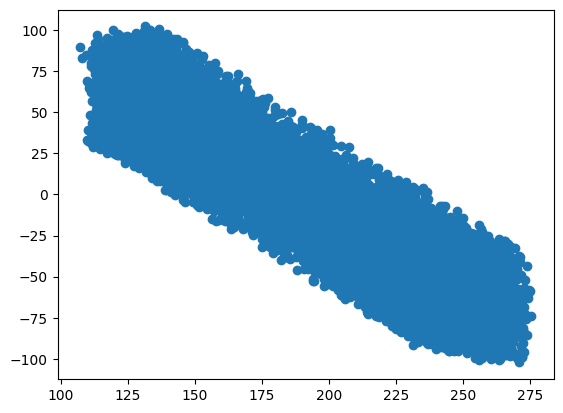

In [16]:
# scatter plot
plt.scatter(x,y)

This figure presents a scatter plot of positions (x,y) where the ball hit the ground over the ensemble of 10,000 swings. Thus, we can generate a distribution of "resultant outcomes" by sampling the "aiming inputs" probability distribution. You can think of the wind as a transform between the input and the output distributions. The next goal is to measure the difference between the distribution center (e.g. mean or median) and a given location for the hole. This next level of analysis will be left to be developed in the `analyzer` module of the source code. For now, let's do a coarse illustration of the idea and plot a few histograms...

#### p_final distribution: Hist in X,Y

(array([ 692., 1505., 1184.,  906.,  875.,  842., 1005., 1402., 1079.,
         510.]),
 array([107.32030486, 124.1380436 , 140.95578234, 157.77352108,
        174.59125983, 191.40899857, 208.22673731, 225.04447605,
        241.8622148 , 258.67995354, 275.49769228]),
 <BarContainer object of 10 artists>)

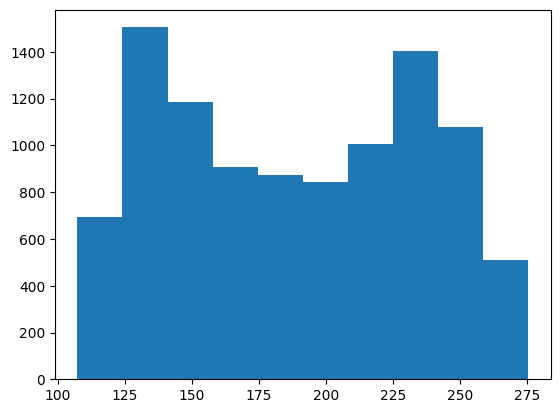

In [17]:
# hist x
plt.hist(x)

On visual inspection, the mean x-position appears to be ~185m. We'll calculate this later.

(array([ 343.,  883., 1225., 1447., 1082., 1147., 1354., 1245.,  928.,
         346.]),
 array([-1.02170241e+02, -8.17481416e+01, -6.13260420e+01, -4.09039423e+01,
        -2.04818427e+01, -5.97430559e-02,  2.03623566e+01,  4.07844562e+01,
         6.12065558e+01,  8.16286555e+01,  1.02050755e+02]),
 <BarContainer object of 10 artists>)

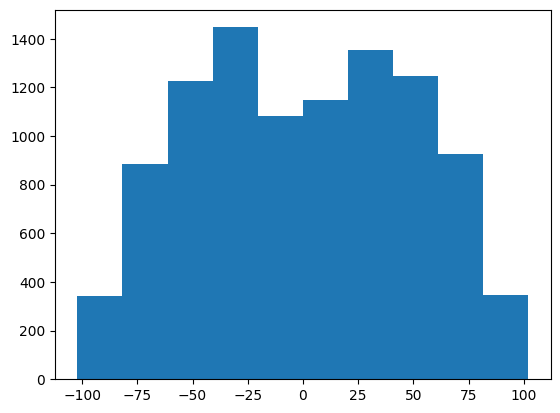

In [18]:
# hist y
plt.hist(y)

On visual inspection, the mean y-position appears to be ~0m. We'll calculate this later.

#### p_final distribution: Hist in R_hole.

Suppose the hole location is at (200, 0). We'll apply the distance formula to each point in the scatter plot, and generate a histogram of these distances from the hole.

In [24]:
# calculate radial distances from hole
hole = [200,0]
r = [np.sqrt((x-hole[0])**2+(y-hole[1])**2) for x,y in zip(x,y)]
print(len(r))
print(r[0], r[-1])

10000
65.68155542926579 83.77317971622827


(array([ 394.,  986., 1213., 1291., 1413., 1422., 1455., 1113.,  586.,
         127.]),
 array([  0.49372824,  13.45374891,  26.41376957,  39.37379024,
         52.33381091,  65.29383158,  78.25385224,  91.21387291,
        104.17389358, 117.13391425, 130.09393491]),
 <BarContainer object of 10 artists>)

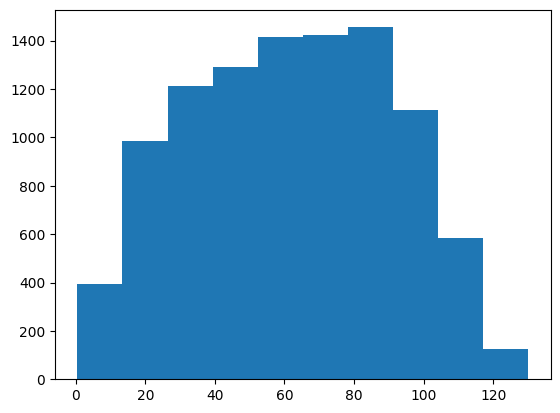

In [25]:
plt.hist(r)

On visual inspection, the mean distance from the hole appears to be ~65m.

## Step 4: Conclusion

We ran a "windy golfing" Monte Carlo simulation of 10,000 trials via a RESTful implementation involving URL endpoints, django views, and models to store the input and output data. The simulation utilized oscillatory winds, a spherical aiming geometry, and uniform probability distributions for the swing timing, initial speed delivered to the ball, and aiming coordinates. Finally, we queried the database to load the ensemble of final ball positions and then visualized the resulting distribution in the form of a scatter plot and histograms in (X, Y) as well as calculating and plotting a histogram of R, the linear distance from each final ball position to the hole at the point (100,0).

The next step will be to write an `analyzers.py` module to perform these and similar analyses for final distribution, distance from hole, etc in more detail.

Items computed by the analyzer should include:
* scatter-plot dataset of p_final
* heatmap dataset of p_final
* histogram datasets of p_final (x and y)
* mean position (x,y) of p_final
* distance between the mean position of p_final and the hole position
* dataset of r, computed from p_final, which is the linear distance between p_final and the hole.
* histogram of r dataset
* mean r

Some combination of these parameters will provide the "feedback signal" to train a machine learning model that seeks to optimize swing input parameters to maximize the 'quality of the shot' within a provided skill heuristic and constraints such as precision in aiming or timing.